Clonamos el repositorio donde se encuentran los datos con los que vamos a trabajar

In [1]:
!git clone https://github.com/jesussantiyan/TFG.git

Cloning into 'TFG'...
remote: Enumerating objects: 36, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 36 (delta 10), reused 18 (delta 5), pack-reused 0
Unpacking objects: 100% (36/36), 15.23 MiB | 2.96 MiB/s, done.


Realizamos los importes necesarios usados durante todo el cuaderno

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import itertools
import warnings
import numpy as np
import json
from pylab import rcParams
from sklearn.impute import SimpleImputer

###Peparación de las variables externas

Leemos el arhcivo .json donde se encuentran los datos de las variables externas y montamos un dataframe con los mismos

In [3]:
with open('/content/TFG/datos_metereologicos.json', 'r') as file:
    data = json.load(file)

In [4]:
df_clima = pd.DataFrame(data)

In [5]:
df_clima.head()

,fecha,indicativo,nombre,provincia,altitud,tmed,prec,tmin,horatmin,tmax,horatmax,dir,velmedia,racha,horaracha,sol,presMax,horaPresMax,presMin,horaPresMin
0,2020-11-09,4067,MADRIDEJOS,TOLEDO,690,"11,7","2,0","6,6",23:40,"16,8",15:20,21,"2,2","9,2",14:10,"3,2","944,5",Varias,"940,6",03
1,2020-11-10,4067,MADRIDEJOS,TOLEDO,690,"9,6","0,0","3,6",Varias,"15,6",16:00,28,"1,7","6,4",05:40,"5,3","946,9",11,"944,2",03
2,2020-11-11,4067,MADRIDEJOS,TOLEDO,690,"9,0","0,2","2,9",06:50,"15,2",16:00,10,"3,1","6,7",10:30,"3,8","946,0",Varias,"942,4",Varias
3,2020-11-12,4067,MADRIDEJOS,TOLEDO,690,"9,6","0,0","3,3",06:10,"15,8",14:40,10,"2,8","9,7",13:10,"6,6","943,5",00,"939,5",16
4,2020-11-13,4067,MADRIDEJOS,TOLEDO,690,"10,2","0,2","3,7",07:00,"16,7",14:40,11,"0,8","6,7",09:40,"7,3","941,3",11,"939,3",15


Quitamos las columnas que no parecen importantes para nuestro proyecto

In [6]:
df_clima.drop(['indicativo','nombre','provincia','horatmin','horatmax','horaracha','horaPresMax','horaPresMin','altitud'], axis=1, inplace=True)
df_clima.head()

,fecha,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,"11,7","2,0","6,6","16,8",21,"2,2","9,2","3,2","944,5","940,6"
1,2020-11-10,"9,6","0,0","3,6","15,6",28,"1,7","6,4","5,3","946,9","944,2"
2,2020-11-11,"9,0","0,2","2,9","15,2",10,"3,1","6,7","3,8","946,0","942,4"
3,2020-11-12,"9,6","0,0","3,3","15,8",10,"2,8","9,7","6,6","943,5","939,5"
4,2020-11-13,"10,2","0,2","3,7","16,7",11,"0,8","6,7","7,3","941,3","939,3"


Ponemos la columna fecha en su formato correcto

In [7]:
df_clima['fecha'] = pd.to_datetime(df_clima['fecha'])
df_clima.head()

,fecha,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,"11,7","2,0","6,6","16,8",21,"2,2","9,2","3,2","944,5","940,6"
1,2020-11-10,"9,6","0,0","3,6","15,6",28,"1,7","6,4","5,3","946,9","944,2"
2,2020-11-11,"9,0","0,2","2,9","15,2",10,"3,1","6,7","3,8","946,0","942,4"
3,2020-11-12,"9,6","0,0","3,3","15,8",10,"2,8","9,7","6,6","943,5","939,5"
4,2020-11-13,"10,2","0,2","3,7","16,7",11,"0,8","6,7","7,3","941,3","939,3"


Reemplazamos las comas de los valores decimales por puntos y obtener una consistencia entre datos

In [8]:
columnas = ['tmed', 'prec', 'tmin', 'tmax', 'dir', 'velmedia', 'racha', 'sol', 'presMax', 'presMin']

for columna in columnas:
    df_clima[columna] = df_clima[columna].str.replace(',', '.')

df_clima.head()

,fecha,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,11.7,2.0,6.6,16.8,21,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,9.6,0.0,3.6,15.6,28,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,9.0,0.2,2.9,15.2,10,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,9.6,0.0,3.3,15.8,10,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,10.2,0.2,3.7,16.7,11,0.8,6.7,7.3,941.3,939.3


Imputamos los valores NaN, cambiandolos por una media

In [9]:
imputer = SimpleImputer(strategy='mean')

for columna in columnas:
    df_clima[columna] = imputer.fit_transform(df_clima[[columna]])

df_clima.head()

,fecha,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3


#Datos de un solo cliente

##Datos del primer cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [10]:
df_cliente1 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente1.csv', sep=',')
df_cliente1.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,126.0
1,2020-11-09 01:00:00,80.0
2,2020-11-09 02:00:00,49.0
3,2020-11-09 03:00:00,103.0
4,2020-11-09 04:00:00,122.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [11]:
df_cliente1['FechaHora'] = pd.to_datetime(df_cliente1['FechaHora'])

###Datos originales

Ponemos como indices del dataset las fechas para poder realizar una visualización de los datos del mismo

In [12]:
df_cliente1 = df_cliente1.set_index('FechaHora')
df_cliente1.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Preparamos los datos para una correcta visualización gráfica

In [13]:
y_cliente1 = df_cliente1['Consumo']
y_cliente1['2020':]

FechaHora
2020-11-09 00:00:00    126.0
2020-11-09 01:00:00     80.0
2020-11-09 02:00:00     49.0
2020-11-09 03:00:00    103.0
2020-11-09 04:00:00    122.0
                       ...  
2022-09-17 19:00:00    212.0
2022-09-17 20:00:00    212.0
2022-09-17 21:00:00    212.0
2022-09-17 22:00:00    212.0
2022-09-17 23:00:00    212.0
Name: Consumo, Length: 16272, dtype: float64

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante irregular por lo que puede que no se trate de su vivienda habitual siendo usada durante periodos vacacionales como se puede ver en su consumo más elevado durante navidad o las vacaciones de verano

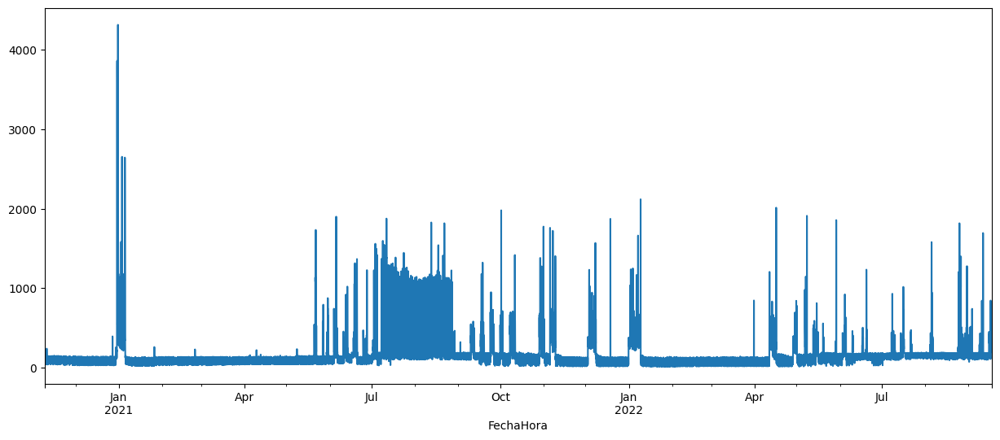

In [ ]:
y_cliente1.plot(figsize=(15, 6))
plt.show()

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

Se ha probado a cambiar a escala logarítmica para comporbar si se podía visualizar la gráfica "seasonal" sin obtener resultados

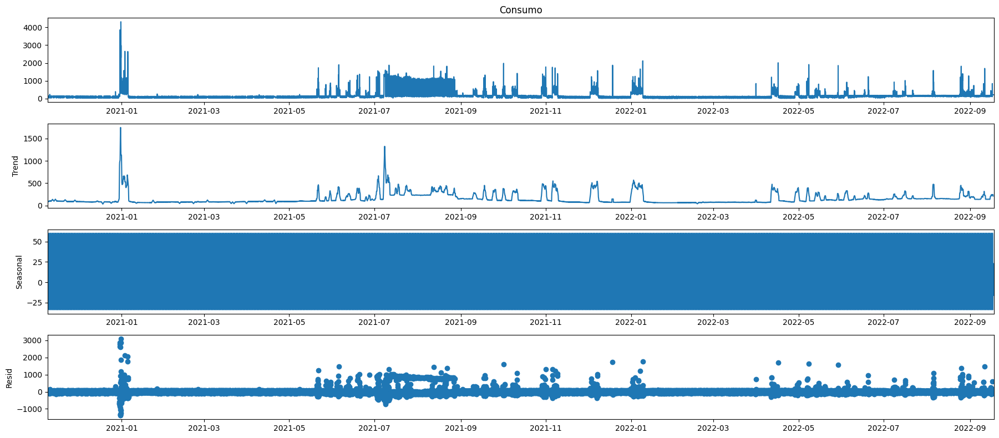

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(y_cliente1, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [14]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_cliente1,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:225714.13020200978
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:222027.2974172074
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:221780.61294542765
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:213682.62081062002
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:218206.65735324877
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:213689.69837215845
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:215469.31112128857
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:213684.53633434238
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:215308.5658593024
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:213403.4091374451
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:216890.8685180627
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:207606.62620833243
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:211820.88103732635
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:207659.89853448537
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:210411.21822726098
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:207608.6063373041
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:209672.91689237228
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:209529.697107627

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod = sm.tsa.statespace.SARIMAX(y_cliente1, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo. Con order=(1, 1, 1) especificamos los órdenes del componente, autoregresivo (AR), diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1), I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results = mod.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [15]:
mod = sm.tsa.statespace.SARIMAX(y_cliente1,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()

print(results.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5217      0.002    230.210      0.000       0.517       0.526
ma.L1         -1.0681      0.001   -756.948      0.000      -1.071      -1.065
ar.S.L12      -0.1279      0.004    -33.684      0.000      -0.135      -0.120
ma.S.L12      -0.9425      0.001   -716.478      0.000      -0.945      -0.940
sigma2      1.511e+04     49.832    303.266      0.000     1.5e+04    1.52e+04


Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

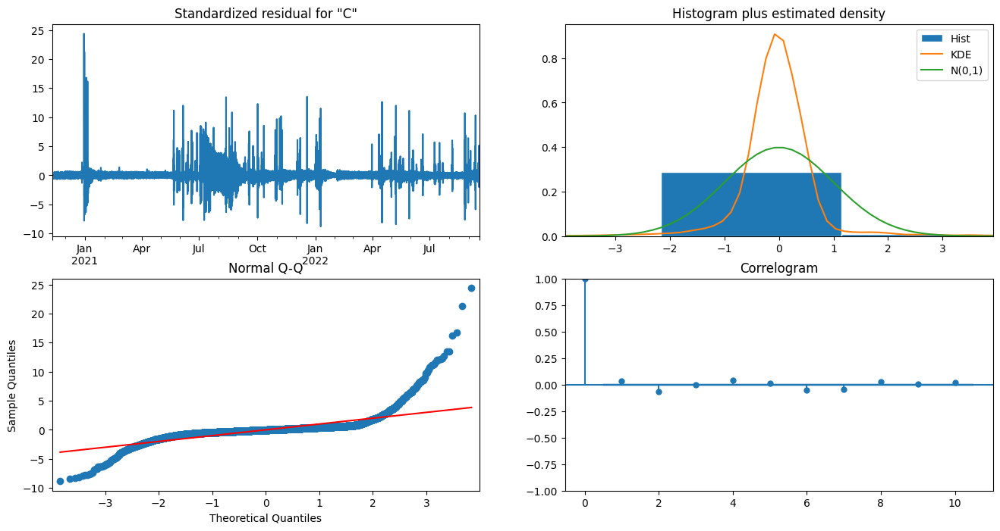

In [ ]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred = results.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_ci = pred.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_cliente1['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_ci.index son los índices de tiempo del intervalo de confianza, pred_ci.iloc[:, 0] son los límites inferiores y pred_ci.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

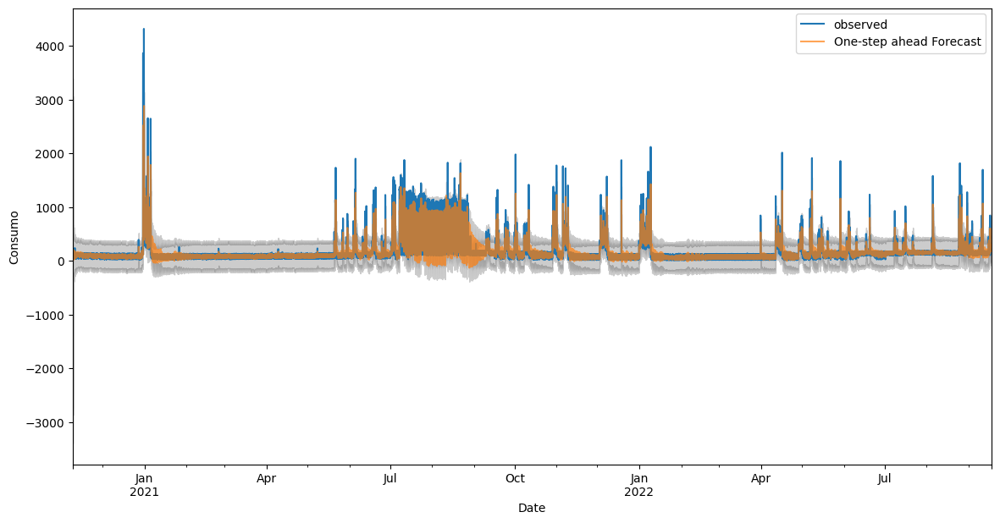

In [16]:
pred = results.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)
pred_ci = pred.conf_int()

ax = y_cliente1['2020':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [17]:
y_forecasted = pred.predicted_mean
y_truth = y_cliente1['2020-11-09':]

mse = ((y_forecasted - y_truth) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse), 2)))

Error cuadrático medio: 17222.86
Raiz del error cuadrático medio:131.24


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [ ]:
pred_df_cliente1 = pd.DataFrame(index=pred.predicted_mean.index)

pred_df_cliente1['Consumo'] = df_cliente1['Consumo']

pred_df_cliente1['Predicted'] = pred.predicted_mean

pred_df_cliente1['Lower Bound'] = pred_ci.iloc[:, 0]
pred_df_cliente1['Upper Bound'] = pred_ci.iloc[:, 1]

In [ ]:
pred_df_cliente1.to_csv('predicciones_cliente1.csv', index=True)

A partir de este punto los datos usados estarán agrupados por días, es decir, asignaremos a cada día el consumo total realizado en ese día y probaremos a añadir valirables externas para ver que efecto tienen en la predicción

###Datos agrupados con variables externas

Creamos un nueva columna "fecha" que tendrá todas las fechas sin la parte horaria y agrupamos con la columna de consumo para tener el total de energía que se consumio ese día

In [ ]:
df_cliente1['fecha'] = df_cliente1['FechaHora'].dt.date
df_agrupado1 = df_cliente1.groupby('fecha')['Consumo'].sum().reset_index()
df_agrupado1.head()

,fecha,Consumo
0,2020-11-09,2290.0
1,2020-11-10,2370.0
2,2020-11-11,2412.0
3,2020-11-12,3312.0
4,2020-11-13,2322.0


Convertimos las fechas de la columna "fecha" a su tipo correcto

In [ ]:
df_agrupado1['fecha'] = pd.to_datetime(df_agrupado1['fecha'])

Juntamos los dataframe con los datos agrupados y las variables externas previamente preparadas usando de pivote la columna fecha, la cual debe coincidir en ambas tablas para se haga correctamente

In [ ]:
df_total = pd.merge(df_agrupado1, df_clima, on='fecha')
df_total

,fecha,Consumo,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,2290.0,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,2370.0,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,2412.0,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,3312.0,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,2322.0,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3
...,...,...,...,...,...,...,...,...,...,...,...,...
652,2022-09-13,3324.0,22.2,1.0,17.8,26.6,19.0,4.7,16.7,6.0,932.6,930.1
653,2022-09-14,3434.0,21.2,0.0,16.1,26.3,23.0,3.3,13.9,6.7,935.3,931.7
654,2022-09-15,4913.0,20.4,0.6,16.2,24.6,30.0,1.7,11.4,4.6,936.5,934.6
655,2022-09-16,5464.0,21.0,0.0,14.2,27.9,29.0,1.7,7.8,12.0,936.6,933.2


Convertimos las fechas de la columna "fecha" de la tabla df_total a su tipo correcto y los asiganmos como índices

In [ ]:
df_total['fecha'] = pd.to_datetime(df_total['fecha'])
df_total = df_total.set_index('fecha')
df_total.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=657, freq=None)

Realizamos una visualización de cada una de las variables que tenemos en el dataframe

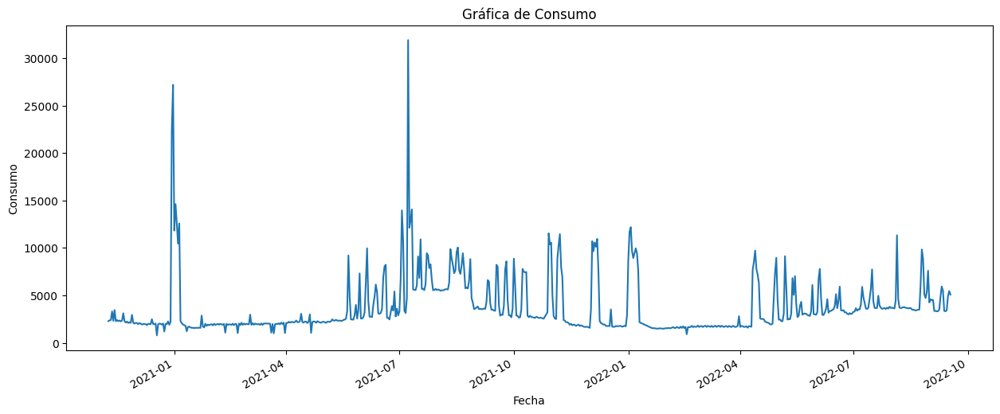

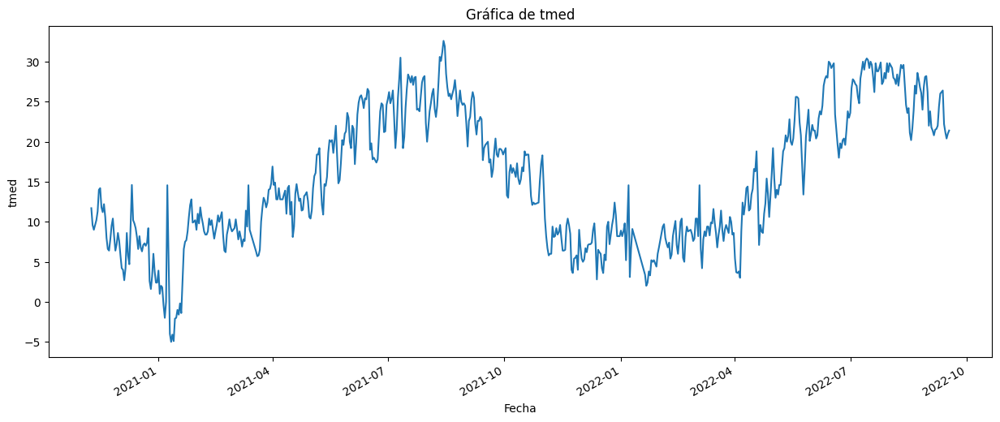

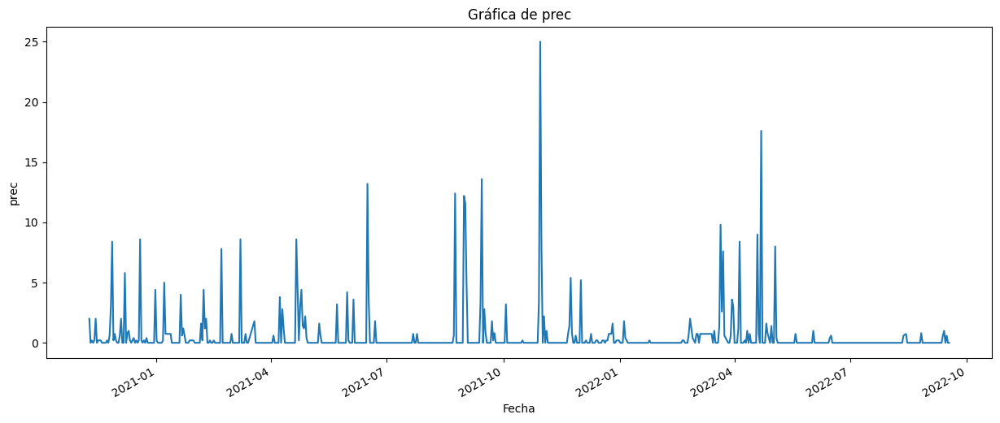

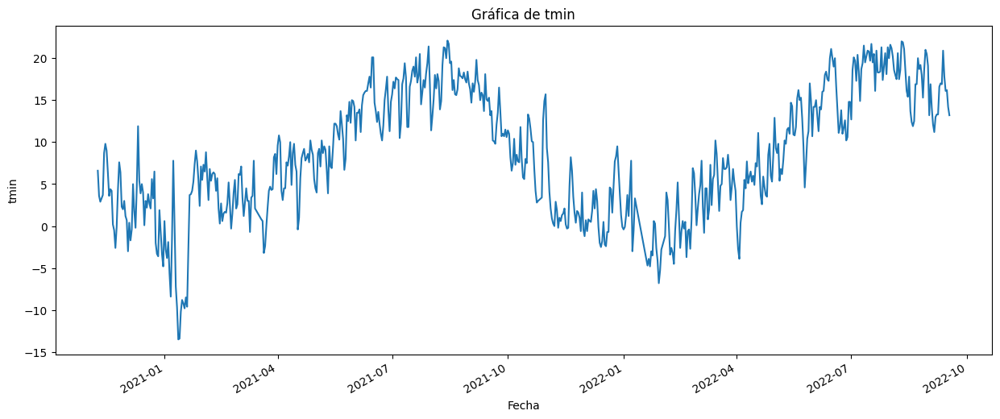

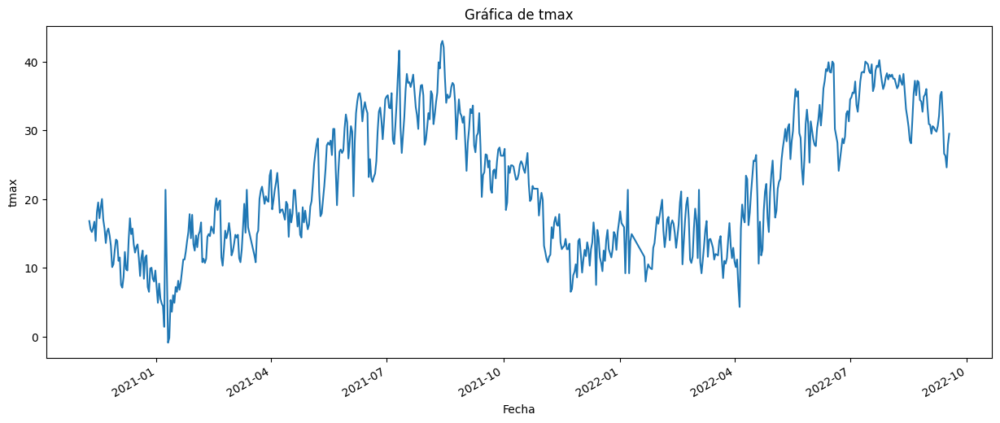

...

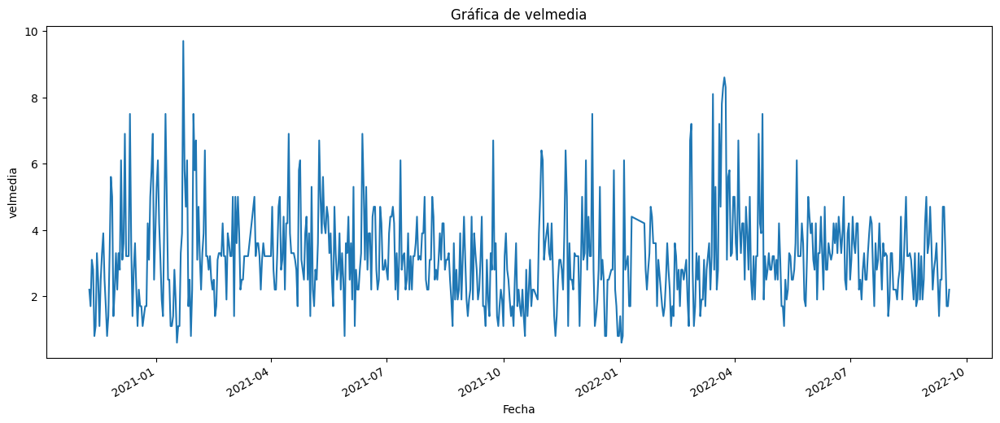

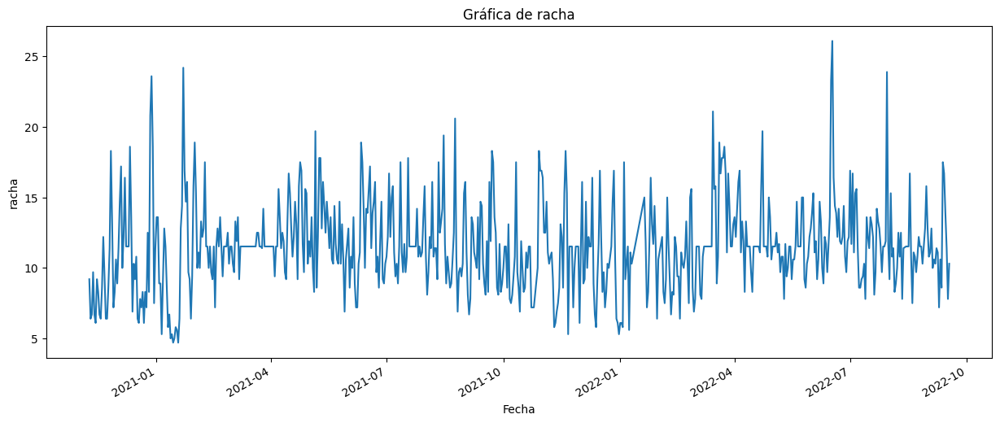

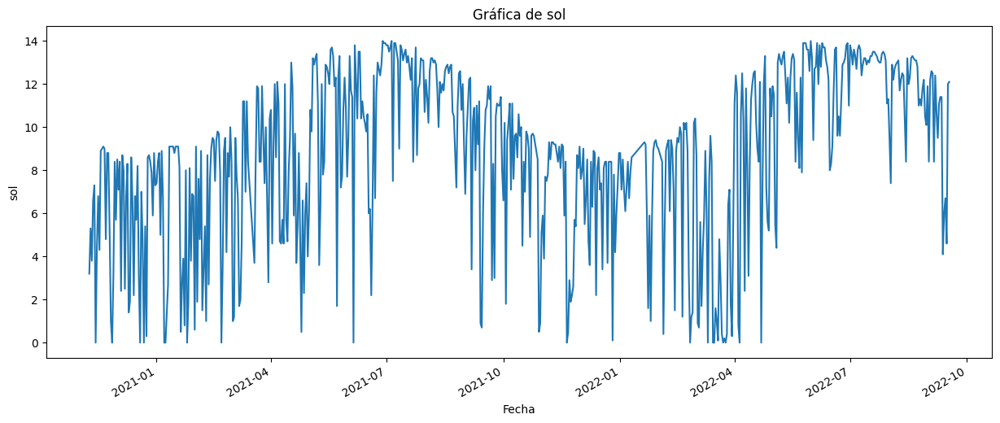

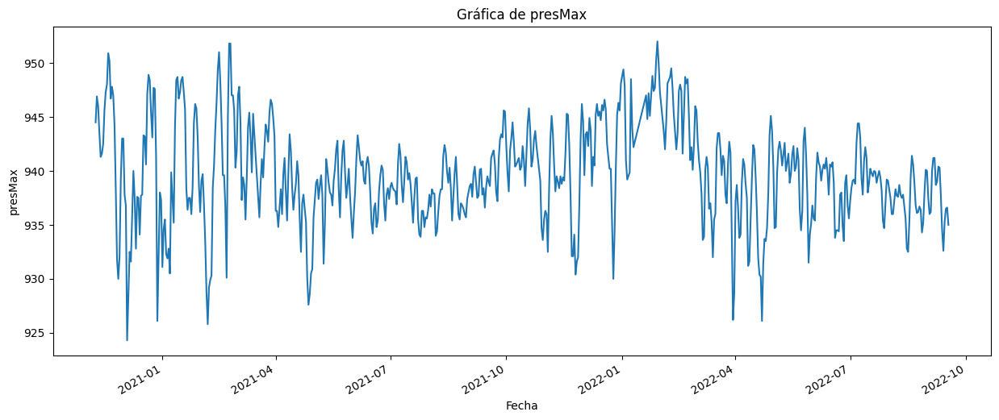

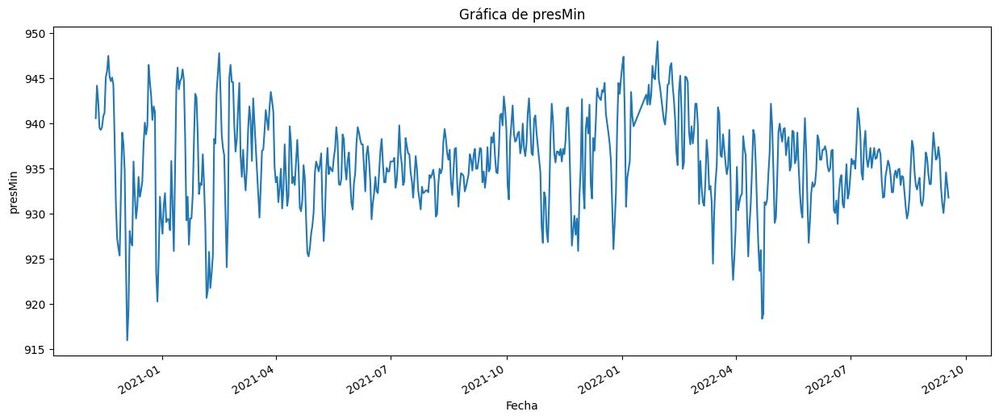

In [ ]:
for column in df_total.columns:
  if column != 'fecha':
    fig, ax = plt.subplots(figsize=(15, 6))

    df_total[column].plot(ax=ax)

    ax.set_title(f'Gráfica de {column}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel(column)

    plt.show()

Ponemos como indices del dataframe agrupado las fechas del mismo para poder realizar una visualización de la descompisción de los datos

In [ ]:
df_agrupado1 = df_agrupado1.set_index('fecha')
df_agrupado1.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=678, freq=None)

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

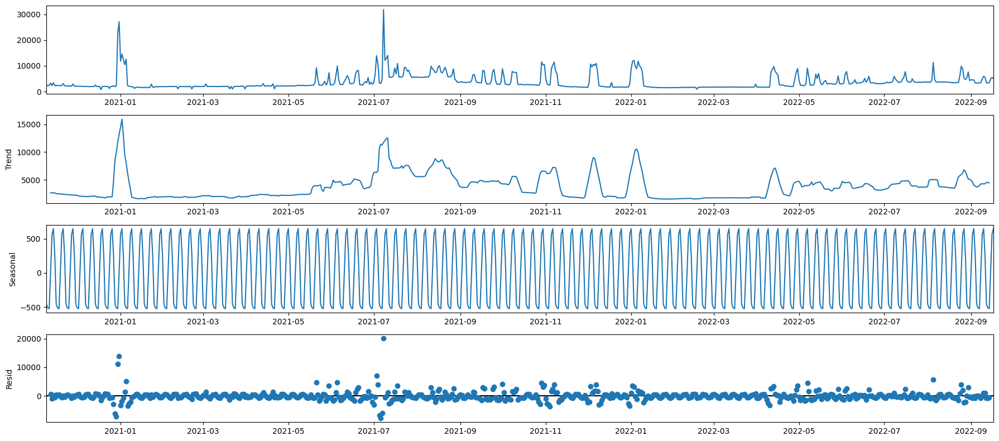

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(df_agrupado1, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_total['Consumo'], exog=df_total.drop('Consumo', axis=1),
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:12294.319701009576
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:12080.209822842164
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:16057.14911501699
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:11948.617835422765
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:12097.49612937395
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:12082.050816828298
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:12140.760747669417
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:11937.600031618123
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:12014.94931982103
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:11807.093324722504
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:12273.313568442434
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:11771.804788010057
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:11841.725860098972
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:11812.518769096088
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:11928.884887284747
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:11780.814886537904
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:12009.197831519079
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:11795.98746464

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod = sm.tsa.statespace.SARIMAX(df_total['Consumo'], exog=df_total.drop('Consumo', axis=1), order=(0, 1, 0), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo, indicando en exog las variables exógenas que se utilizarán en el modelo. Con order=(0, 1, 0) especificamos los órdenes del componente,  diferenciación (I) del modelo SARIMAX. En este caso, utilizamos una componente estacional I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results = mod.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [ ]:
mod_agrupado = sm.tsa.statespace.SARIMAX(df_total['Consumo'], exog=df_total.drop('Consumo', axis=1),
                                order=(0, 1, 0),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_grouped = mod_agrupado.fit()

print(results_grouped.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
tmed        3605.5859   3015.540      1.196      0.232   -2304.765    9515.937
prec          -7.0817     90.576     -0.078      0.938    -184.607     170.443
tmin       -1761.3628   1520.049     -1.159      0.247   -4740.604    1217.879
tmax       -1764.8532   1503.110     -1.174      0.240   -4710.895    1181.189
dir            9.1155      4.936      1.847      0.065      -0.559      18.790
velmedia    -146.8925    130.147     -1.129      0.259    -401.976     108.191
racha        -49.5470     54.386     -0.911      0.362    -156.142      57.048
sol            6.4816     58.814      0.110      0.912    -108.792     121.756
presMax       -0.3598     71.274     -0.005      0.996    -140.055     139.336
presMin        3.4858     70.612      0.049      0.961    -134.911     141.883
ma.S.L12      -0.9867      0.103     -9.598      0.0

Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

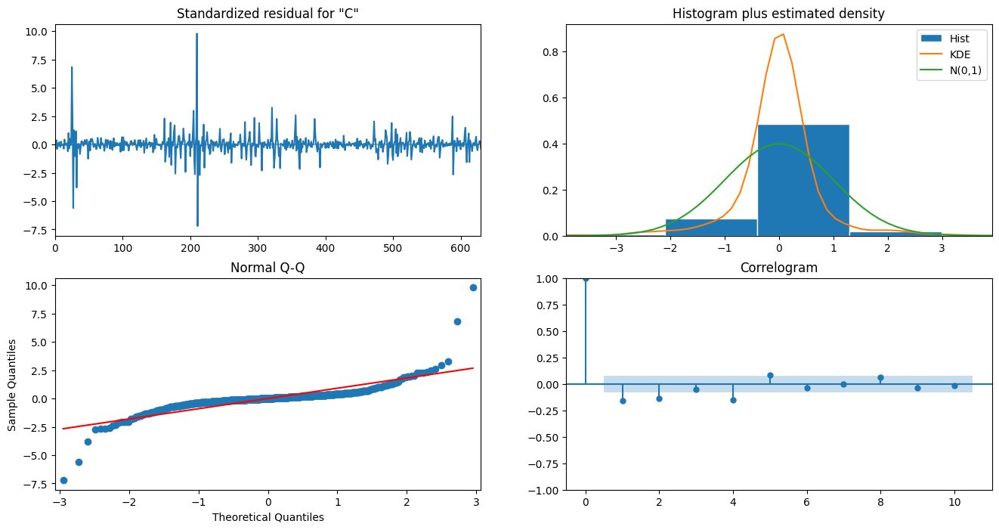

In [ ]:
results_grouped.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_agrupado = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),exog=df_total.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 hasta el 17 de septiembre de 2022, con exog le especificamos las variables que tendrá en cuenta como externas y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_agrupado_ci = pred_agrupado.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_centro['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_agrupado.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred_agrupado.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_agrupado_ci.index, pred_agrupado_ci.iloc[:, 0], pred_agrupado_ci.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_agrupado_ci.index son los índices de tiempo del intervalo de confianza, pred_agrupado_ci.iloc[:, 0] son los límites inferiores y pred_agrupado_ci.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

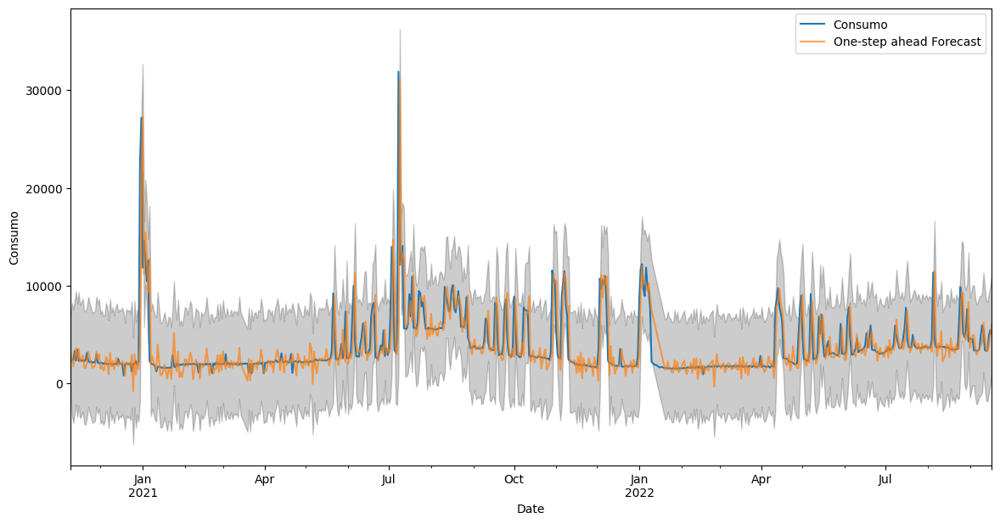

In [ ]:
pred_agrupado = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),
                                       exog=df_total.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False)
pred_agrupado_ci = pred_agrupado.conf_int()

ax = df_agrupado1['2020':].plot(label='observed')
pred_agrupado.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_agrupado_ci.index,
                pred_agrupado_ci.iloc[:, 0],
                pred_agrupado_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [ ]:
y_forecasted_agrupado = pred_agrupado.predicted_mean
y_truth_agrupado = df_total.loc['2020-11-09':'2022-09-17']['Consumo']

mse_agrupado = ((y_forecasted_agrupado - y_truth_agrupado) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_agrupado, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_agrupado), 2)))

Error cuadrático medio: 5550989.32
Raiz del error cuadrático medio:2356.05


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [ ]:
pred_agrupado_df_cliente1 = pd.DataFrame(index=pred_agrupado.predicted_mean.index)

pred_agrupado_df_cliente1['Consumo'] = df_agrupado1['Consumo']

pred_agrupado_df_cliente1['Predicted'] = pred_agrupado.predicted_mean

pred_agrupado_df_cliente1['Lower Bound'] = pred_agrupado_ci.iloc[:, 0]
pred_agrupado_df_cliente1['Upper Bound'] = pred_agrupado_ci.iloc[:, 1]

In [ ]:
pred_agrupado_df_cliente1.to_csv('predicciones_agrupado_cliente1.csv', index=True)

##Datos del segundo cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [43]:
df_cliente2 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente2.csv', sep=',')
df_cliente2.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,2.0
1,2020-11-09 01:00:00,28.0
2,2020-11-09 02:00:00,109.0
3,2020-11-09 03:00:00,106.0
4,2020-11-09 04:00:00,4.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [44]:
df_cliente2['FechaHora'] = pd.to_datetime(df_cliente2['FechaHora'])

###Datos originales

Ponemos como indices del dataset las fechas para poder realizar una visualización de los datos del mismo

In [45]:
df_cliente2 = df_cliente2.set_index('FechaHora')
df_cliente2.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Preparamos los datos para una correcta visualización gráfica

In [46]:
y_cliente2 = df_cliente2['Consumo']
y_cliente2['2020':]

FechaHora
2020-11-09 00:00:00      2.0
2020-11-09 01:00:00     28.0
2020-11-09 02:00:00    109.0
2020-11-09 03:00:00    106.0
2020-11-09 04:00:00      4.0
                       ...  
2022-09-17 19:00:00      0.0
2022-09-17 20:00:00      0.0
2022-09-17 21:00:00      0.0
2022-09-17 22:00:00      0.0
2022-09-17 23:00:00      0.0
Name: Consumo, Length: 16272, dtype: float64

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante constante y alto durante todos los meses siendo más bajo el consumo en verano

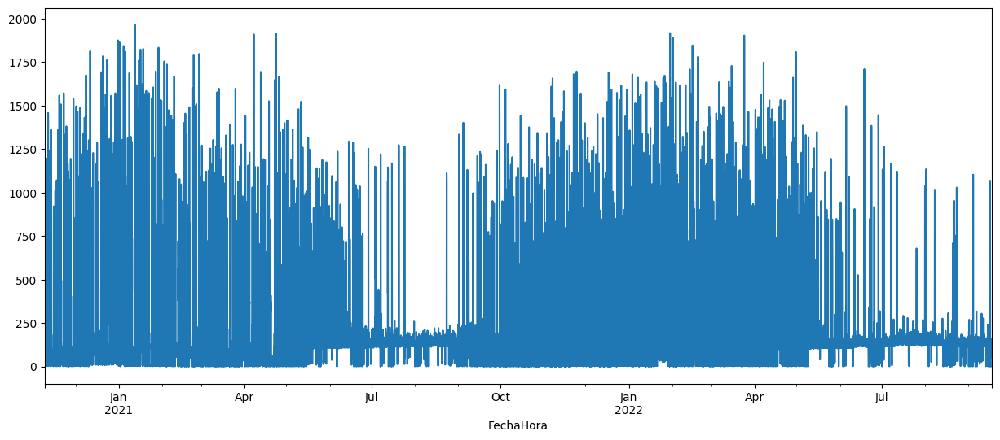

In [7]:
y_cliente2.plot(figsize=(15, 6))
plt.show()

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

Se ha probado a cambiar a escala logarítmica para comporbar si se podía visualizar la gráfica "seasonal" sin obtener resultados

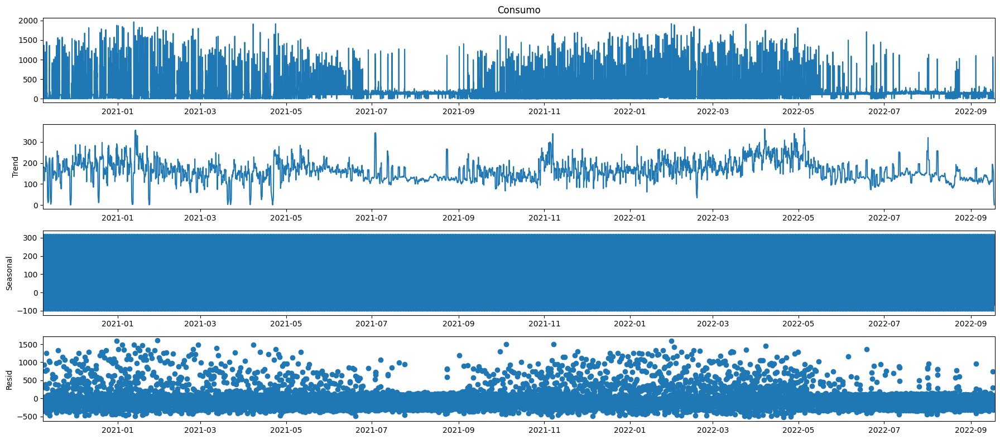

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log1p(y)
decomposition = sm.tsa.seasonal_decompose(y_cliente2, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [8]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_cliente2,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:231627.26545544405
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:231156.72532916034
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:239184.0706204035
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:223810.020597706
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:230830.87662546078
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:223990.5814957387
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:226470.3892915669
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:222059.91676056324
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:227296.44494829274
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:226974.8210526053
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:236114.8116413418
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:221924.24176298207
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:226881.01999242473
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:222104.66320780458
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:225742.0382793544
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:220968.99821045983
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:229843.88042386435
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:229665.75621151313


De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod2 = sm.tsa.statespace.SARIMAX(y_cliente2, order=(0, 1, 1), seasonal_order=(1, 0, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo. Con order=(0, 1, 1) especificamos los órdenes del componente, diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results2 = mod2.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results2.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [47]:
mod2 = sm.tsa.statespace.SARIMAX(y_cliente2,
                                order=(0, 1, 1),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results2 = mod2.fit()

print(results2.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9954      0.001  -1310.239      0.000      -0.997      -0.994
ar.S.L12      -0.9978      0.000  -2437.655      0.000      -0.999      -0.997
ma.S.L12       0.9649      0.002    519.892      0.000       0.961       0.969
sigma2      4.649e+04    247.501    187.852      0.000     4.6e+04     4.7e+04


Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

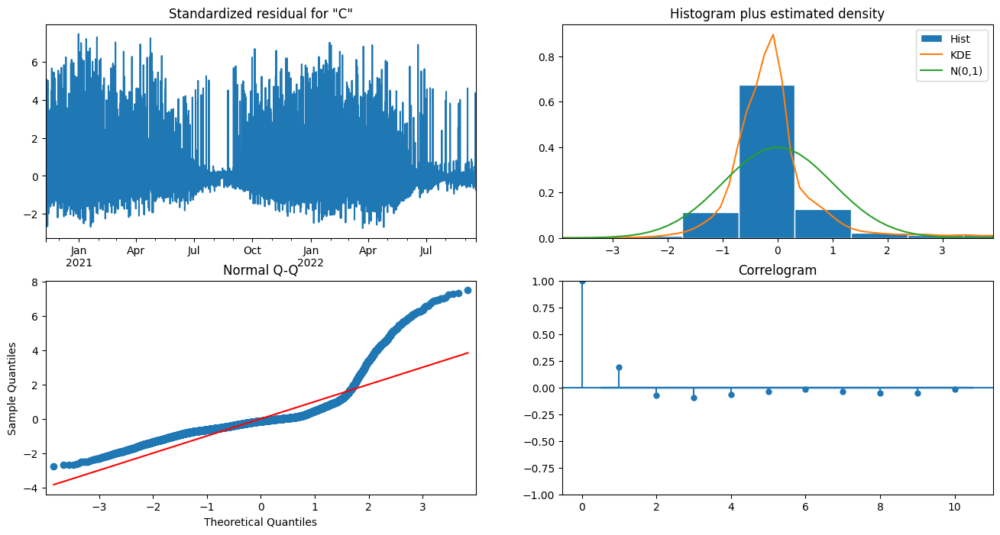

In [10]:
results2.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred2 = results2.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_ci2 = pred2.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_cliente2['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred2.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_ci2.index, pred_ci2.iloc[:, 0], pred_ci2.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_ci2.index son los índices de tiempo del intervalo de confianza, pred_ci2.iloc[:, 0] son los límites inferiores y pred_ci2.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

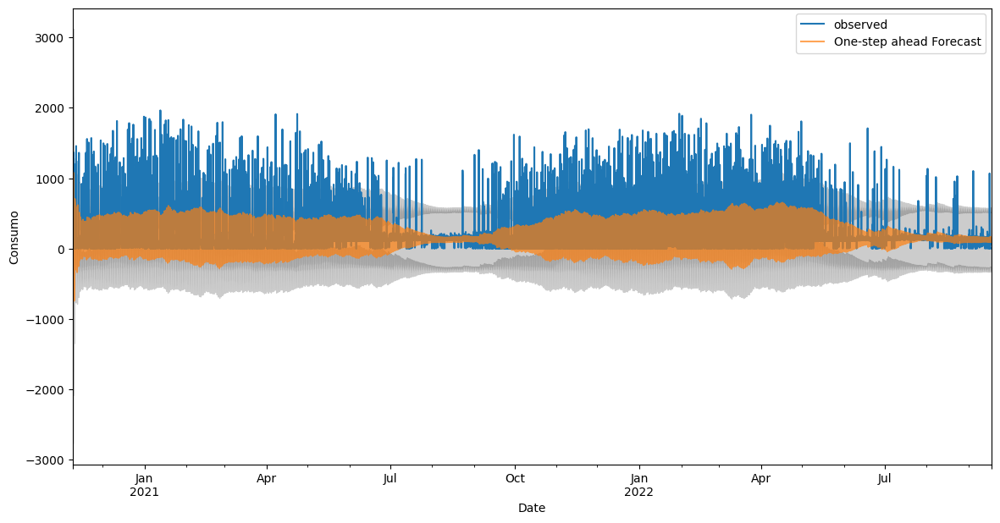

In [48]:
pred2 = results2.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)
pred_ci2 = pred2.conf_int()

ax = y_cliente2['2020':].plot(label='observed')
pred2.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci2.index,
                pred_ci2.iloc[:, 0],
                pred_ci2.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [49]:
y_forecasted2 = pred2.predicted_mean
y_truth2 = y_cliente2['2020-11-09':]

mse2 = ((y_forecasted2 - y_truth2) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse2, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse2), 2)))

Error cuadrático medio: 46779.55
Raiz del error cuadrático medio:216.29


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [14]:
pred_df_cliente2 = pd.DataFrame(index=pred2.predicted_mean.index)

pred_df_cliente2['Consumo'] = df_cliente2['Consumo']

pred_df_cliente2['Predicted'] = pred2.predicted_mean

pred_df_cliente2['Lower Bound'] = pred_ci2.iloc[:, 0]
pred_df_cliente2['Upper Bound'] = pred_ci2.iloc[:, 1]

In [ ]:
pred_df_cliente2.to_csv('predicciones_cliente2.csv', index=True)

A partir de este punto los datos usados estarán agrupados por días, es decir, asignaremos a cada día el consumo total realizado en ese día y probaremos a añadir valirables externas para ver que efecto tienen en la predicción

###Datos agrupados con variables externas

Creamos un nueva columna "fecha" que tendrá todas las fechas sin la parte horaria y agrupamos con la columna de consumo para tener el total de energía que se consumio ese día

In [ ]:
df_cliente2['fecha'] = df_cliente2['FechaHora'].dt.date
df_agrupado2 = df_cliente2.groupby('fecha')['Consumo'].sum().reset_index()
df_agrupado2.head()

,fecha,Consumo
0,2020-11-09,4272.0
1,2020-11-10,3832.0
2,2020-11-11,4830.0
3,2020-11-12,312.0
4,2020-11-13,5355.0


Convertimos las fechas de la columna "fecha" a su tipo correcto

In [ ]:
df_agrupado2['fecha'] = pd.to_datetime(df_agrupado2['fecha'])

Juntamos los dataframe con los datos agrupados y las variables externas previamente preparadas usando de pivote la columna fecha, la cual debe coincidir en ambas tablas para se haga correctamente

In [ ]:
df_total2 = pd.merge(df_agrupado2, df_clima, on='fecha')
df_total2

,fecha,Consumo,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,4272.0,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,3832.0,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,4830.0,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,312.0,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,5355.0,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3
...,...,...,...,...,...,...,...,...,...,...,...,...
652,2022-09-13,2566.0,22.2,1.0,17.8,26.6,19.0,4.7,16.7,6.0,932.6,930.1
653,2022-09-14,2719.0,21.2,0.0,16.1,26.3,23.0,3.3,13.9,6.7,935.3,931.7
654,2022-09-15,2747.0,20.4,0.6,16.2,24.6,30.0,1.7,11.4,4.6,936.5,934.6
655,2022-09-16,4428.0,21.0,0.0,14.2,27.9,29.0,1.7,7.8,12.0,936.6,933.2


Convertimos las fechas de la columna "fecha" de la tabla df_total a su tipo correcto y los asiganmos como índices

In [ ]:
df_total2['fecha'] = pd.to_datetime(df_total2['fecha'])
df_total2 = df_total2.set_index('fecha')
df_total2.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=657, freq=None)

Realizamos una visualización de cada una de las variables que tenemos en el dataframe

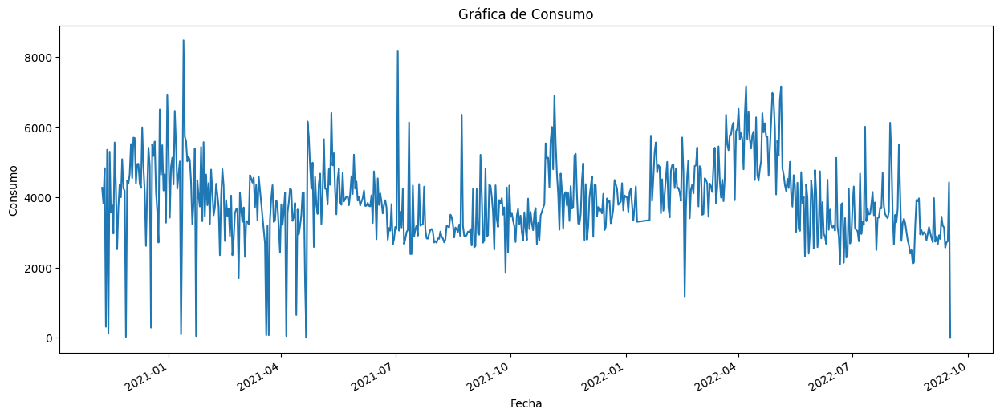

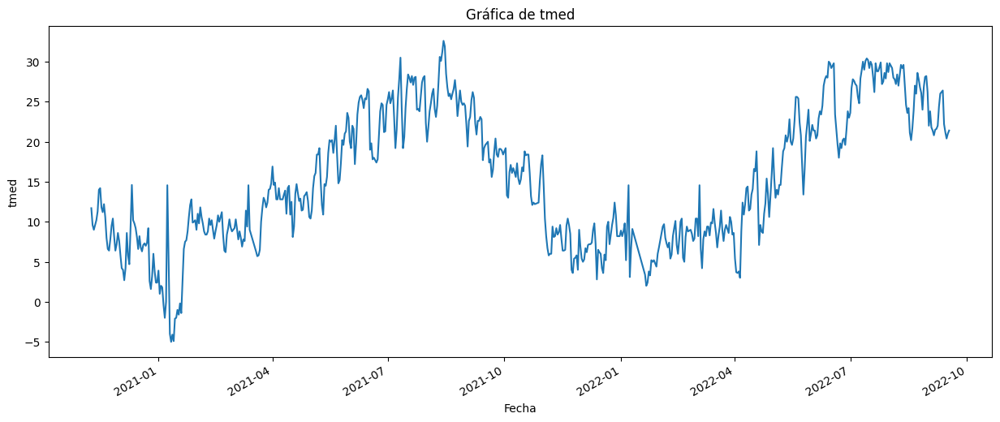

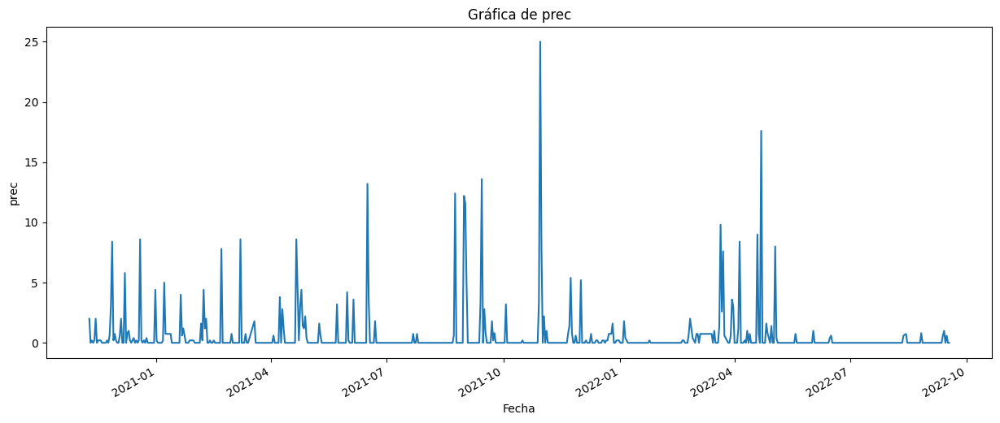

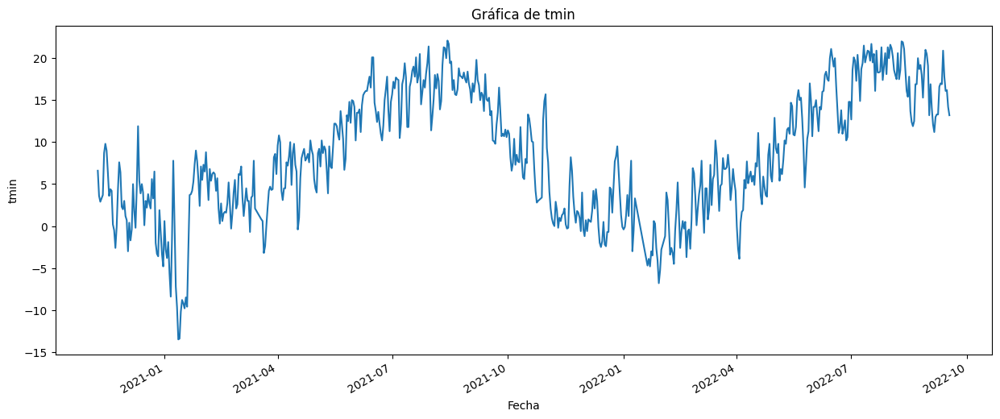

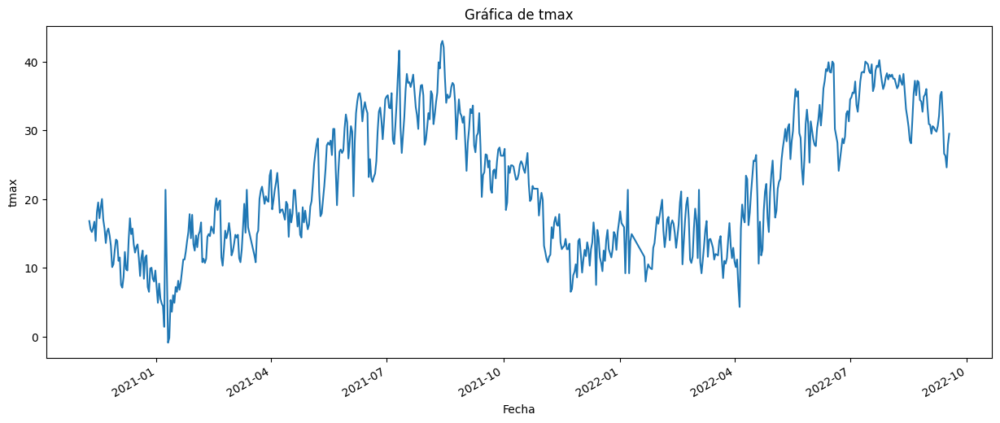

...

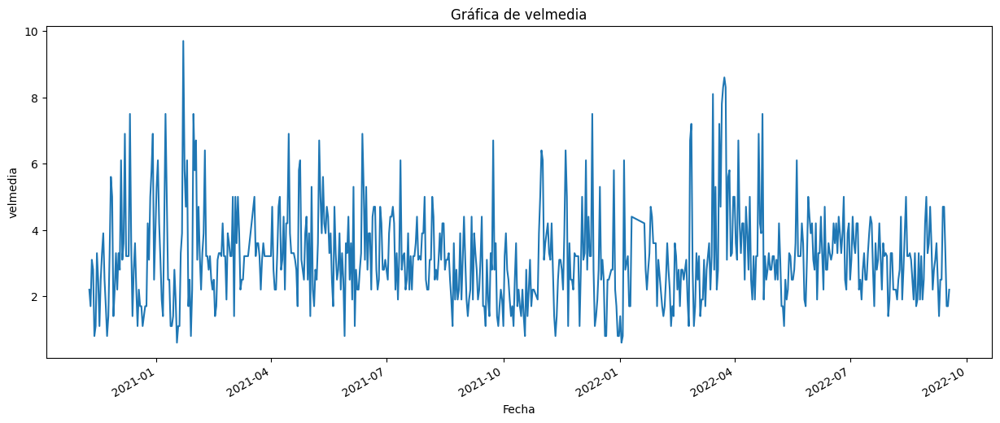

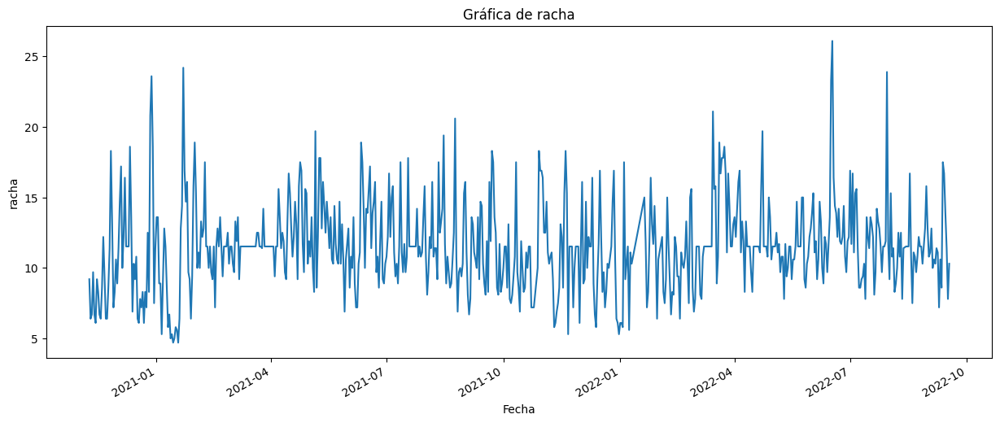

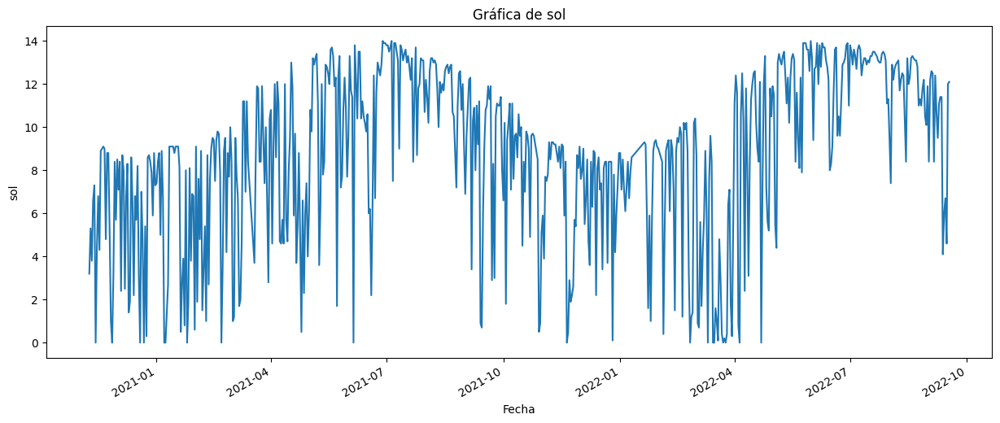

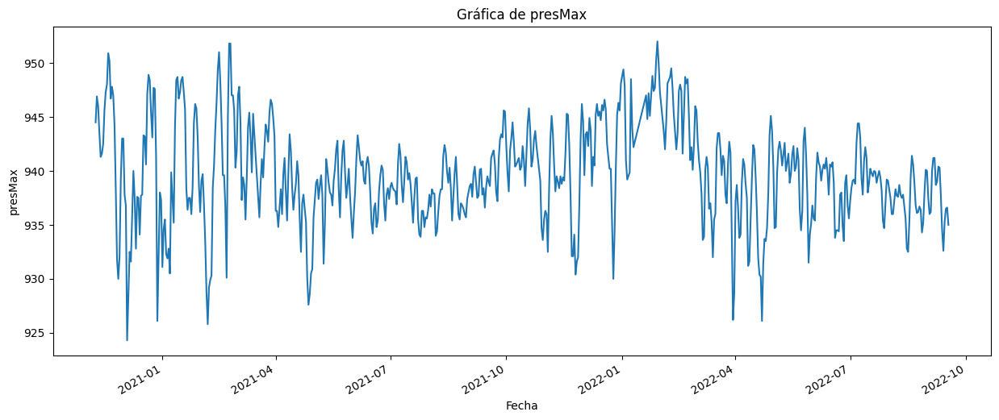

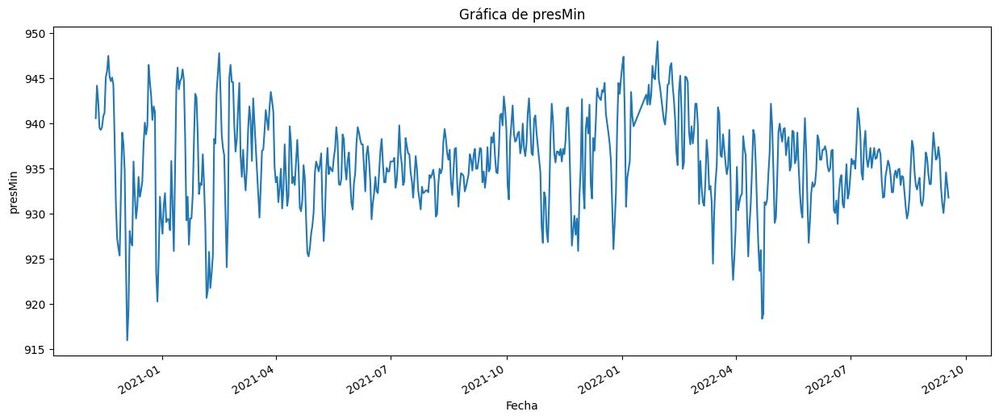

In [ ]:
for column in df_total2.columns:
  if column != 'fecha':
    fig, ax = plt.subplots(figsize=(15, 6))

    df_total2[column].plot(ax=ax)

    ax.set_title(f'Gráfica de {column}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel(column)

    plt.show()

Ponemos como indices del dataframe agrupado las fechas del mismo para poder realizar una visualización de la descompisción de los datos

In [ ]:
df_agrupado2 = df_agrupado2.set_index('fecha')
df_agrupado2.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=678, freq=None)

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

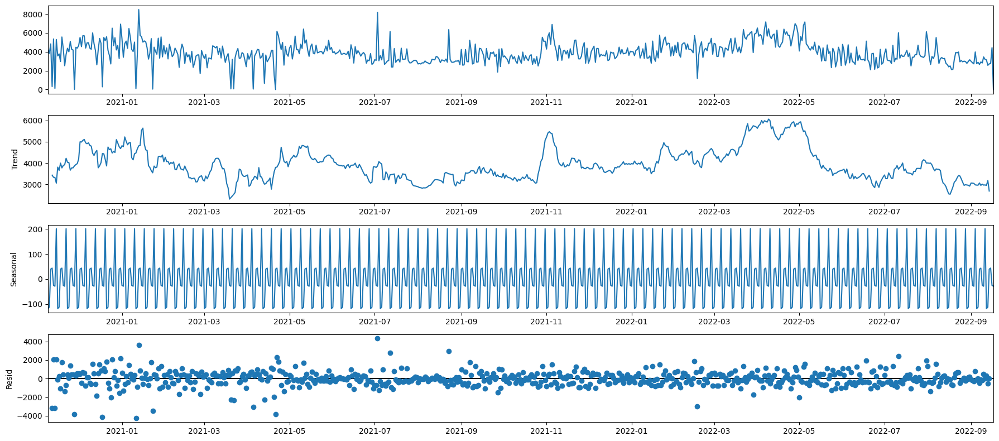

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(df_agrupado2, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_total2['Consumo'], exog=df_total2.drop('Consumo', axis=1),
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:11032.907862088
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:10773.70373286253
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:11062.092203530145
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:10636.044274265481
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:10784.129624023579
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:10765.605554060736
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:10739.819781099997
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:10607.249412685309
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:10992.500253438327
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:10730.056903557892
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:11038.923273319313
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:10616.744659458142
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:10759.866966621805
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:10724.976836772159
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:10732.819610744898
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:10615.484499991271
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:11283.758148480536
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:11009.672867608

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod = sm.tsa.statespace.SARIMAX(df_total['Consumo'], exog=df_total.drop('Consumo', axis=1), order=(1, 0, 1), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo, indicando en exog las variables exógenas que se utilizarán en el modelo. Con order=(1, 0, 1) especificamos los órdenes del componente, autoregresivo (AR) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results = mod.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [ ]:
mod_agrupado2 = sm.tsa.statespace.SARIMAX(df_total2['Consumo'], exog=df_total2.drop('Consumo', axis=1),
                                order=(1, 0, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_grouped2 = mod_agrupado2.fit()

print(results_grouped2.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
tmed         450.7018   1640.978      0.275      0.784   -2765.555    3666.959
prec          -3.7054     23.789     -0.156      0.876     -50.331      42.920
tmin        -240.9346    819.901     -0.294      0.769   -1847.910    1366.041
tmax        -245.5133    824.149     -0.298      0.766   -1860.815    1369.789
dir           -3.6266      4.118     -0.881      0.378     -11.697       4.444
velmedia       0.3468     70.020      0.005      0.996    -136.889     137.583
racha          6.1301     28.945      0.212      0.832     -50.601      62.861
sol           40.0531     26.415      1.516      0.129     -11.720      91.826
presMax        9.4048     30.356      0.310      0.757     -50.093      68.902
presMin       -7.6174     30.647     -0.249      0.804     -67.685      52.450
ar.L1          0.9698      0.022     44.279      0.0

Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

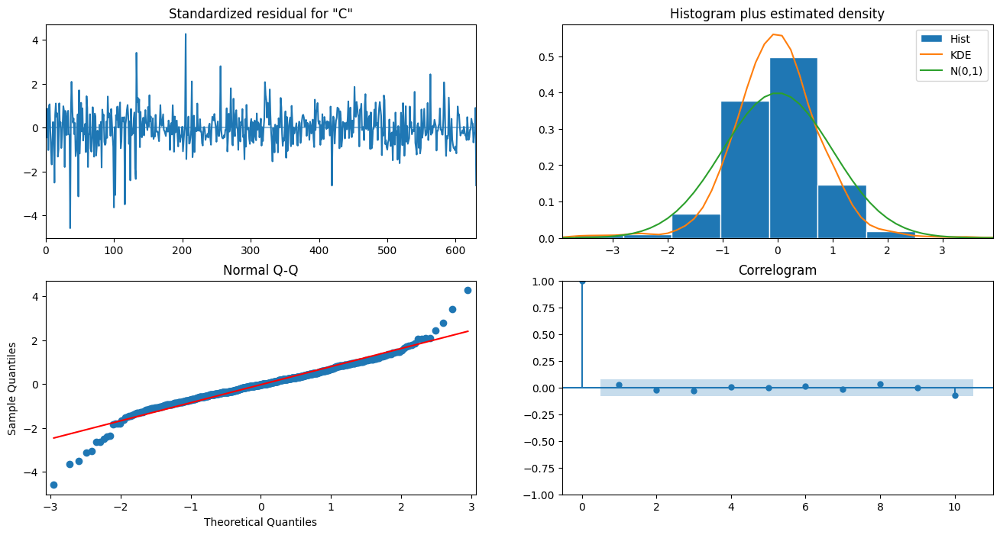

In [ ]:
results_grouped2.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_agrupado = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),exog=df_total.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 hasta el 17 de septiembre de 2022, con exog le especificamos las variables que tendrá en cuenta como externas y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_agrupado_ci = pred_agrupado.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_centro['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_agrupado.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred_agrupado.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_agrupado_ci.index, pred_agrupado_ci.iloc[:, 0], pred_agrupado_ci.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_agrupado_ci.index son los índices de tiempo del intervalo de confianza, pred_agrupado_ci.iloc[:, 0] son los límites inferiores y pred_agrupado_ci.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

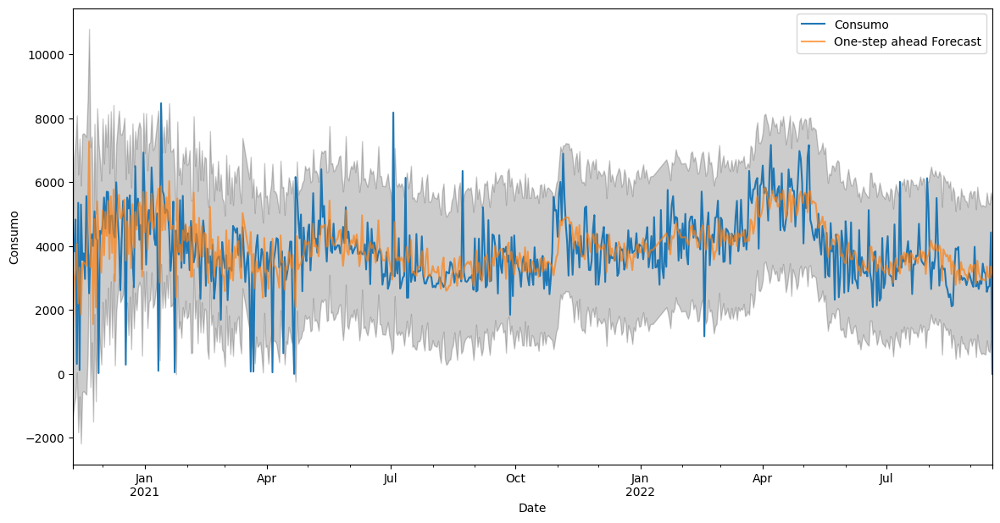

In [ ]:
pred_agrupado2 = results_grouped2.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),
                                       exog=df_total2.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False)
pred_agrupado_ci2 = pred_agrupado2.conf_int()

ax = df_agrupado2['2020':].plot(label='observed')
pred_agrupado2.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_agrupado_ci2.index,
                pred_agrupado_ci2.iloc[:, 0],
                pred_agrupado_ci2.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [ ]:
y_forecasted_agrupado2 = pred_agrupado2.predicted_mean
y_truth_agrupado2 = df_total2.loc['2020-11-09':'2022-09-17']['Consumo']

mse_agrupado2 = ((y_forecasted_agrupado2 - y_truth_agrupado2) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_agrupado2, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_agrupado2), 2)))

Error cuadrático medio: 1131290.4
Raiz del error cuadrático medio:1063.62


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [ ]:
pred_agrupado_df_cliente2 = pd.DataFrame(index=pred_agrupado2.predicted_mean.index)

pred_agrupado_df_cliente2['Consumo'] = df_agrupado2['Consumo']

pred_agrupado_df_cliente2['Predicted'] = pred_agrupado2.predicted_mean

pred_agrupado_df_cliente2['Lower Bound'] = pred_agrupado_ci2.iloc[:, 0]
pred_agrupado_df_cliente2['Upper Bound'] = pred_agrupado_ci2.iloc[:, 1]

In [ ]:
pred_agrupado_df_cliente2.to_csv('predicciones_agrupado_cliente2.csv', index=True)

##Datos del tercer cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [36]:
df_cliente3 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente3.csv', sep=',')
df_cliente3.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,279.0
1,2020-11-09 01:00:00,96.0
2,2020-11-09 02:00:00,105.0
3,2020-11-09 03:00:00,105.0
4,2020-11-09 04:00:00,80.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [37]:
df_cliente3['FechaHora'] = pd.to_datetime(df_cliente3['FechaHora'])

###Datos originales

Ponemos como indices del dataset las fechas para poder realizar una visualización de los datos del mismo

In [38]:
df_cliente3 = df_cliente3.set_index('FechaHora')
df_cliente3.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Preparamos los datos para una correcta visualización gráfica

In [39]:
y_cliente3 = df_cliente3['Consumo']
y_cliente3['2020':]

FechaHora
2020-11-09 00:00:00    279.0
2020-11-09 01:00:00     96.0
2020-11-09 02:00:00    105.0
2020-11-09 03:00:00    105.0
2020-11-09 04:00:00     80.0
                       ...  
2022-09-17 19:00:00    136.0
2022-09-17 20:00:00    136.0
2022-09-17 21:00:00    136.0
2022-09-17 22:00:00    136.0
2022-09-17 23:00:00    136.0
Name: Consumo, Length: 16272, dtype: float64

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante más alto durante los meses más frios y más baja durante los meses de más calor

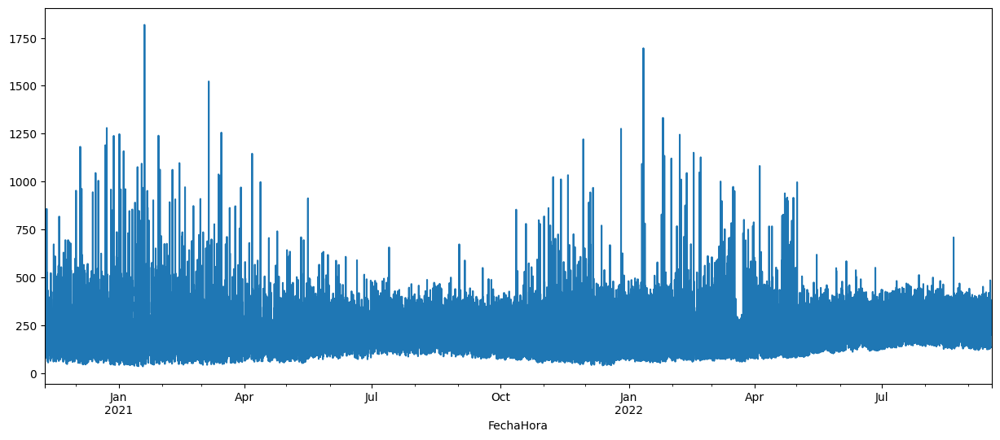

In [ ]:
y_cliente3.plot(figsize=(15, 6))
plt.show()

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

Se ha probado a cambiar a escala logarítmica para comporbar si se podía visualizar la gráfica "seasonal" sin obtener resultados

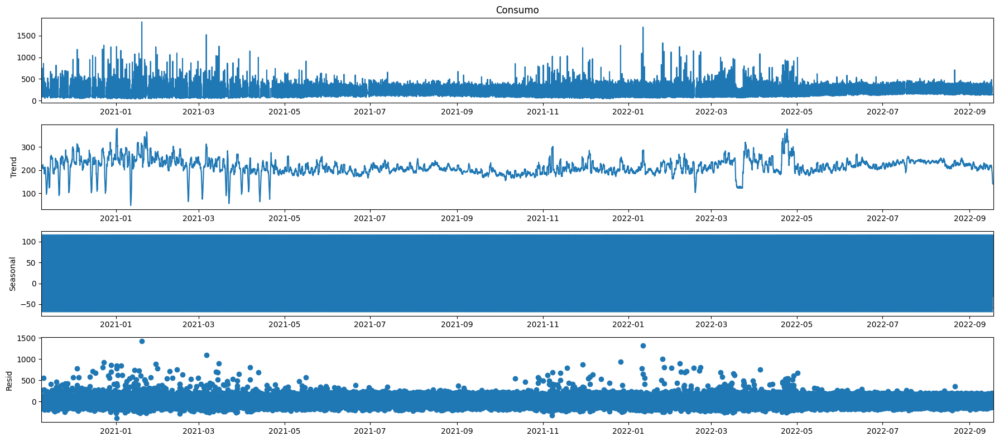

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(y_cliente3, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [14]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_cliente3,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:226373.63400690065
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:221593.80856799422
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:217636.60492532645
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:204438.02613726142
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:215051.0260895597
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:205248.98945687874
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:208236.21197968762
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:204036.1217119148
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:219717.34797034535
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:217279.47905877832
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:217301.61105610413
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:204330.32543069636
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:214040.08735097252
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:204498.37472225743
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:208224.00888984557
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:203983.43029061935
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:215509.52156906406
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:215326.181093

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod3 = sm.tsa.statespace.SARIMAX(y_cliente3, order=(1, 1, 1), seasonal_order=(1, 0, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo. Con order=(1, 1, 1) especificamos los órdenes del componente, autoregresivo (AR), diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results3 = mod3.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results3.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [40]:
mod3 = sm.tsa.statespace.SARIMAX(y_cliente3,
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results3 = mod3.fit()

print(results3.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0175      0.006     -3.152      0.002      -0.028      -0.007
ma.L1         -1.0155      0.001   -820.697      0.000      -1.018      -1.013
ar.S.L12      -0.9967      0.001  -1660.309      0.000      -0.998      -0.996
ma.S.L12       0.9664      0.002    527.524      0.000       0.963       0.970
sigma2       1.53e+04     97.883    156.343      0.000    1.51e+04    1.55e+04


Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

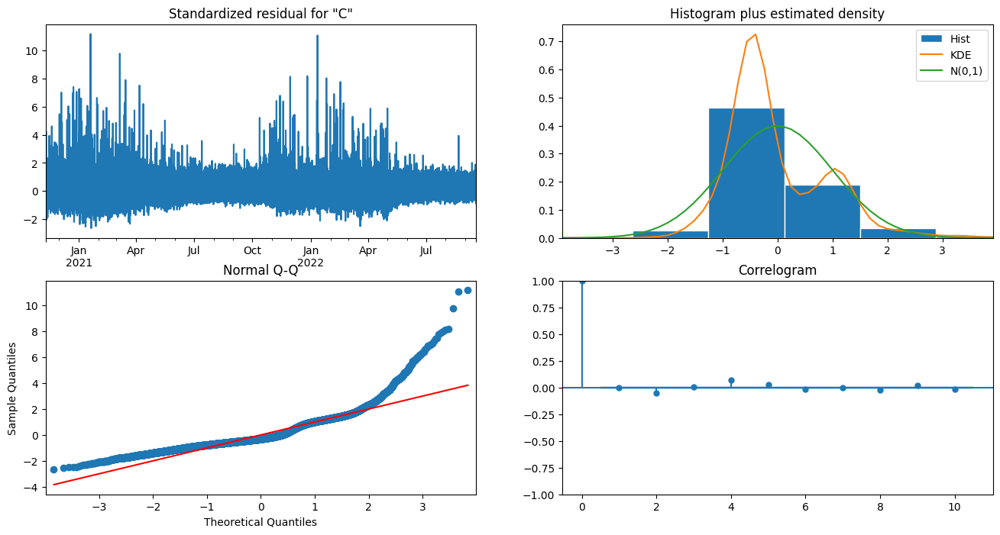

In [16]:
results3.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred3 = results3.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_ci3 = pred3.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_cliente3['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred3.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_ci3.index, pred_ci3.iloc[:, 0], pred_ci3.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_ci3.index son los índices de tiempo del intervalo de confianza, pred_ci3.iloc[:, 0] son los límites inferiores y pred_ci3.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

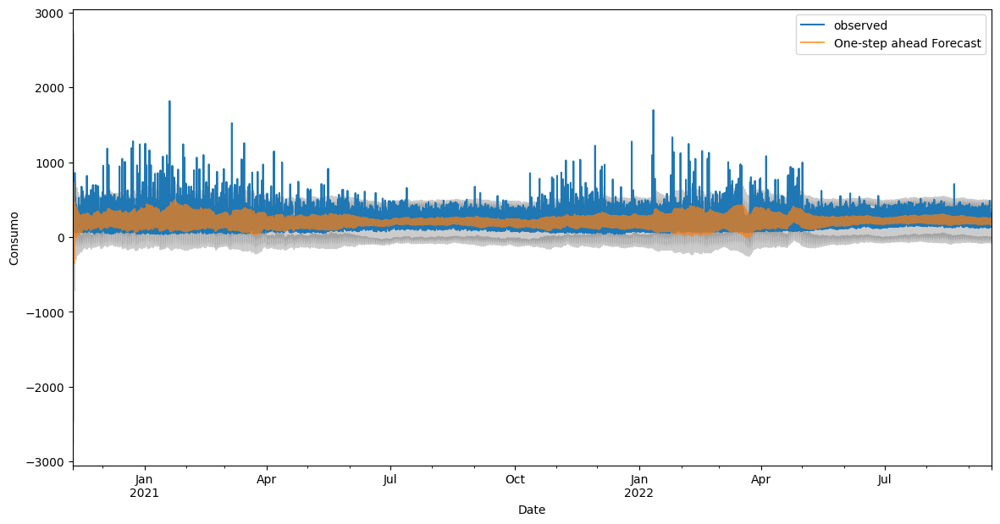

In [41]:
pred3 = results3.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)
pred_ci3 = pred3.conf_int()

ax = y_cliente3['2020':].plot(label='observed')
pred3.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci3.index,
                pred_ci3.iloc[:, 0],
                pred_ci3.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [42]:
y_forecasted3 = pred3.predicted_mean
y_truth3 = y_cliente3['2020-11-09':]

mse3 = ((y_forecasted3 - y_truth3) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse3, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse3), 2)))

Error cuadrático medio: 15900.33
Raiz del error cuadrático medio:126.1


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [20]:
pred_df_cliente3 = pd.DataFrame(index=pred3.predicted_mean.index)

pred_df_cliente3['Consumo'] = df_cliente3['Consumo']

pred_df_cliente3['Predicted'] = pred3.predicted_mean

pred_df_cliente3['Lower Bound'] = pred_ci3.iloc[:, 0]
pred_df_cliente3['Upper Bound'] = pred_ci3.iloc[:, 1]

In [ ]:
pred_df_cliente3.to_csv('predicciones_cliente3.csv', index=True)

A partir de este punto los datos usados estarán agrupados por días, es decir, asignaremos a cada día el consumo total realizado en ese día y probaremos a añadir valirables externas para ver que efecto tienen en la predicción

###Datos agrupados con variables externas

Creamos un nueva columna "fecha" que tendrá todas las fechas sin la parte horaria y agrupamos con la columna de consumo para tener el total de energía que se consumio ese día

In [ ]:
df_cliente3['fecha'] = df_cliente3['FechaHora'].dt.date
df_agrupado3 = df_cliente3.groupby('fecha')['Consumo'].sum().reset_index()
df_agrupado3.head()

,fecha,Consumo
0,2020-11-09,5174.0
1,2020-11-10,5006.0
2,2020-11-11,5095.0
3,2020-11-12,2280.0
4,2020-11-13,5116.0


Convertimos las fechas de la columna "fecha" a su tipo correcto

In [ ]:
df_agrupado3['fecha'] = pd.to_datetime(df_agrupado3['fecha'])

Juntamos los dataframe con los datos agrupados y las variables externas previamente preparadas usando de pivote la columna fecha, la cual debe coincidir en ambas tablas para se haga correctamente

In [ ]:
df_total3 = pd.merge(df_agrupado3, df_clima, on='fecha')
df_total3

,fecha,Consumo,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,5174.0,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,5006.0,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,5095.0,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,2280.0,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,5116.0,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3
...,...,...,...,...,...,...,...,...,...,...,...,...
652,2022-09-13,5089.0,22.2,1.0,17.8,26.6,19.0,4.7,16.7,6.0,932.6,930.1
653,2022-09-14,5023.0,21.2,0.0,16.1,26.3,23.0,3.3,13.9,6.7,935.3,931.7
654,2022-09-15,5302.0,20.4,0.6,16.2,24.6,30.0,1.7,11.4,4.6,936.5,934.6
655,2022-09-16,5237.0,21.0,0.0,14.2,27.9,29.0,1.7,7.8,12.0,936.6,933.2


Convertimos las fechas de la columna "fecha" de la tabla df_total a su tipo correcto y los asiganmos como índices

In [ ]:
df_total3['fecha'] = pd.to_datetime(df_total3['fecha'])
df_total3 = df_total3.set_index('fecha')
df_total3.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=657, freq=None)

Realizamos una visualización de cada una de las variables que tenemos en el dataframe

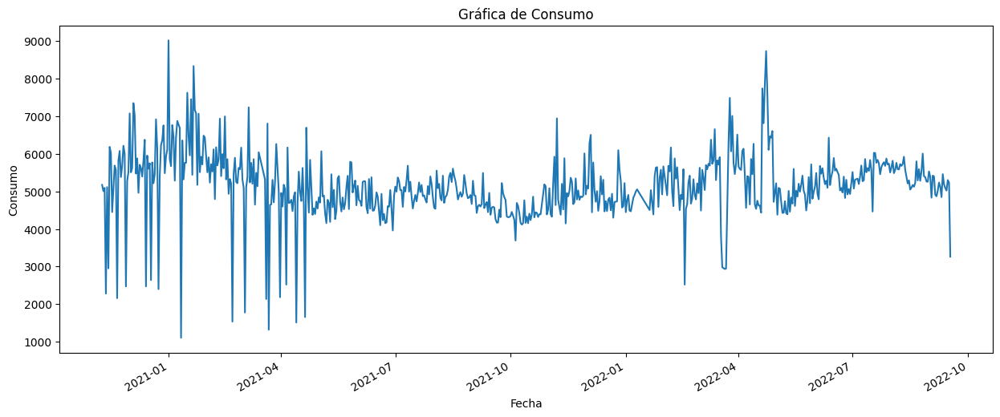

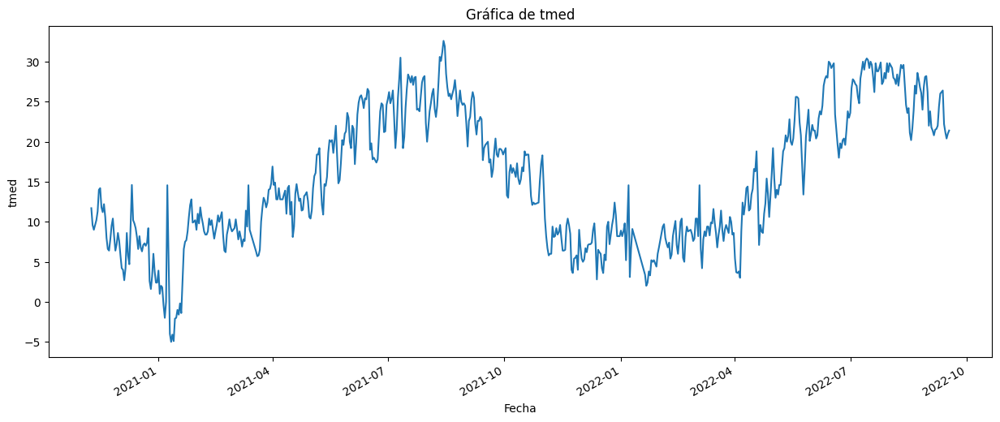

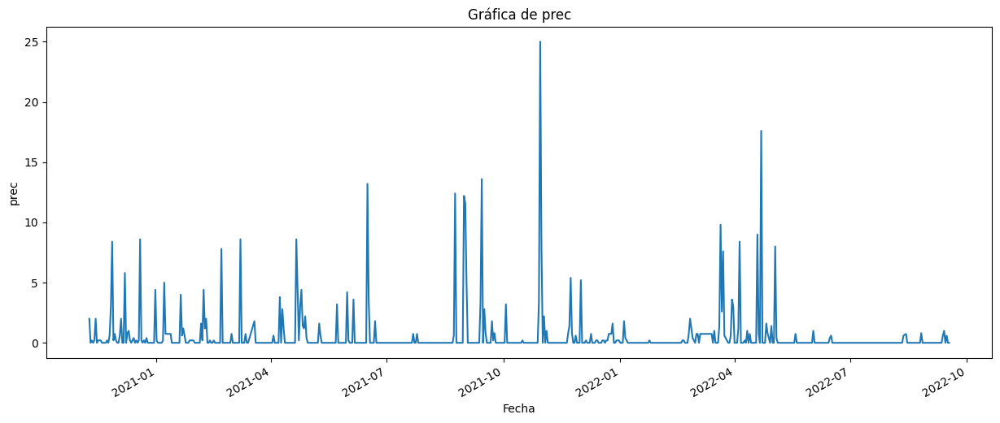

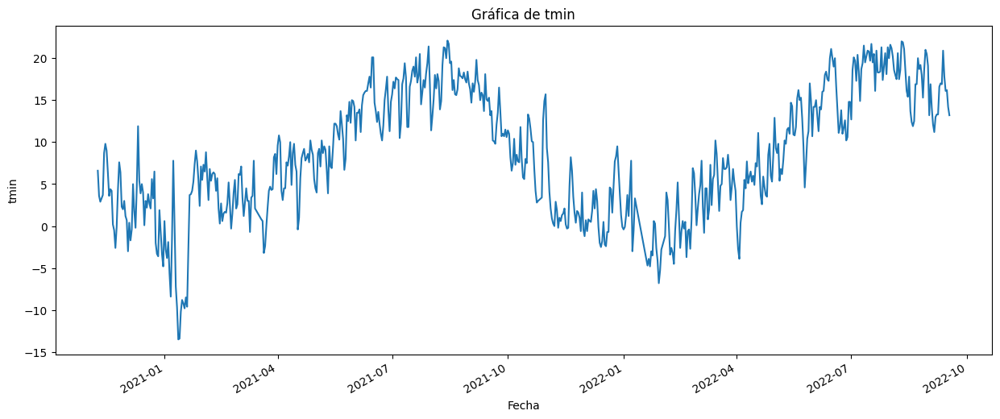

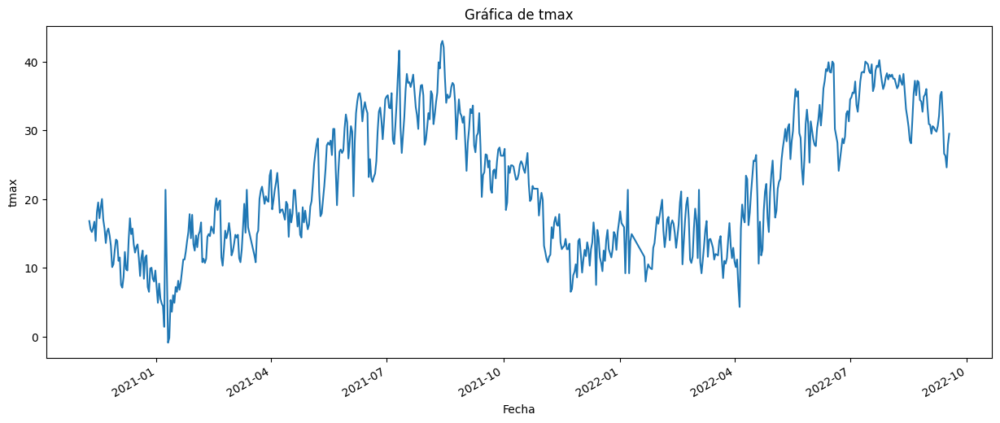

...

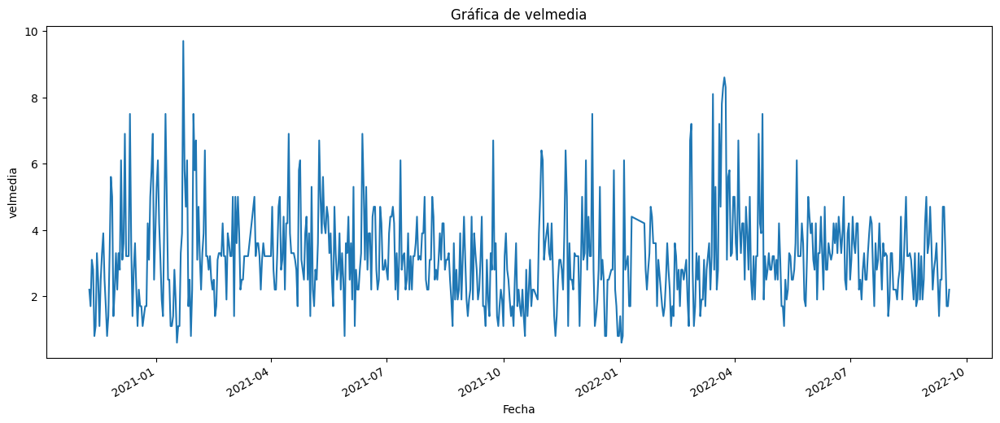

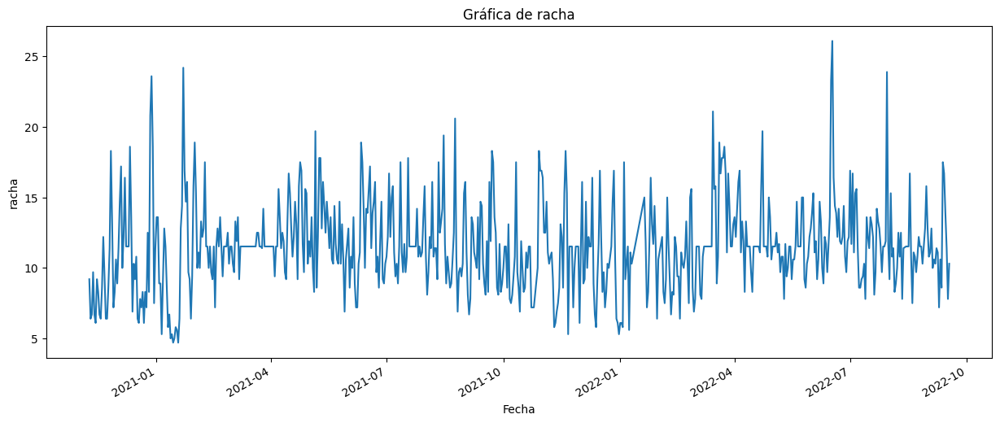

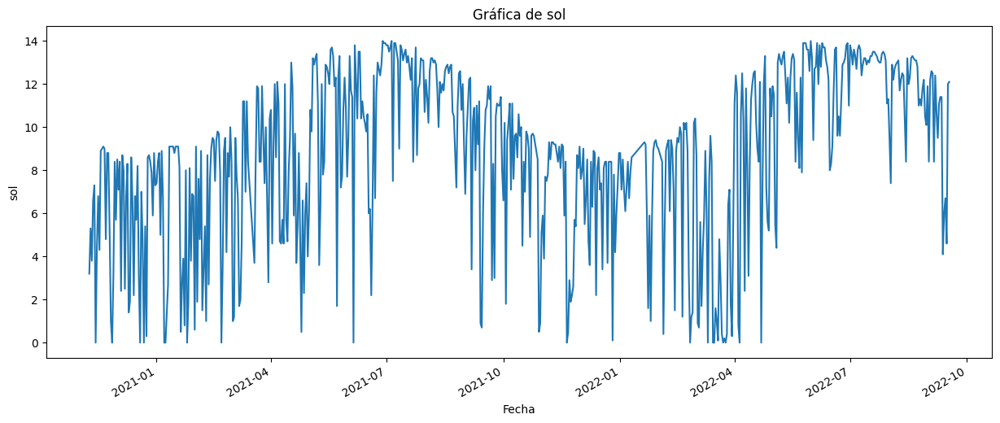

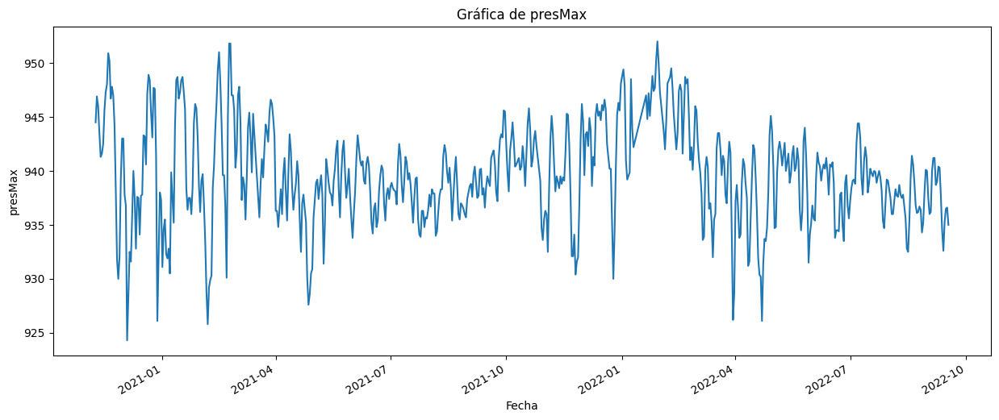

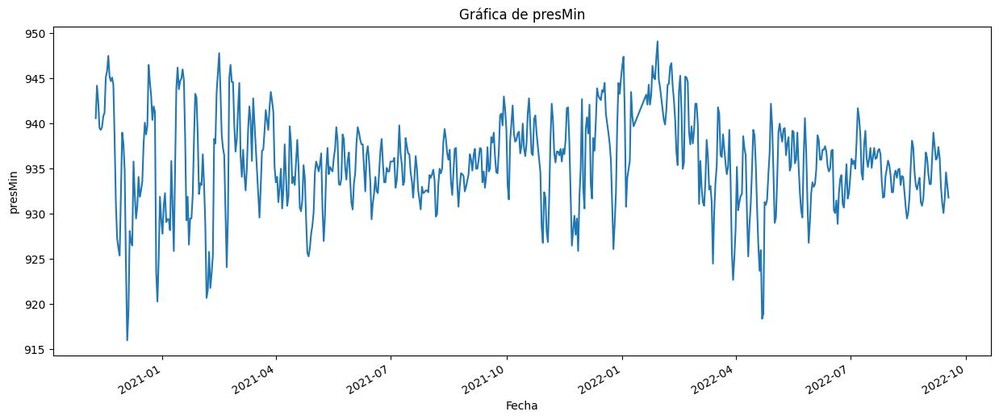

In [ ]:
for column in df_total3.columns:
  if column != 'fecha':
    fig, ax = plt.subplots(figsize=(15, 6))

    df_total3[column].plot(ax=ax)

    ax.set_title(f'Gráfica de {column}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel(column)

    plt.show()

Ponemos como indices del dataframe agrupado las fechas del mismo para poder realizar una visualización de la descompisción de los datos

In [ ]:
df_agrupado3 = df_agrupado3.set_index('fecha')
df_agrupado3.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=678, freq=None)

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

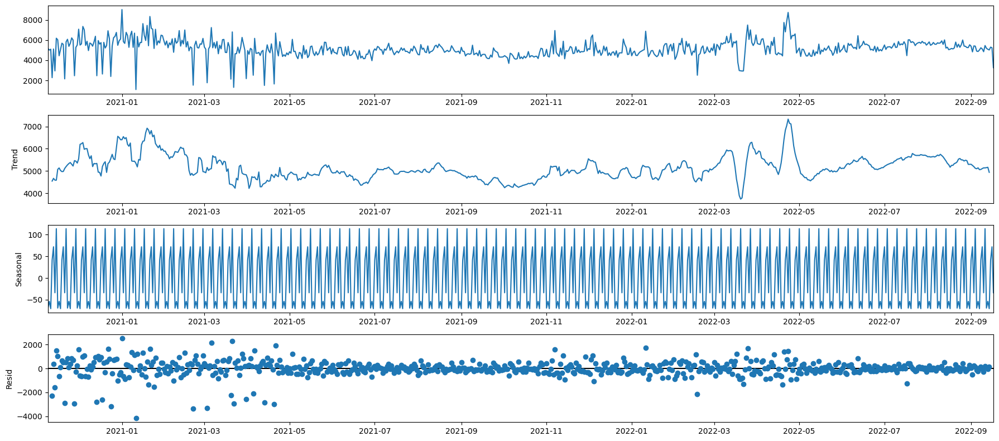

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(df_agrupado3, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_total3['Consumo'], exog=df_total3.drop('Consumo', axis=1),
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:10748.822655681703
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:10530.552862353143
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:10898.93995797856
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:10377.551502410995
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:10557.04635523992
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:10529.060632672456
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:10506.060678502174
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:10385.938113701133
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:10709.338880090307
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:10487.363179611786
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:10876.561692826155
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:10399.988492462886
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:10532.073193892547
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:10488.102955461889
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:10514.733672070499
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:10416.498173248285
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:10988.035376461778
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:10746.7506312

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod = sm.tsa.statespace.SARIMAX(df_total['Consumo'], exog=df_total.drop('Consumo', axis=1), order=(1, 0, 1), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo, indicando en exog las variables exógenas que se utilizarán en el modelo. Con order=(1, 0, 1) especificamos los órdenes del componente, autoregresivo (AR) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results = mod.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [ ]:
mod_agrupado3 = sm.tsa.statespace.SARIMAX(df_total3['Consumo'], exog=df_total3.drop('Consumo', axis=1),
                                order=(1, 0, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_grouped3 = mod_agrupado3.fit()

print(results_grouped3.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
tmed       -2015.0938   1439.735     -1.400      0.162   -4836.922     806.734
prec          -3.0780     20.845     -0.148      0.883     -43.933      37.777
tmin        1010.4477    721.759      1.400      0.162    -404.174    2425.070
tmax         975.4696    721.320      1.352      0.176    -438.292    2389.231
dir           -1.9154      3.634     -0.527      0.598      -9.039       5.208
velmedia      15.4783     53.719      0.288      0.773     -89.810     120.766
racha         19.1277     27.745      0.689      0.491     -35.252      73.508
sol          -26.4101     21.946     -1.203      0.229     -69.424      16.603
presMax        2.8303     23.564      0.120      0.904     -43.355      49.015
presMin      -10.5519     23.924     -0.441      0.659     -57.442      36.338
ar.L1          0.8940      0.042     21.422      0.0

Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

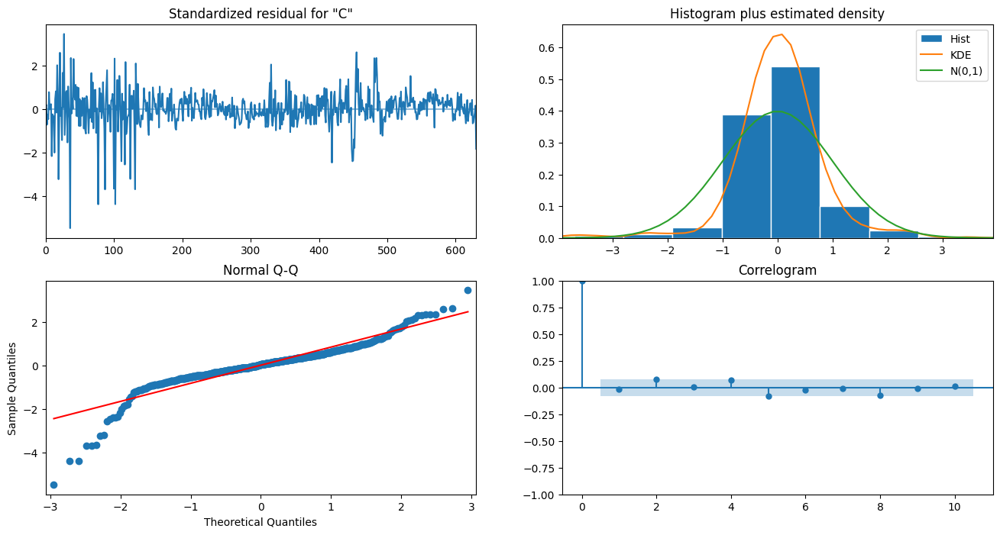

In [ ]:
results_grouped3.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_agrupado = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),exog=df_total.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 hasta el 17 de septiembre de 2022, con exog le especificamos las variables que tendrá en cuenta como externas y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_agrupado_ci = pred_agrupado.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_centro['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_agrupado.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred_agrupado.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_agrupado_ci.index, pred_agrupado_ci.iloc[:, 0], pred_agrupado_ci.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_agrupado_ci.index son los índices de tiempo del intervalo de confianza, pred_agrupado_ci.iloc[:, 0] son los límites inferiores y pred_agrupado_ci.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

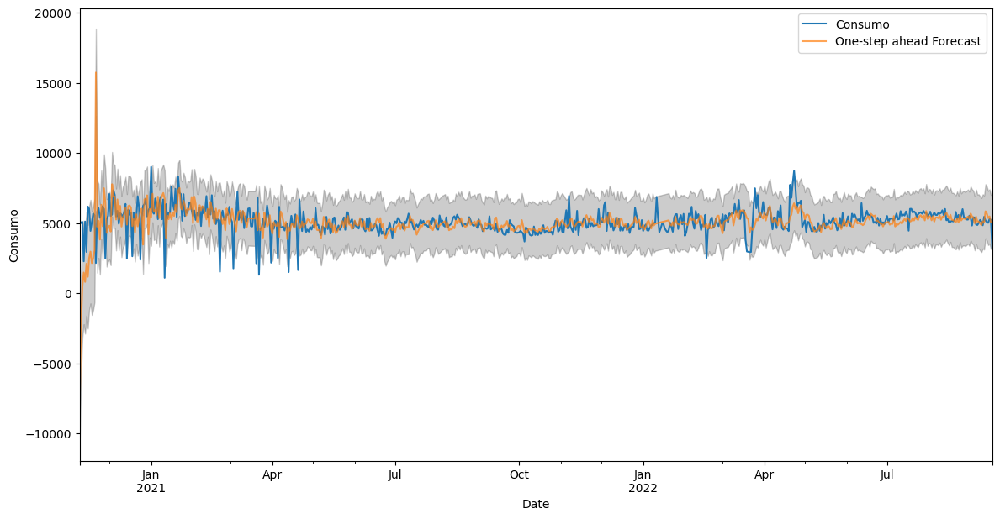

In [ ]:
pred_agrupado3 = results_grouped3.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),
                                       exog=df_total3.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False)
pred_agrupado_ci3 = pred_agrupado3.conf_int()

ax = df_agrupado3['2020':].plot(label='observed')
pred_agrupado3.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_agrupado_ci3.index,
                pred_agrupado_ci3.iloc[:, 0],
                pred_agrupado_ci3.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [ ]:
y_forecasted_agrupado3 = pred_agrupado3.predicted_mean
y_truth_agrupado3 = df_total3.loc['2020-11-09':'2022-09-17']['Consumo']

mse_agrupado3 = ((y_forecasted_agrupado3 - y_truth_agrupado3) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_agrupado3, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_agrupado3), 2)))

Error cuadrático medio: 1499200.93
Raiz del error cuadrático medio:1224.42


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [ ]:
pred_agrupado_df_cliente3 = pd.DataFrame(index=pred_agrupado3.predicted_mean.index)

pred_agrupado_df_cliente3['Consumo'] = df_agrupado3['Consumo']

pred_agrupado_df_cliente3['Predicted'] = pred_agrupado3.predicted_mean

pred_agrupado_df_cliente3['Lower Bound'] = pred_agrupado_ci3.iloc[:, 0]
pred_agrupado_df_cliente3['Upper Bound'] = pred_agrupado_ci3.iloc[:, 1]

In [ ]:
pred_agrupado_df_cliente3.to_csv('predicciones_agrupado_cliente3.csv', index=True)

##Datos del cuarto cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [29]:
df_cliente4 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente4.csv', sep=',')
df_cliente4.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,372.0
1,2020-11-09 01:00:00,314.0
2,2020-11-09 02:00:00,313.0
3,2020-11-09 03:00:00,293.0
4,2020-11-09 04:00:00,259.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [30]:
df_cliente4['FechaHora'] = pd.to_datetime(df_cliente4['FechaHora'])

###Datos originales

Ponemos como indices del dataset las fechas para poder realizar una visualización de los datos del mismo

In [31]:
df_cliente4 = df_cliente4.set_index('FechaHora')
df_cliente4.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Preparamos los datos para una correcta visualización gráfica

In [32]:
y_cliente4 = df_cliente4['Consumo']
y_cliente4['2020':]

FechaHora
2020-11-09 00:00:00    372.0
2020-11-09 01:00:00    314.0
2020-11-09 02:00:00    313.0
2020-11-09 03:00:00    293.0
2020-11-09 04:00:00    259.0
                       ...  
2022-09-17 19:00:00    763.0
2022-09-17 20:00:00    763.0
2022-09-17 21:00:00    763.0
2022-09-17 22:00:00    763.0
2022-09-17 23:00:00    763.0
Name: Consumo, Length: 16272, dtype: float64

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es bastante constante durante todo el año

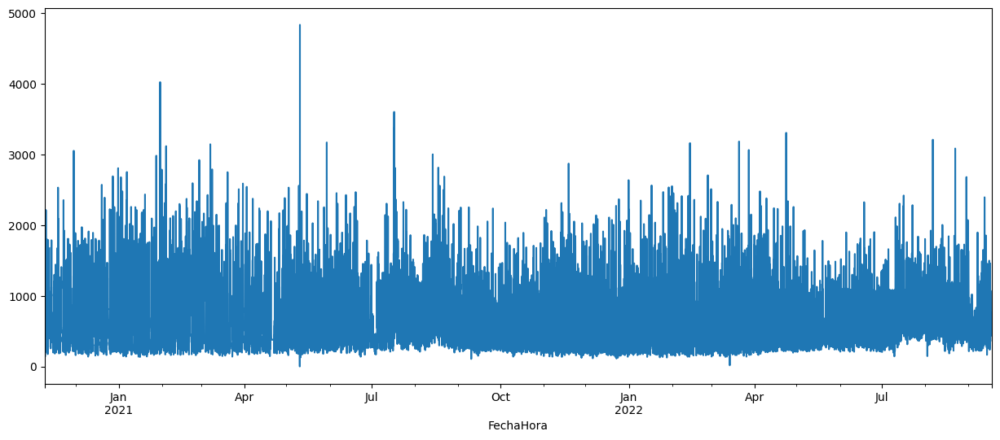

In [ ]:
y_cliente4.plot(figsize=(15, 6))
plt.show()

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

Se ha probado a cambiar a escala logarítmica para comporbar si se podía visualizar la gráfica "seasonal" sin obtener resultados

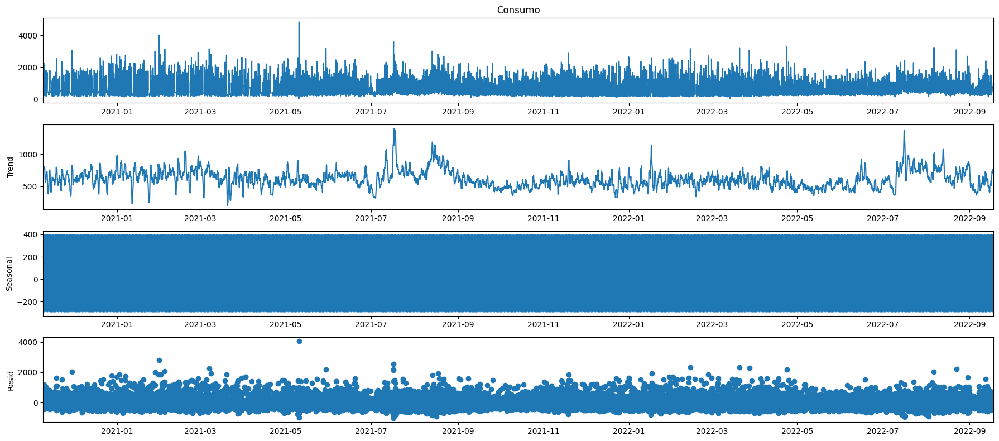

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log1p(y_cliente4)
decomposition = sm.tsa.seasonal_decompose(y_cliente4, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [14]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_cliente4,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:261646.00253263148
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:258158.4492352546
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:256444.27335148596
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:241872.03351247453
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:253165.84985407948
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:243715.79974343727
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:243511.73402256903
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:240529.46023406973
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:251517.784317931
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:249536.55216860858
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:252009.3888341228
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:238542.48008129338
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:247379.38103687376
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:238741.2862037946
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:241825.20171900874
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:237936.7706255791
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:243734.23482995902
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:243565.4516886890

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod4 = sm.tsa.statespace.SARIMAX(y_cliente4, order=(1, 1, 1), seasonal_order=(1, 0, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo. Con order=(1, 1, 1) especificamos los órdenes del componente, autoregresivo (AR), diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results4 = mod4.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results4.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [33]:
mod4 = sm.tsa.statespace.SARIMAX(y_cliente4,
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results4 = mod4.fit()

print(results4.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3343      0.007     48.307      0.000       0.321       0.348
ma.L1         -0.9890      0.002   -635.655      0.000      -0.992      -0.986
ar.S.L12      -0.9972      0.001  -1108.659      0.000      -0.999      -0.995
ma.S.L12       0.9671      0.003    300.918      0.000       0.961       0.973
sigma2      1.601e+05   1260.283    127.039      0.000    1.58e+05    1.63e+05


Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

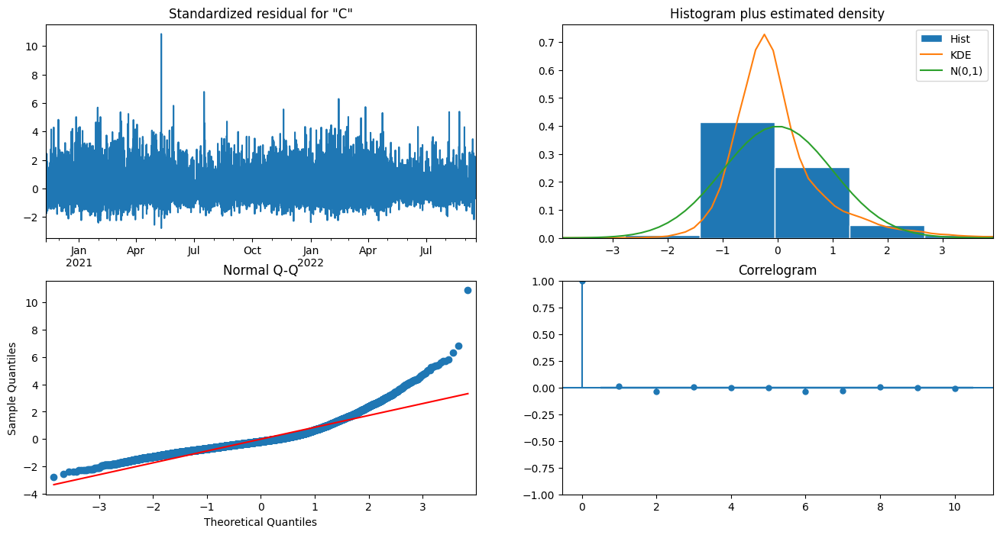

In [16]:
results4.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred4 = results4.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_ci4 = pred4.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_cliente4['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred4.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_ci4.index, pred_ci4.iloc[:, 0], pred_ci4.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_ci4.index son los índices de tiempo del intervalo de confianza, pred_ci4.iloc[:, 0] son los límites inferiores y pred_ci4.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

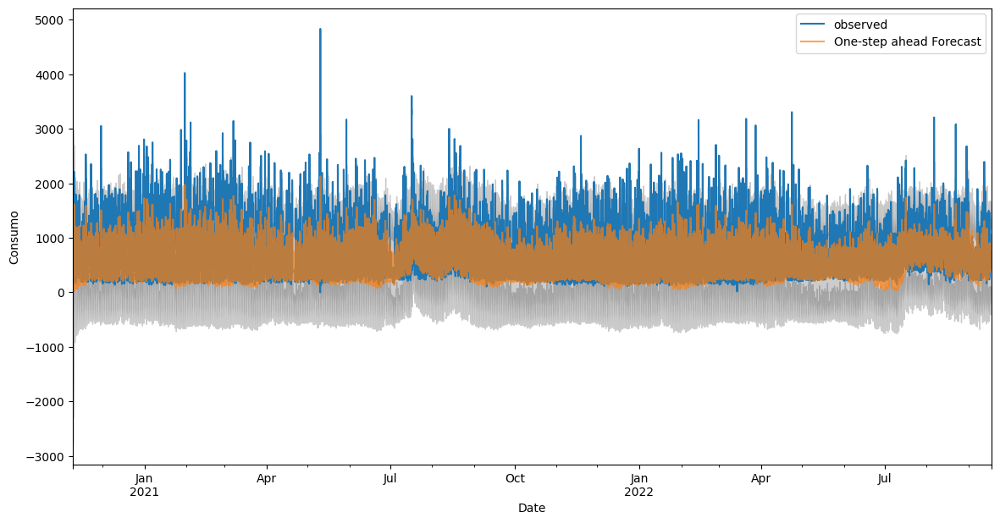

In [34]:
pred4 = results4.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)
pred_ci4 = pred4.conf_int()

ax = y_cliente4['2020':].plot(label='observed')
pred4.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci4.index,
                pred_ci4.iloc[:, 0],
                pred_ci4.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [35]:
y_forecasted4 = pred4.predicted_mean
y_truth4 = y_cliente4['2020-11-09':]

mse4 = ((y_forecasted4 - y_truth4) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse4, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse4), 2)))

Error cuadrático medio: 119863.2
Raiz del error cuadrático medio:346.21


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [19]:
pred_df_cliente4 = pd.DataFrame(index=pred4.predicted_mean.index)

pred_df_cliente4['Consumo'] = df_cliente4['Consumo']

pred_df_cliente4['Predicted'] = pred4.predicted_mean

pred_df_cliente4['Lower Bound'] = pred_ci4.iloc[:, 0]
pred_df_cliente4['Upper Bound'] = pred_ci4.iloc[:, 1]

In [ ]:
pred_df_cliente4.to_csv('predicciones_cliente4.csv', index=True)

A partir de este punto los datos usados estarán agrupados por días, es decir, asignaremos a cada día el consumo total realizado en ese día y probaremos a añadir valirables externas para ver que efecto tienen en la predicción

###Datos agrupados con variables externas

Creamos un nueva columna "fecha" que tendrá todas las fechas sin la parte horaria y agrupamos con la columna de consumo para tener el total de energía que se consumio ese día

In [ ]:
df_cliente4['fecha'] = df_cliente4['FechaHora'].dt.date
df_agrupado4 = df_cliente4.groupby('fecha')['Consumo'].sum().reset_index()
df_agrupado4.head()

,fecha,Consumo
0,2020-11-09,18283.0
1,2020-11-10,14420.0
2,2020-11-11,16805.0
3,2020-11-12,9528.0
4,2020-11-13,17563.0


Convertimos las fechas de la columna "fecha" a su tipo correcto

In [ ]:
df_agrupado4['fecha'] = pd.to_datetime(df_agrupado4['fecha'])

Juntamos los dataframe con los datos agrupados y las variables externas previamente preparadas usando de pivote la columna fecha, la cual debe coincidir en ambas tablas para se haga correctamente

In [ ]:
df_total4 = pd.merge(df_agrupado4, df_clima, on='fecha')
df_total4

,fecha,Consumo,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,18283.0,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,14420.0,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,16805.0,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,9528.0,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,17563.0,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3
...,...,...,...,...,...,...,...,...,...,...,...,...
652,2022-09-13,14987.0,22.2,1.0,17.8,26.6,19.0,4.7,16.7,6.0,932.6,930.1
653,2022-09-14,11954.0,21.2,0.0,16.1,26.3,23.0,3.3,13.9,6.7,935.3,931.7
654,2022-09-15,12673.0,20.4,0.6,16.2,24.6,30.0,1.7,11.4,4.6,936.5,934.6
655,2022-09-16,12329.0,21.0,0.0,14.2,27.9,29.0,1.7,7.8,12.0,936.6,933.2


Convertimos las fechas de la columna "fecha" de la tabla df_total a su tipo correcto y los asiganmos como índices

In [ ]:
df_total4['fecha'] = pd.to_datetime(df_total4['fecha'])
df_total4 = df_total4.set_index('fecha')
df_total4.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=657, freq=None)

Realizamos una visualización de cada una de las variables que tenemos en el dataframe

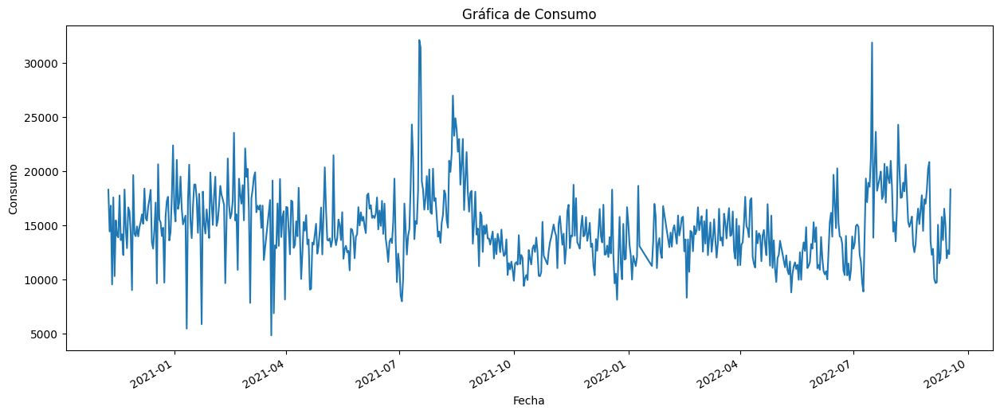

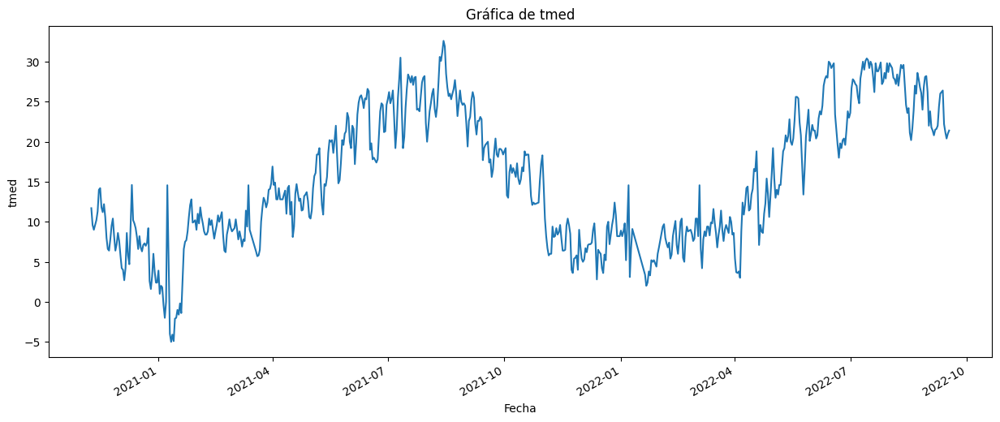

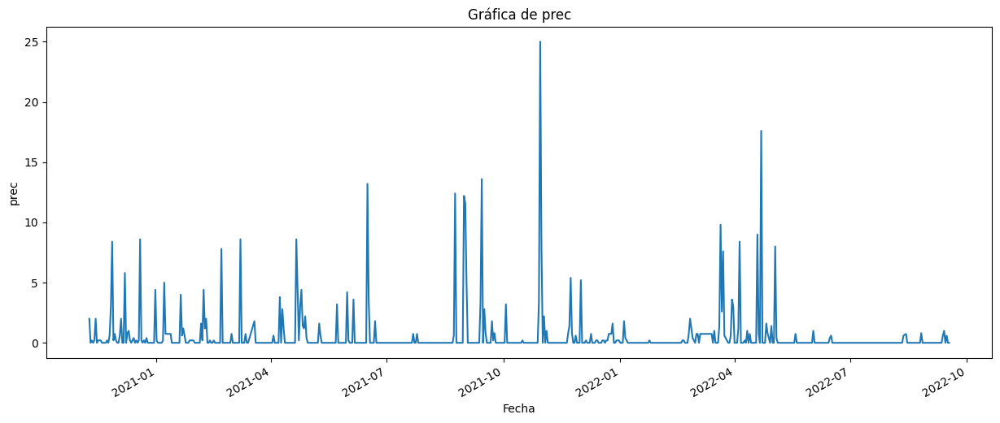

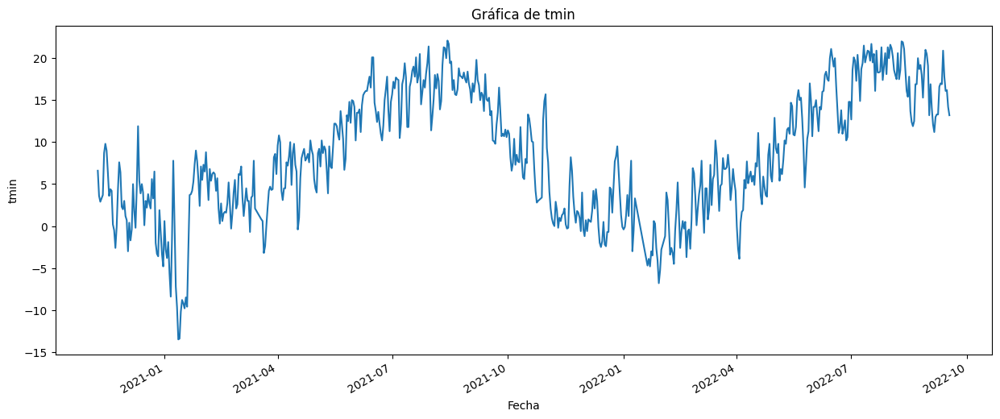

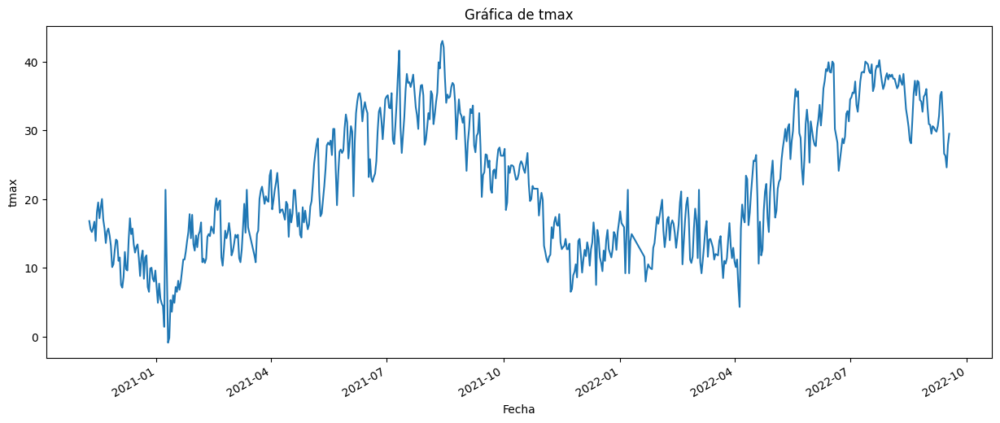

...

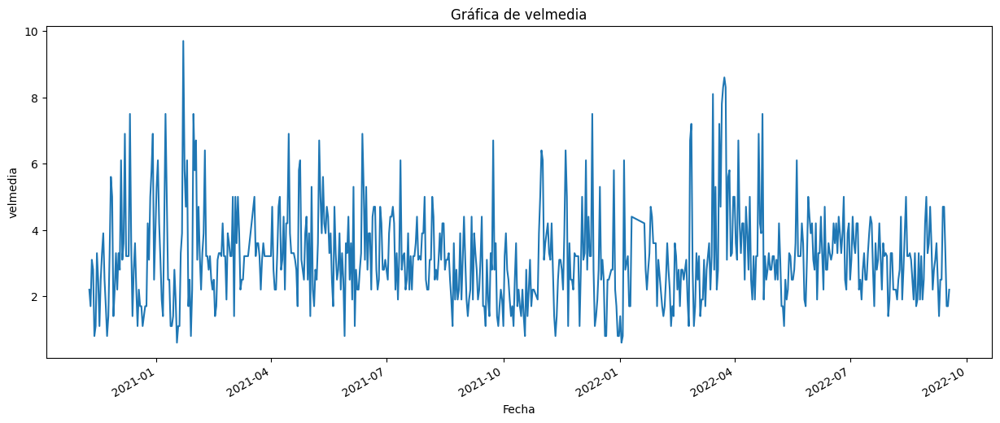

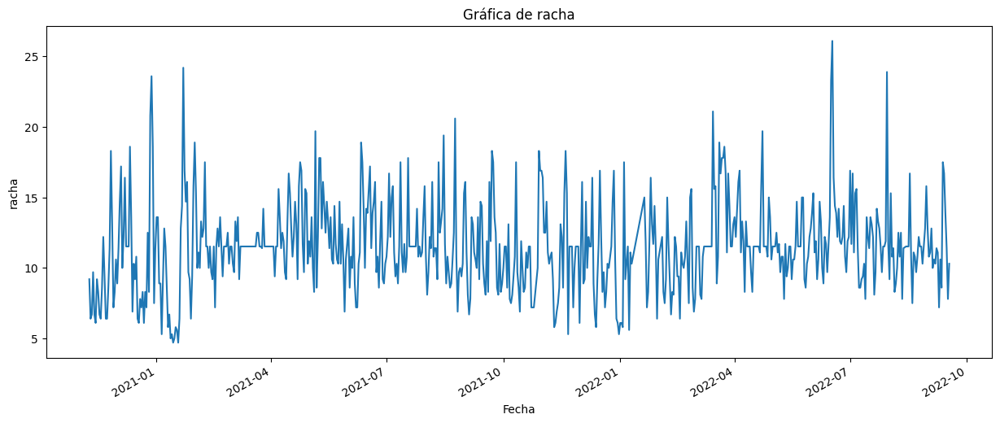

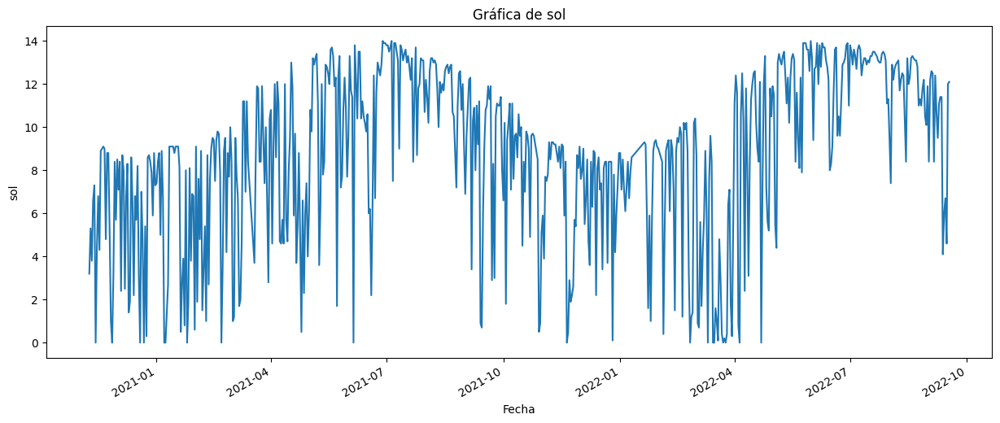

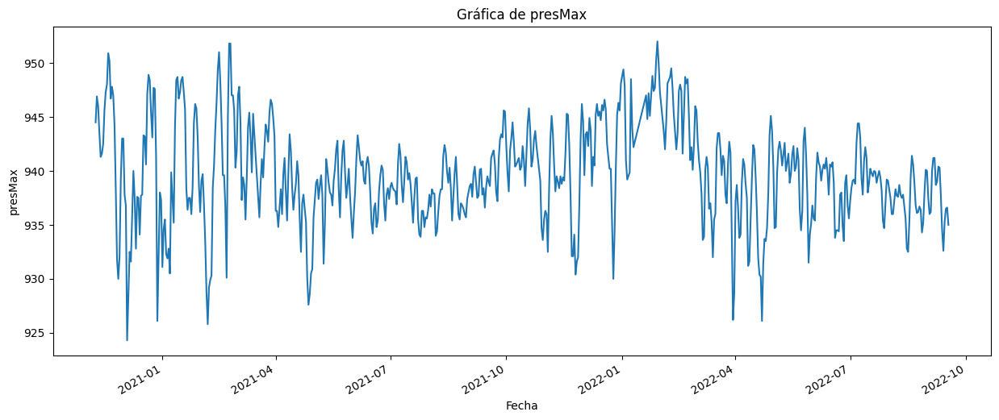

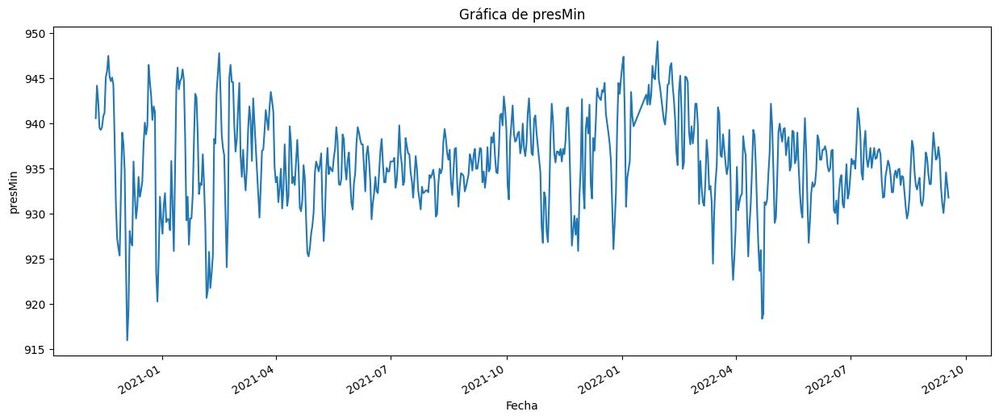

In [ ]:
for column in df_total4.columns:
  if column != 'fecha':
    fig, ax = plt.subplots(figsize=(15, 6))

    df_total4[column].plot(ax=ax)

    ax.set_title(f'Gráfica de {column}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel(column)

    plt.show()

Ponemos como indices del dataframe agrupado las fechas del mismo para poder realizar una visualización de la descompisción de los datos

In [ ]:
df_agrupado4 = df_agrupado4.set_index('fecha')
df_agrupado4.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=678, freq=None)

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

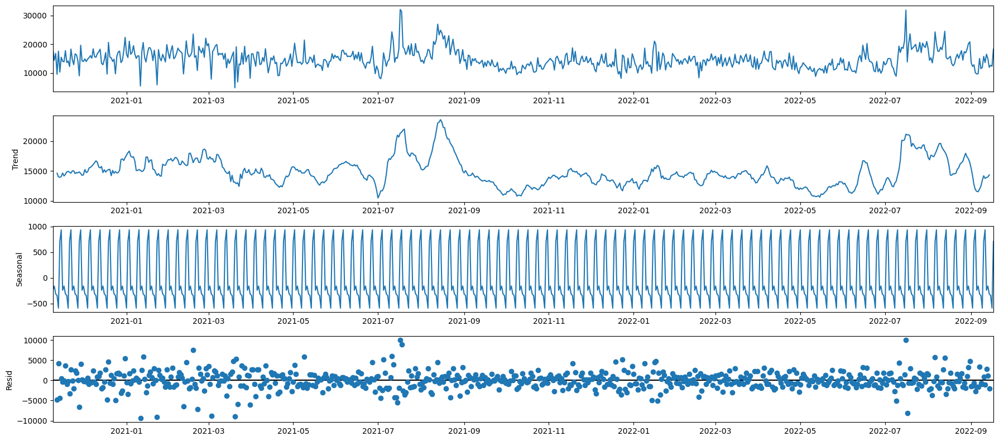

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(df_agrupado4, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_total4['Consumo'], exog=df_total4.drop('Consumo', axis=1),
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:12470.577585115821
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:12219.946462709317
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:16036.217452098927
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:12052.939026414722
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:12234.148836508568
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:12214.93085520333
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:12183.642901902014
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:12035.597535534565
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:12354.637668006346
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:12108.708217771366
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:12444.15861317451
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:11984.748796075137
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:12146.524449143482
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:12111.577808087597
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:12129.234768527904
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:11982.417952004816
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:12494.96062248564
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:12253.15327617

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod = sm.tsa.statespace.SARIMAX(df_total4['Consumo'], exog=df_total.drop('Consumo', axis=1), order=(1, 1, 1), seasonal_order=(0, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo, indicando en exog las variables exógenas que se utilizarán en el modelo. Con order=(1, 1, 1) especificamos los órdenes del componente, autoregresivo (AR), diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results = mod.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [ ]:
mod_agrupado4 = sm.tsa.statespace.SARIMAX(df_total4['Consumo'], exog=df_total4.drop('Consumo', axis=1),
                                order=(1, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_grouped4 = mod_agrupado4.fit()

print(results_grouped4.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
tmed        1675.3514   5728.011      0.292      0.770   -9551.345    1.29e+04
prec          61.0660    122.163      0.500      0.617    -178.369     300.501
tmin        -785.5752   2864.679     -0.274      0.784   -6400.243    4829.093
tmax        -680.3331   2867.470     -0.237      0.812   -6300.472    4939.806
dir            3.7085     13.234      0.280      0.779     -22.230      29.647
velmedia      42.9775    220.269      0.195      0.845    -388.741     474.696
racha         63.8022    104.807      0.609      0.543    -141.616     269.221
sol          -22.1661     89.107     -0.249      0.804    -196.812     152.480
presMax      104.7992    112.159      0.934      0.350    -115.029     324.627
presMin      -88.0408    112.720     -0.781      0.435    -308.968     132.886
ar.L1          0.1761      0.078      2.247      0.0

Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

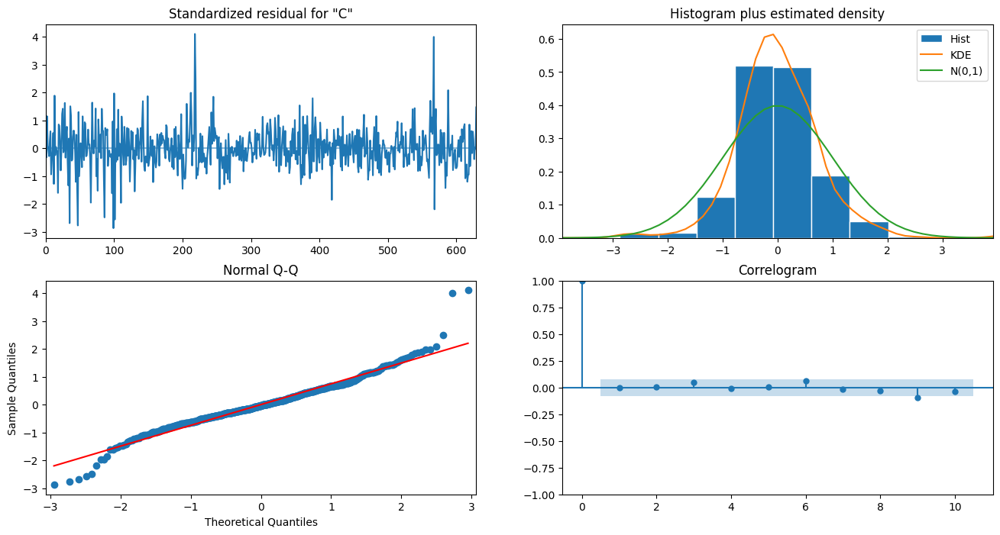

In [ ]:
results_grouped4.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_agrupado4 = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),exog=df_total4.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 hasta el 17 de septiembre de 2022, con exog le especificamos las variables que tendrá en cuenta como externas y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_agrupado_ci4 = pred_agrupado4.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = df_agrupado4['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_agrupado4.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred_agrupado4.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_agrupado_ci4.index, pred_agrupado_ci4.iloc[:, 0], pred_agrupado_ci4.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_agrupado_ci4.index son los índices de tiempo del intervalo de confianza, pred_agrupado_ci4.iloc[:, 0] son los límites inferiores y pred_agrupado_ci4.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

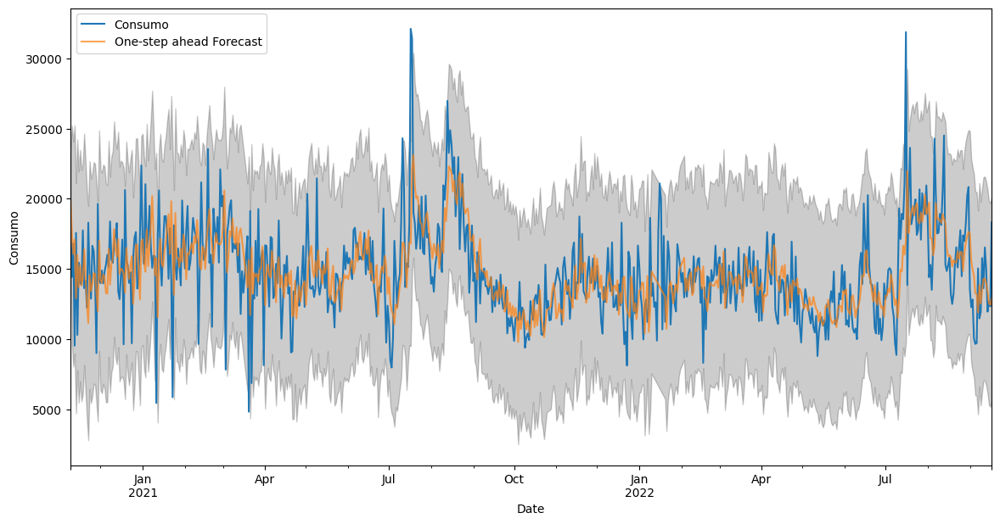

In [ ]:
pred_agrupado4 = results_grouped4.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),
                                       exog=df_total4.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False)
pred_agrupado_ci4 = pred_agrupado4.conf_int()

ax = df_agrupado4['2020':].plot(label='observed')
pred_agrupado4.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_agrupado_ci4.index,
                pred_agrupado_ci4.iloc[:, 0],
                pred_agrupado_ci4.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [ ]:
y_forecasted_agrupado4 = pred_agrupado4.predicted_mean
y_truth_agrupado4 = df_total4.loc['2020-11-09':'2022-09-17']['Consumo']

mse_agrupado4 = ((y_forecasted_agrupado4 - y_truth_agrupado4) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_agrupado4, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_agrupado4), 2)))

Error cuadrático medio: 7935785.32
Raiz del error cuadrático medio:2817.05


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [ ]:
pred_agrupado_df_cliente4 = pd.DataFrame(index=pred_agrupado4.predicted_mean.index)

pred_agrupado_df_cliente4['Consumo'] = df_agrupado4['Consumo']

pred_agrupado_df_cliente4['Predicted'] = pred_agrupado4.predicted_mean

pred_agrupado_df_cliente4['Lower Bound'] = pred_agrupado_ci4.iloc[:, 0]
pred_agrupado_df_cliente4['Upper Bound'] = pred_agrupado_ci4.iloc[:, 1]

In [ ]:
pred_agrupado_df_cliente4.to_csv('predicciones_agrupado_cliente4.csv', index=True)

##Datos del quinto cliente

Leemos el archivo .csv que contiene los datos del consumo del cliente

In [22]:
df_cliente5 = pd.read_csv('/content/TFG/DatosClientes/ConsumoHorario_Cliente5.csv', sep=',')
df_cliente5.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,69.0
1,2020-11-09 01:00:00,57.0
2,2020-11-09 02:00:00,43.0
3,2020-11-09 03:00:00,40.0
4,2020-11-09 04:00:00,35.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [23]:
df_cliente5['FechaHora'] = pd.to_datetime(df_cliente5['FechaHora'])

###Datos originales

Ponemos como indices del dataset las fechas para poder realizar una visualización de los datos del mismo

In [24]:
df_cliente5 = df_cliente5.set_index('FechaHora')
df_cliente5.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Preparamos los datos para una correcta visualización gráfica

In [25]:
y_cliente5 = df_cliente5['Consumo']
y_cliente5['2020':]

FechaHora
2020-11-09 00:00:00    69.0
2020-11-09 01:00:00    57.0
2020-11-09 02:00:00    43.0
2020-11-09 03:00:00    40.0
2020-11-09 04:00:00    35.0
                       ... 
2022-09-17 19:00:00    76.0
2022-09-17 20:00:00    76.0
2022-09-17 21:00:00    76.0
2022-09-17 22:00:00    76.0
2022-09-17 23:00:00    76.0
Name: Consumo, Length: 16272, dtype: float64

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver el consumo de energía de este cliente es elevado durante los meses más frios y más bajo en los meses cálidos

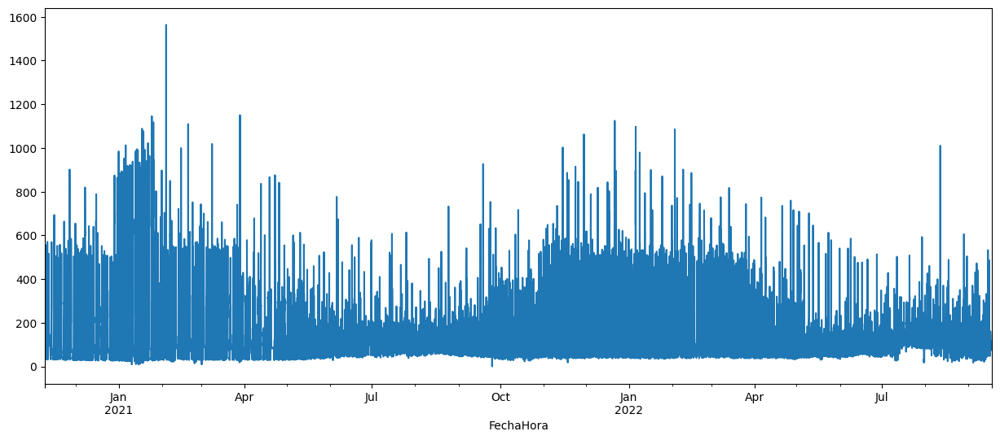

In [ ]:
y_cliente5.plot(figsize=(15, 6))
plt.show()

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

Se ha probado a cambiar a escala logarítmica para comporbar si se podía visualizar la gráfica "seasonal" sin obtener resultados

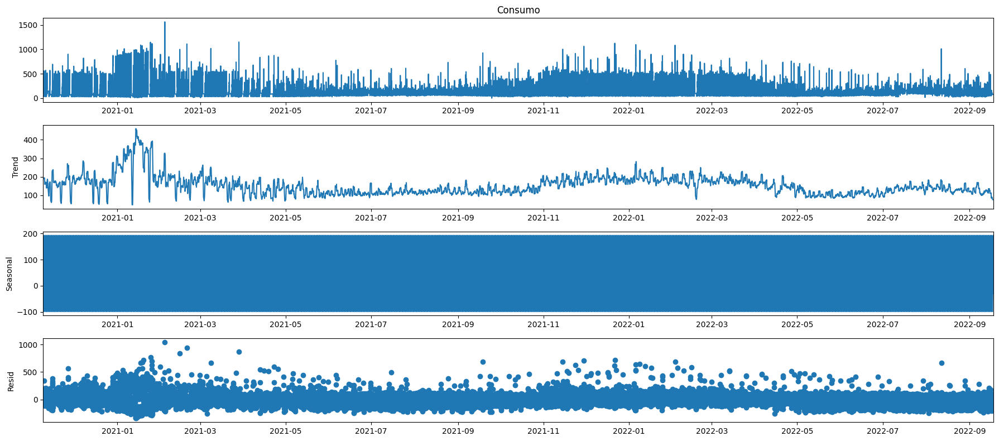

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log1p(y_cliente5)
decomposition = sm.tsa.seasonal_decompose(y_cliente5, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [14]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_cliente5,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:220387.3655985486
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:219384.15101843805
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:224174.16018910907
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:205880.4201751222
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:217953.81869381526
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:206056.67066869373
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:199629.8382236016
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:197970.1398684318
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:207733.3128584845
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:207051.16620992724
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:213626.28303806944
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:197211.3183011475
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:206360.26909265478
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:197374.46865258485
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:195858.67116497448
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:193195.23934553794
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:196831.53412878697
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:196650.7161460176

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod5 = sm.tsa.statespace.SARIMAX(y_cliente5, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo. Con order=(1, 0, 1) especificamos los órdenes del componente, autoregresivo (AR) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1), I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results5 = mod5.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results5.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [26]:
mod5 = sm.tsa.statespace.SARIMAX(y_cliente5,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results5 = mod5.fit()

print(results5.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6933      0.006    116.253      0.000       0.682       0.705
ma.L1         -0.0671      0.008     -8.740      0.000      -0.082      -0.052
ar.S.L12      -0.3559      0.006    -55.765      0.000      -0.368      -0.343
ma.S.L12      -0.9345      0.002   -450.797      0.000      -0.939      -0.930
sigma2      7414.8963     31.129    238.196      0.000    7353.884    7475.909


Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

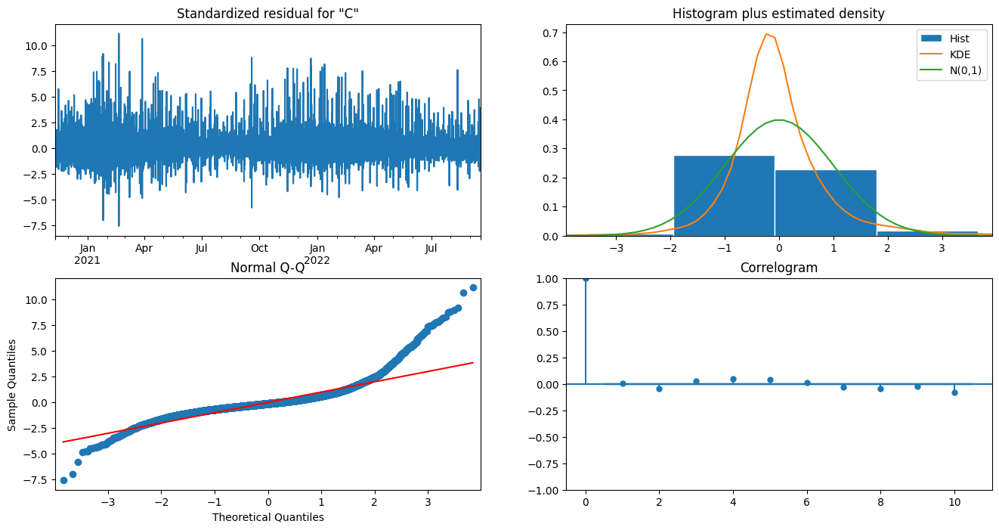

In [16]:
results5.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred5 = results5.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_ci5 = pred5.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_cliente5['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred5.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_ci5.index, pred_ci5.iloc[:, 0], pred_ci5.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_ci5.index son los índices de tiempo del intervalo de confianza, pred_ci5.iloc[:, 0] son los límites inferiores y pred_ci5.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

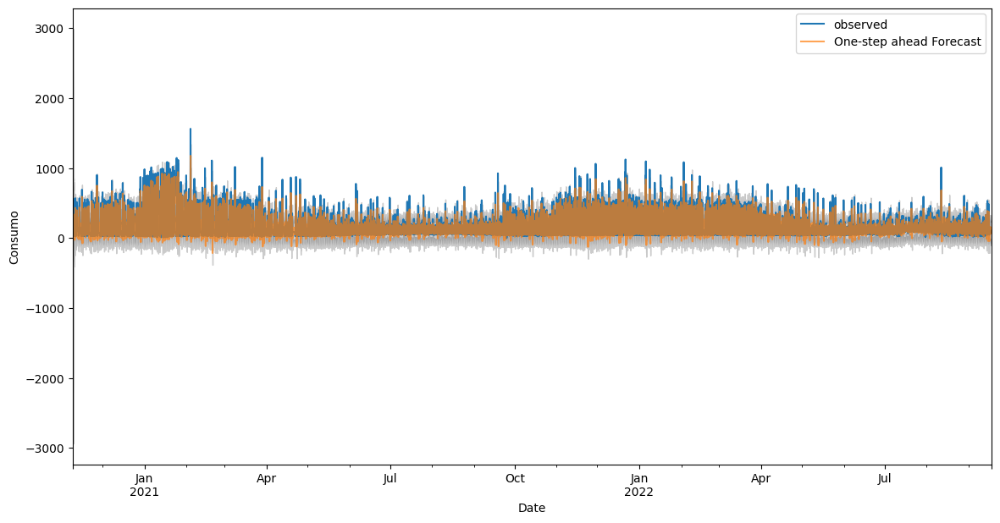

In [27]:
pred5 = results5.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)
pred_ci5 = pred5.conf_int()

ax = y_cliente5['2020':].plot(label='observed')
pred5.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci5.index,
                pred_ci5.iloc[:, 0],
                pred_ci5.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [28]:
y_forecasted5 = pred5.predicted_mean
y_truth5 = y_cliente5['2020-11-09':]

mse5 = ((y_forecasted5 - y_truth5) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse5, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse5), 2)))

Error cuadrático medio: 7440.59
Raiz del error cuadrático medio:86.26


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [19]:
pred_df_cliente5 = pd.DataFrame(index=pred5.predicted_mean.index)

pred_df_cliente5['Consumo'] = df_cliente5['Consumo']

pred_df_cliente5['Predicted'] = pred5.predicted_mean

pred_df_cliente5['Lower Bound'] = pred_ci5.iloc[:, 0]
pred_df_cliente5['Upper Bound'] = pred_ci5.iloc[:, 1]

In [ ]:
pred_df_cliente5.to_csv('predicciones_cliente5.csv', index=True)

A partir de este punto los datos usados estarán agrupados por días, es decir, asignaremos a cada día el consumo total realizado en ese día y probaremos a añadir valirables externas para ver que efecto tienen en la predicción

###Datos agrupados con variables externas

Creamos un nueva columna "fecha" que tendrá todas las fechas sin la parte horaria y agrupamos con la columna de consumo para tener el total de energía que se consumio ese día

In [ ]:
df_cliente5['fecha'] = df_cliente5['FechaHora'].dt.date
df_agrupado5 = df_cliente5.groupby('fecha')['Consumo'].sum().reset_index()
df_agrupado5.head()

,fecha,Consumo
0,2020-11-09,4594.0
1,2020-11-10,4106.0
2,2020-11-11,3332.0
3,2020-11-12,3456.0
4,2020-11-13,3928.0


Convertimos las fechas de la columna "fecha" a su tipo correcto

In [ ]:
df_agrupado5['fecha'] = pd.to_datetime(df_agrupado5['fecha'])

Juntamos los dataframe con los datos agrupados y las variables externas previamente preparadas usando de pivote la columna fecha, la cual debe coincidir en ambas tablas para se haga correctamente

In [ ]:
df_total5 = pd.merge(df_agrupado5, df_clima, on='fecha')
df_total5

,fecha,Consumo,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,4594.0,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,4106.0,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,3332.0,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,3456.0,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,3928.0,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3
...,...,...,...,...,...,...,...,...,...,...,...,...
652,2022-09-13,2874.0,22.2,1.0,17.8,26.6,19.0,4.7,16.7,6.0,932.6,930.1
653,2022-09-14,3257.0,21.2,0.0,16.1,26.3,23.0,3.3,13.9,6.7,935.3,931.7
654,2022-09-15,2668.0,20.4,0.6,16.2,24.6,30.0,1.7,11.4,4.6,936.5,934.6
655,2022-09-16,2096.0,21.0,0.0,14.2,27.9,29.0,1.7,7.8,12.0,936.6,933.2


Convertimos las fechas de la columna "fecha" de la tabla df_total a su tipo correcto y los asiganmos como índices

In [ ]:
df_total5['fecha'] = pd.to_datetime(df_total5['fecha'])
df_total5 = df_total5.set_index('fecha')
df_total5.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=657, freq=None)

Realizamos una visualización de cada una de las variables que tenemos en el dataframe

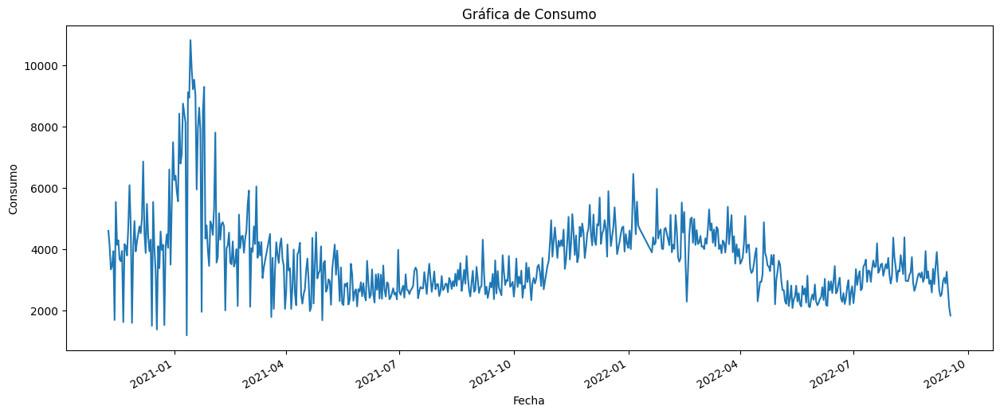

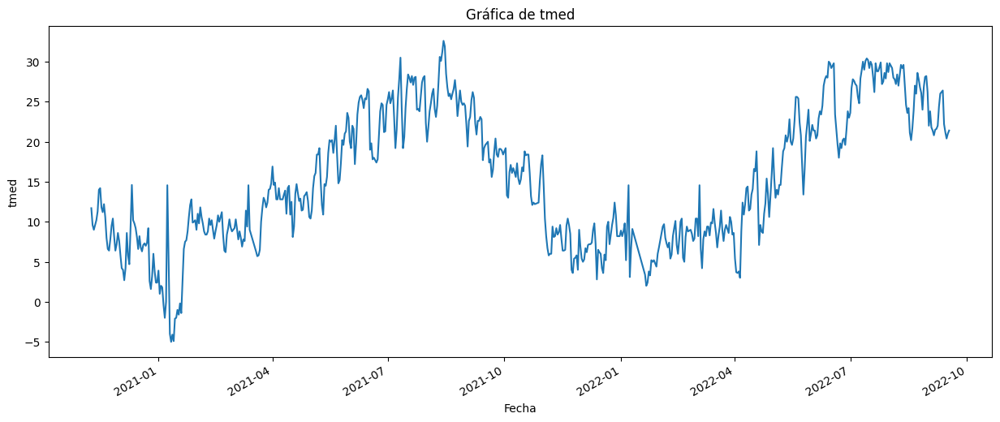

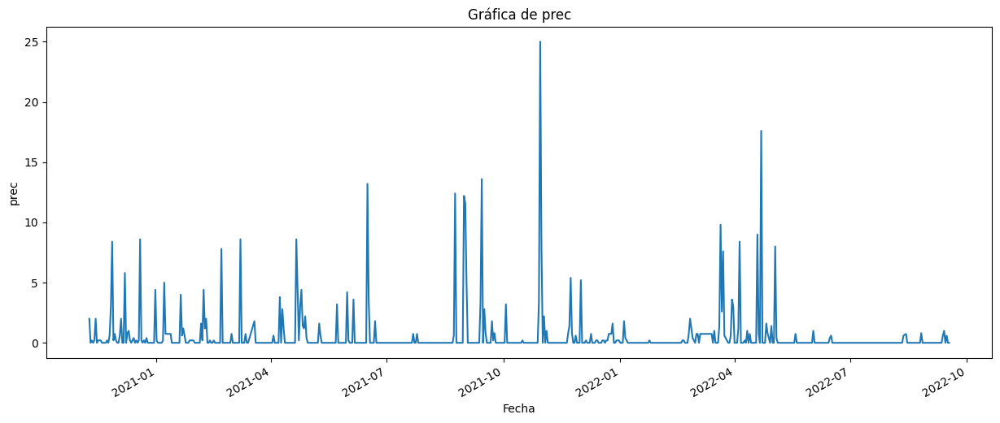

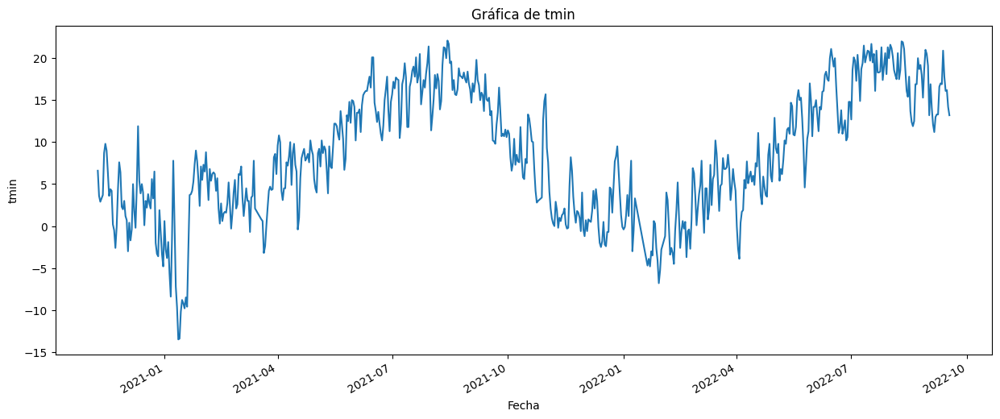

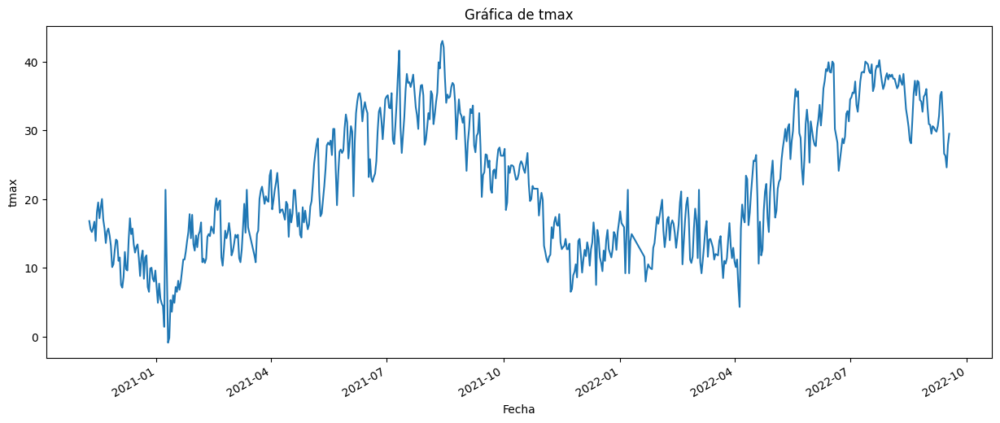

...

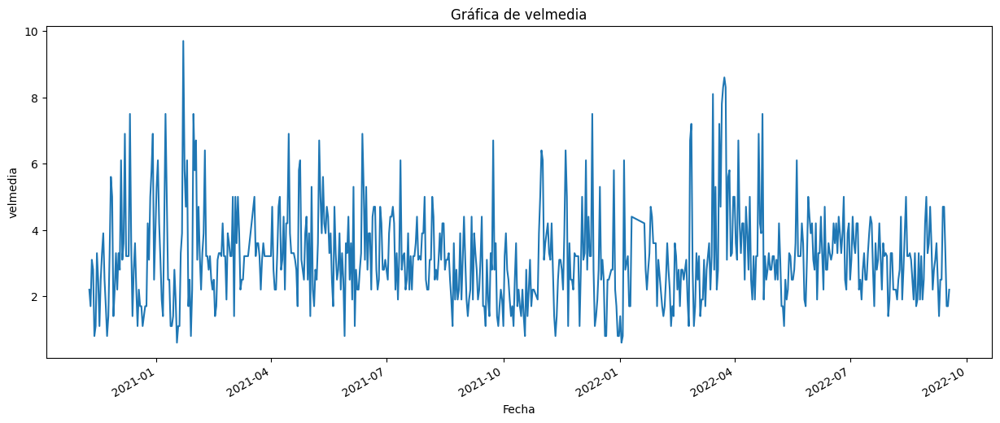

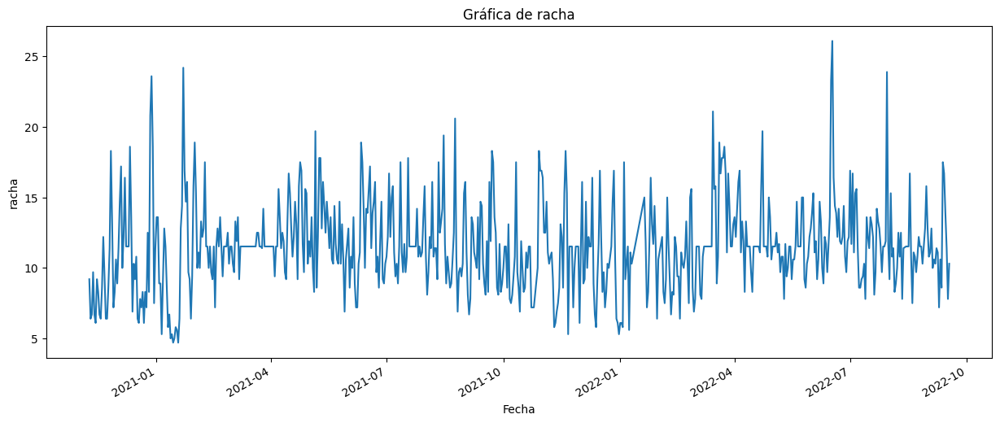

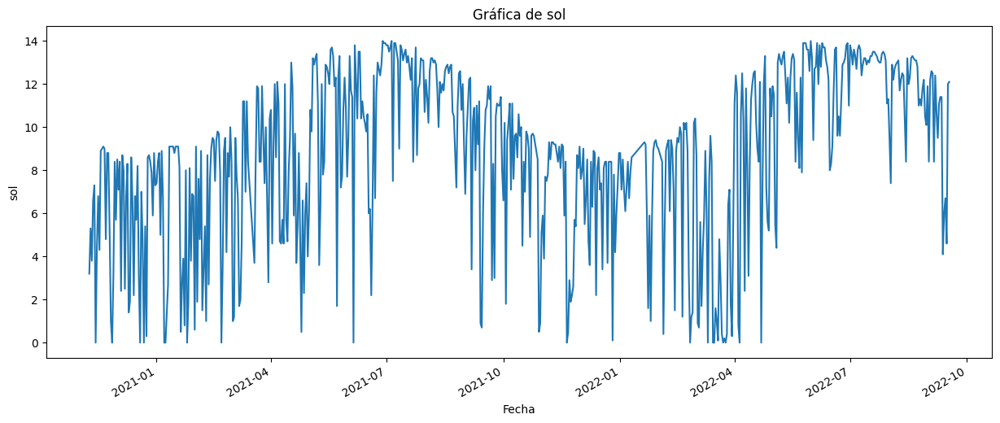

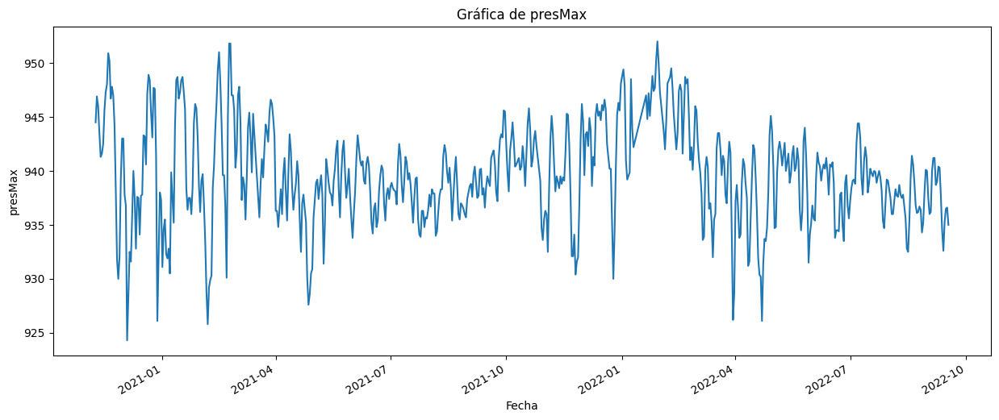

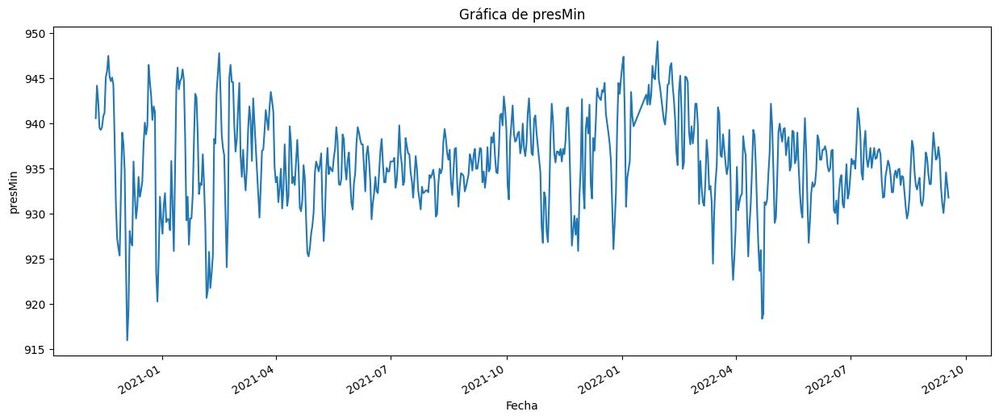

In [ ]:
for column in df_total5.columns:
  if column != 'fecha':
    fig, ax = plt.subplots(figsize=(15, 6))

    df_total5[column].plot(ax=ax)

    ax.set_title(f'Gráfica de {column}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel(column)

    plt.show()

Ponemos como indices del dataframe agrupado las fechas del mismo para poder realizar una visualización de la descompisción de los datos

In [ ]:
df_agrupado5 = df_agrupado5.set_index('fecha')
df_agrupado5.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=678, freq=None)

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

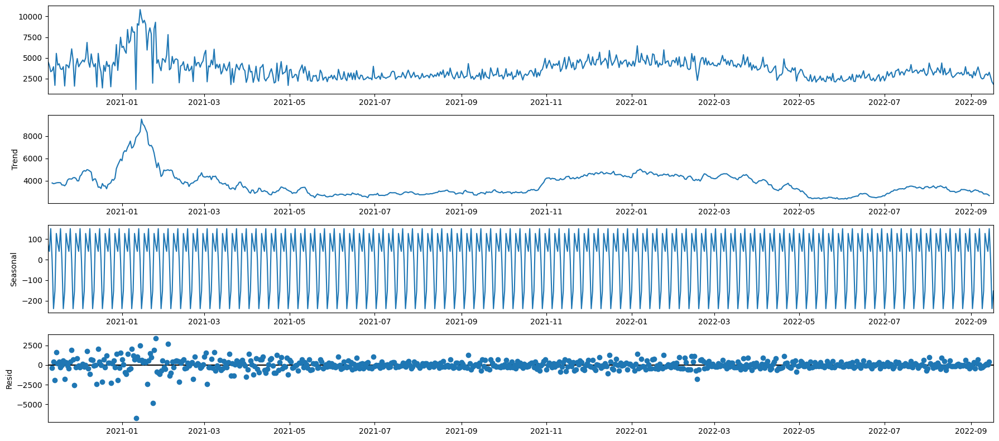

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(df_agrupado5, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_total5['Consumo'], exog=df_total5.drop('Consumo', axis=1),
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:10952.371327147557
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:10684.823415794051
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:10940.240182719012
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:10574.947729910444
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:10703.320406117131
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:10681.230422101367
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:10667.886501514113
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:10520.776335421106
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:10840.672485024439
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:10588.772289647532
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:10871.476636132475
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:10493.102932707901
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:10626.498265537944
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:10594.488000049772
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:10606.649122766567
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:10470.998729580464
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:10988.164671094657
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:10753.45226

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod_agrupado5 = sm.tsa.statespace.SARIMAX(df_total5['Consumo'], exog=df_total.drop('Consumo', axis=1), order=(0, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo, indicando en exog las variables exógenas que se utilizarán en el modelo. Con order=(0, 1, 1) especificamos los órdenes del componente, diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1), I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results_grouped5 = mod_agrupado5.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results_grouped5.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [ ]:
mod_agrupado5 = sm.tsa.statespace.SARIMAX(df_total5['Consumo'], exog=df_total5.drop('Consumo', axis=1),
                                order=(0, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_grouped5 = mod_agrupado5.fit()

print(results_grouped5.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
tmed        -963.2480   1120.977     -0.859      0.390   -3160.323    1233.827
prec          22.8665     24.459      0.935      0.350     -25.072      70.805
tmin         438.8850    562.191      0.781      0.435    -662.988    1540.758
tmax         446.5545    560.803      0.796      0.426    -652.599    1545.708
dir            0.5115      1.716      0.298      0.766      -2.852       3.875
velmedia      85.4960     41.555      2.057      0.040       4.050     166.943
racha        -20.2450     17.346     -1.167      0.243     -54.243      13.753
sol           -0.3093     15.362     -0.020      0.984     -30.419      29.800
presMax      -25.2980     20.691     -1.223      0.221     -65.853      15.257
presMin       19.4088     20.365      0.953      0.341     -20.507      59.324
ma.L1         -0.7689      0.020    -37.553      0.0

Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

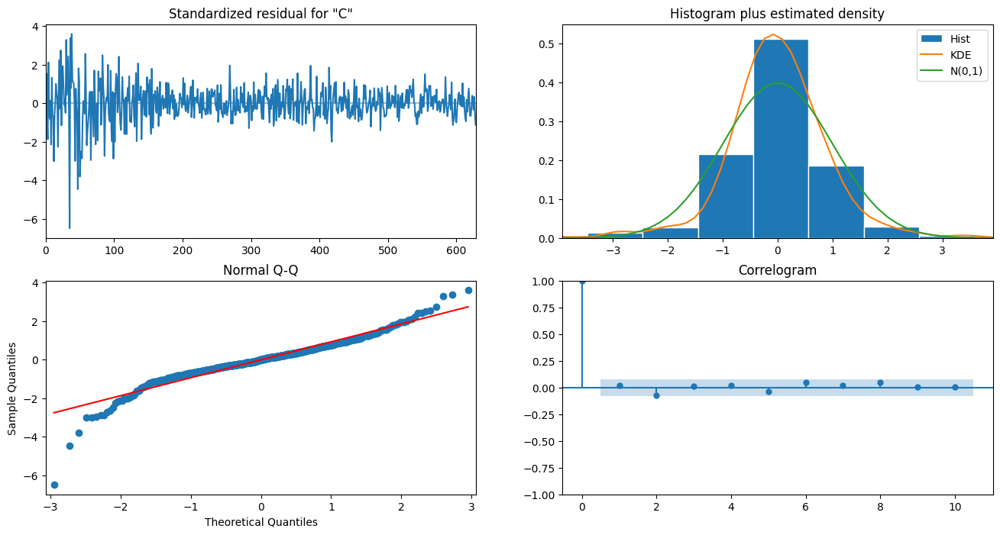

In [ ]:
results_grouped5.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_agrupado5 = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),exog=df_total5.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 hasta el 17 de septiembre de 2022, con exog le especificamos las variables que tendrá en cuenta como externas y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_agrupado_ci5 = pred_agrupado5.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = df_agrupado5['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_agrupado5.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred_agrupado4.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_agrupado_ci5.index, pred_agrupado_ci5.iloc[:, 0], pred_agrupado_ci5.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_agrupado_ci5.index son los índices de tiempo del intervalo de confianza, pred_agrupado_ci5.iloc[:, 0] son los límites inferiores y pred_agrupado_ci5.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

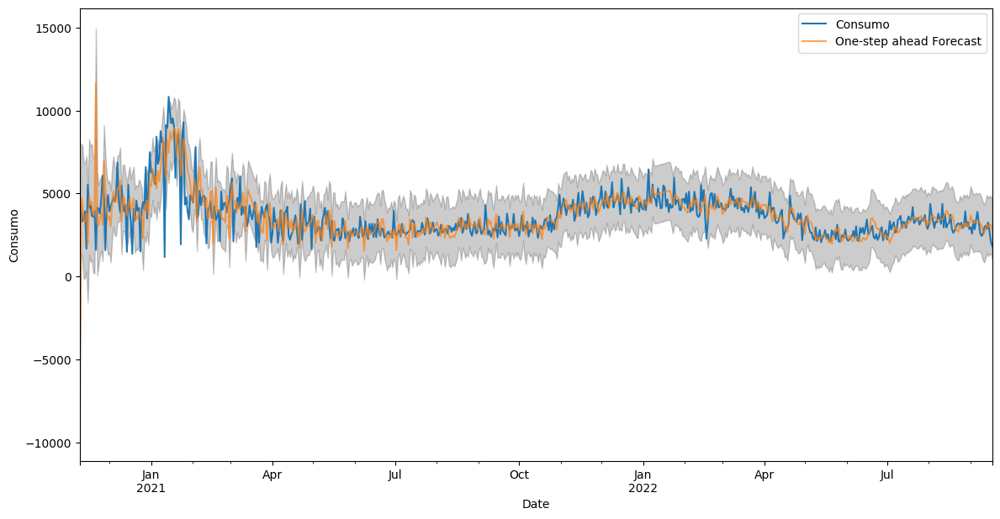

In [ ]:
pred_agrupado5 = results_grouped5.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),
                                       exog=df_total5.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False)
pred_agrupado_ci5 = pred_agrupado5.conf_int()

ax = df_agrupado5['2020':].plot(label='observed')
pred_agrupado5.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_agrupado_ci5.index,
                pred_agrupado_ci5.iloc[:, 0],
                pred_agrupado_ci5.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [ ]:
y_forecasted_agrupado5 = pred_agrupado5.predicted_mean
y_truth_agrupado5 = df_total5.loc['2020-11-09':'2022-09-17']['Consumo']

mse_agrupado5 = ((y_forecasted_agrupado5 - y_truth_agrupado5) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_agrupado5, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_agrupado5), 2)))

Error cuadrático medio: 1123589.01
Raiz del error cuadrático medio:1059.99


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [ ]:
pred_agrupado_df_cliente5 = pd.DataFrame(index=pred_agrupado5.predicted_mean.index)

pred_agrupado_df_cliente5['Consumo'] = df_agrupado5['Consumo']

pred_agrupado_df_cliente5['Predicted'] = pred_agrupado5.predicted_mean

pred_agrupado_df_cliente5['Lower Bound'] = pred_agrupado_ci5.iloc[:, 0]
pred_agrupado_df_cliente5['Upper Bound'] = pred_agrupado_ci5.iloc[:, 1]

In [ ]:
pred_agrupado_df_cliente5.to_csv('predicciones_agrupado_cliente5.csv', index=True)

#Datos totales de un centro

Leemos el archivo .csv que contiene los datos del centro de transformación y quitamos algunas columnas sobrantes que no interesan para hacer la serie temporal

In [10]:
df_centro = pd.read_csv('/content/TFG/ConsumoHorario_ORM5965138300 .csv', sep=',')
df_centro = df_centro.drop(['id', 'Cnt'], axis = 1)
df_centro.head()

,FechaHora,Consumo
0,2020-11-09 00:00:00,46000.0
1,2020-11-09 01:00:00,34000.0
2,2020-11-09 02:00:00,27000.0
3,2020-11-09 03:00:00,25000.0
4,2020-11-09 04:00:00,22000.0


Convertimos las fechas de la columna "FechaHora" a su tipo correcto

In [11]:
df_centro['FechaHora'] = pd.to_datetime(df_centro['FechaHora'])

###Datos originales

Ponemos como indices del dataset las fechas para poder realizar una visualización de los datos del mismo

In [12]:
df_centro = df_centro.set_index('FechaHora')
df_centro.index

DatetimeIndex(['2020-11-09 00:00:00', '2020-11-09 01:00:00',
               '2020-11-09 02:00:00', '2020-11-09 03:00:00',
               '2020-11-09 04:00:00', '2020-11-09 05:00:00',
               '2020-11-09 06:00:00', '2020-11-09 07:00:00',
               '2020-11-09 08:00:00', '2020-11-09 09:00:00',
               ...
               '2022-09-17 14:00:00', '2022-09-17 15:00:00',
               '2022-09-17 16:00:00', '2022-09-17 17:00:00',
               '2022-09-17 18:00:00', '2022-09-17 19:00:00',
               '2022-09-17 20:00:00', '2022-09-17 21:00:00',
               '2022-09-17 22:00:00', '2022-09-17 23:00:00'],
              dtype='datetime64[ns]', name='FechaHora', length=16272, freq=None)

Preparamos los datos para una correcta visualización gráfica

In [13]:
y_centro = df_centro['Consumo']
y_centro['2020':]

FechaHora
2020-11-09 00:00:00    46000.0
2020-11-09 01:00:00    34000.0
2020-11-09 02:00:00    27000.0
2020-11-09 03:00:00    25000.0
2020-11-09 04:00:00    22000.0
                        ...   
2022-09-17 19:00:00    31298.0
2022-09-17 20:00:00    31298.0
2022-09-17 21:00:00    31298.0
2022-09-17 22:00:00    31298.0
2022-09-17 23:00:00    31298.0
Name: Consumo, Length: 16272, dtype: float64

Visualizamos los datos iniciales para poder detectar algún patrón que nos ayude a realizar el análisis.
Como se puede ver en los meses de invierno se consume más energía que en los meses de primavera

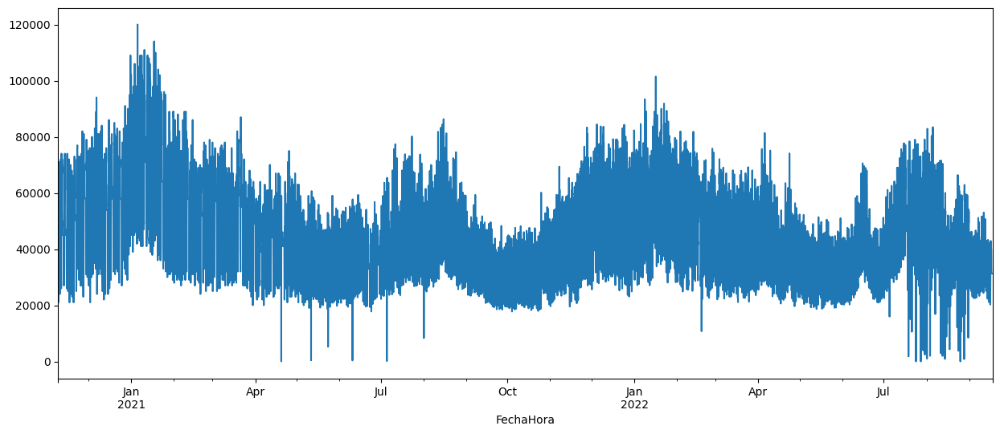

In [ ]:
y_centro.plot(figsize=(15, 6))
plt.show()

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

Se ha probado a cambiar a escala logarítmica para comporbar si se podía visualizar la gráfica "seasonal" sin obtener resultados

* Trend: Se puede definir como un cambio a largo plazo que se produce en relación al nivel medio, o el cambio a largo plazo de la media. La tendencia se identifica con un movimiento suave de la serie a largo plazo.

* Seasonality: La variación de la serie en algún periodo de tiempo se conoce como efecto estacional.

* Resid: En una serie temporal la tendencia y la estacionariedad resultan ser de naturaleza determinística, mientras que la aleatoriedad es de naturaleza probabilística por lo que resultara útil inferir el comportamiento de la serie temporal a largo plazo seleccionando una distribución de probabilidad adecuada para dicho fin.

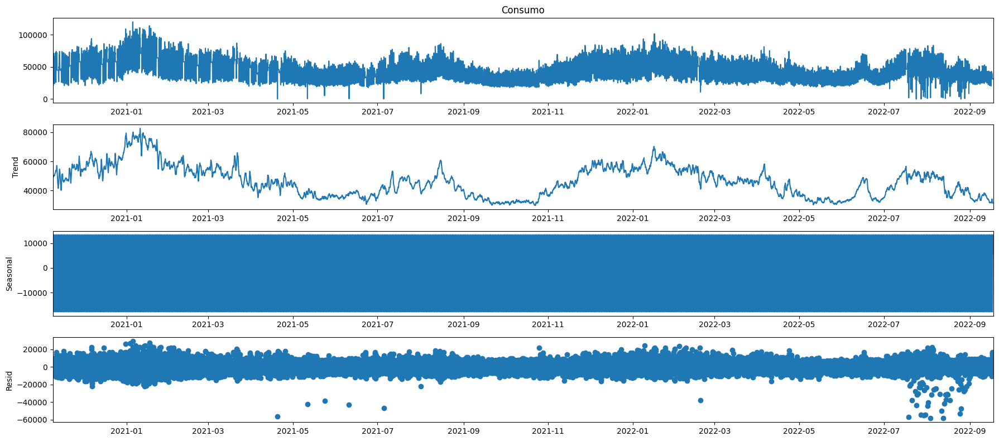

In [ ]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log1p(y_centro)
decomposition = sm.tsa.seasonal_decompose(y_centro, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [14]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [ ]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y_centro,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:397564.42973780626
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:390791.4037901986
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:370295.5635102296
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:358752.78992349573
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:369525.4612540086
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:358668.2208553517
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:335484.8684768923
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:335465.2151051876
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:385930.71084334794
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:383803.6238696655
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:359039.9874205333
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:356881.5709773316
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:381944.5596979983
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:381168.7175779599
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:356747.85058933165
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:356005.7965072233
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:331615.75457757496
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:331373.3389484509
ARIMA

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod_centro = sm.tsa.statespace.SARIMAX(y_centro, order=(1, 1, 1), seasonal_order=(0, 0, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo. Con order=(1, 1, 1) especificamos los órdenes del componente, autoregresivo (AR), diferenciación (I) y media móvil (MA) del modelo SARIMAX. En este caso, utilizamos una componente estacional MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results_centre = mod_centro.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results_centre.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [15]:
mod_centro = sm.tsa.statespace.SARIMAX(y_centro,
                                order=(1, 1, 1),
                                seasonal_order=(0, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_centre = mod_centro.fit()

print(results_centre.summary().tables[1])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5108      0.045     11.463      0.000       0.423       0.598
ma.L1         -0.3928      0.045     -8.791      0.000      -0.480      -0.305
ma.S.L12       0.0089      0.006      1.607      0.108      -0.002       0.020
sigma2      4.089e+07   2.83e-09   1.44e+16      0.000    4.09e+07    4.09e+07


Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

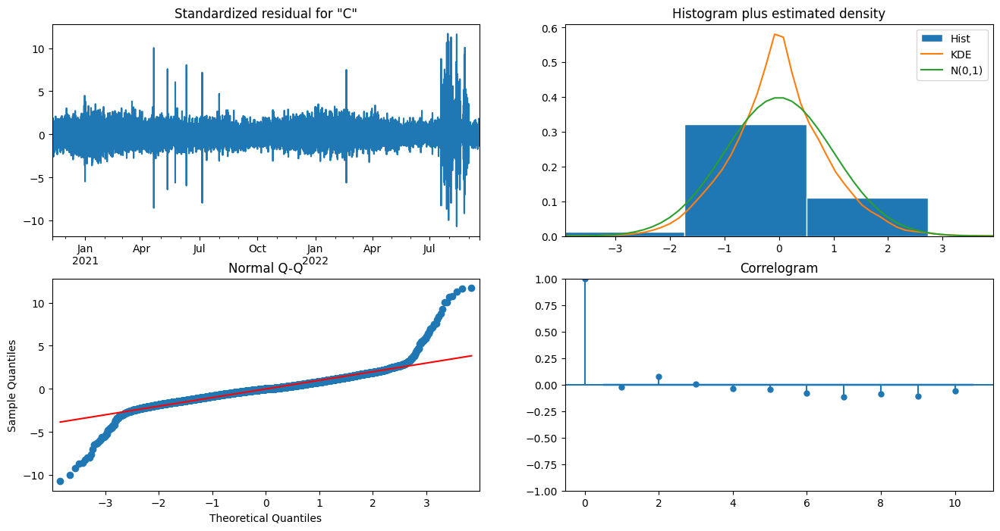

In [16]:
results_centre.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_centro = results_centre.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_centro_ci = pred_centro.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = y_centro['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_centro.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_centro_ci.index, pred_centro_ci.iloc[:, 0], pred_centro_ci.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_centro_ci.index son los índices de tiempo del intervalo de confianza, pred_centro_ci.iloc[:, 0] son los límites inferiores y pred_centro_ci.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

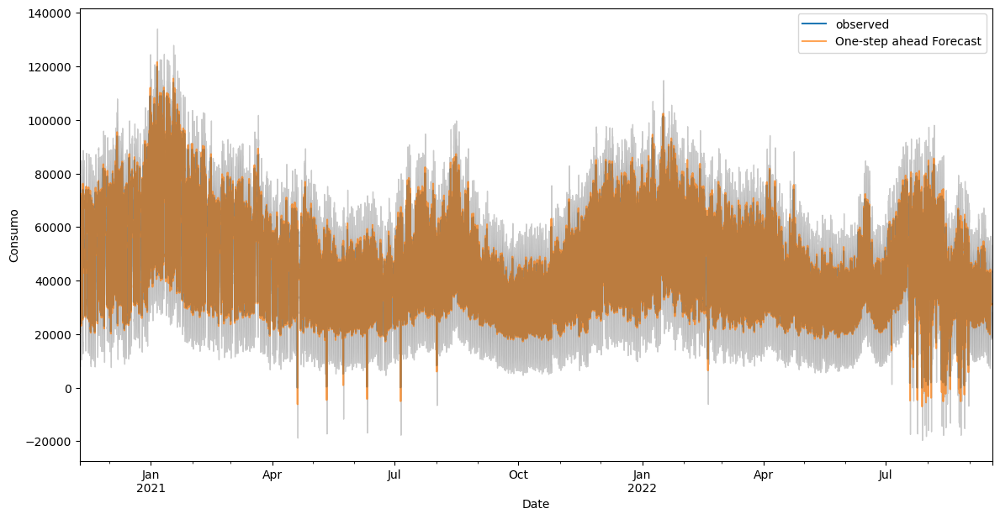

In [18]:
pred_centro = results_centre.get_prediction(start=pd.to_datetime('2020-11-09'), dynamic=False)
pred_centro_ci = pred_centro.conf_int()

ax = y_centro['2020':].plot(label='observed')
pred_centro.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_centro_ci.index,
                pred_centro_ci.iloc[:, 0],
                pred_centro_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [21]:
y_forecasted_centro = pred_centro.predicted_mean
y_truth_centro = y_centro['2020-11-09':]

mse_centro = ((y_forecasted_centro - y_truth_centro) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_centro, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_centro), 2)))

Error cuadrático medio: 41021560.62
Raiz del error cuadrático medio:6404.81


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [20]:
pred_df_centro = pd.DataFrame(index=pred_centro.predicted_mean.index)

pred_df_centro['Consumo'] = df_centro['Consumo']

pred_df_centro['Predicted'] = pred_centro.predicted_mean

pred_df_centro['Lower Bound'] = pred_centro_ci.iloc[:, 0]
pred_df_centro['Upper Bound'] = pred_centro_ci.iloc[:, 1]

In [ ]:
pred_df_centro.to_csv('predicciones_centro.csv', index=True)

A partir de este punto los datos usados estarán agrupados por días, es decir, asignaremos a cada día el consumo total realizado en ese día y probaremos a añadir valirables externas para ver que efecto tienen en la predicción

###Datos agrupados con variables externas

Creamos un nueva columna "fecha" que tendrá todas las fechas sin la parte horaria y agrupamos con la columna de consumo para tener el total de energía que se consumio ese día

In [12]:
df_centro['fecha'] = df_centro['FechaHora'].dt.date
df_centro_agrupado = df_centro.groupby('fecha')['Consumo'].sum().reset_index()
df_centro_agrupado.head()

,fecha,Consumo
0,2020-11-09,1188000.0
1,2020-11-10,1242000.0
2,2020-11-11,1288000.0
3,2020-11-12,1080000.0
4,2020-11-13,1228000.0


Convertimos las fechas de la columna "fecha" a su tipo correcto

In [13]:
df_centro_agrupado['fecha'] = pd.to_datetime(df_centro_agrupado['fecha'])

Juntamos los dataframe con los datos agrupados y las variables externas previamente preparadas usando de pivote la columna fecha, la cual debe coincidir en ambas tablas para se haga correctamente

In [14]:
df_centro_total = pd.merge(df_centro_agrupado, df_clima, on='fecha')
df_centro_total

,fecha,Consumo,tmed,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
0,2020-11-09,1188000.0,11.7,2.0,6.6,16.8,21.0,2.2,9.2,3.2,944.5,940.6
1,2020-11-10,1242000.0,9.6,0.0,3.6,15.6,28.0,1.7,6.4,5.3,946.9,944.2
2,2020-11-11,1288000.0,9.0,0.2,2.9,15.2,10.0,3.1,6.7,3.8,946.0,942.4
3,2020-11-12,1080000.0,9.6,0.0,3.3,15.8,10.0,2.8,9.7,6.6,943.5,939.5
4,2020-11-13,1228000.0,10.2,0.2,3.7,16.7,11.0,0.8,6.7,7.3,941.3,939.3
...,...,...,...,...,...,...,...,...,...,...,...,...
652,2022-09-13,834903.0,22.2,1.0,17.8,26.6,19.0,4.7,16.7,6.0,932.6,930.1
653,2022-09-14,808979.0,21.2,0.0,16.1,26.3,23.0,3.3,13.9,6.7,935.3,931.7
654,2022-09-15,757819.0,20.4,0.6,16.2,24.6,30.0,1.7,11.4,4.6,936.5,934.6
655,2022-09-16,757611.0,21.0,0.0,14.2,27.9,29.0,1.7,7.8,12.0,936.6,933.2


Convertimos las fechas de la columna "fecha" de la tabla df_total a su tipo correcto y los asiganmos como índices

In [15]:
df_centro_total['fecha'] = pd.to_datetime(df_centro_total['fecha'])
df_centro_total = df_centro_total.set_index('fecha')
df_centro_total.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=657, freq=None)

Realizamos una visualización de cada una de las variables que tenemos en el dataframe

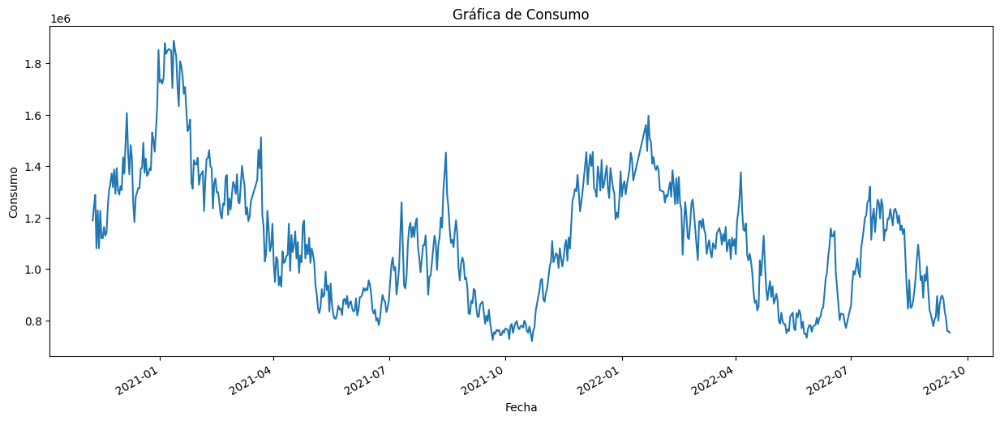

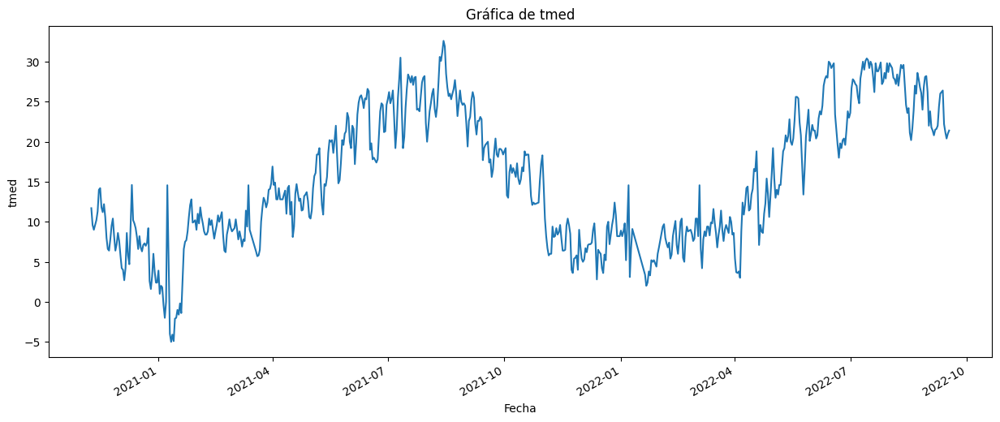

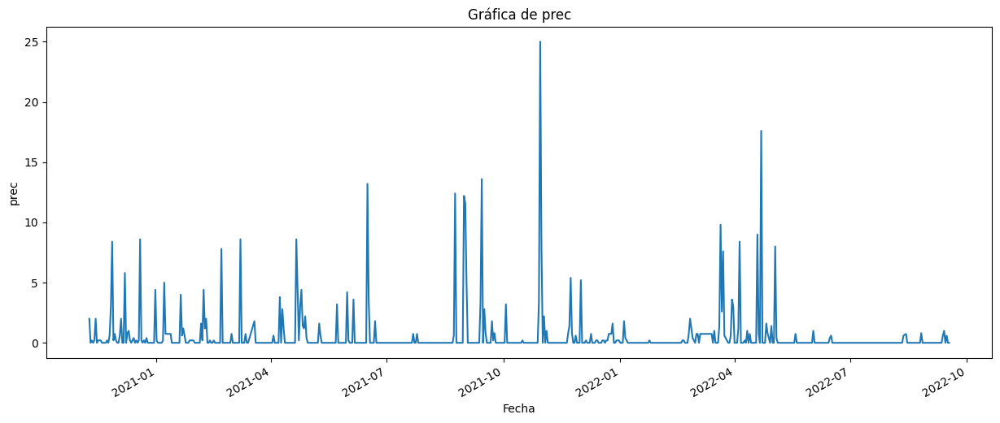

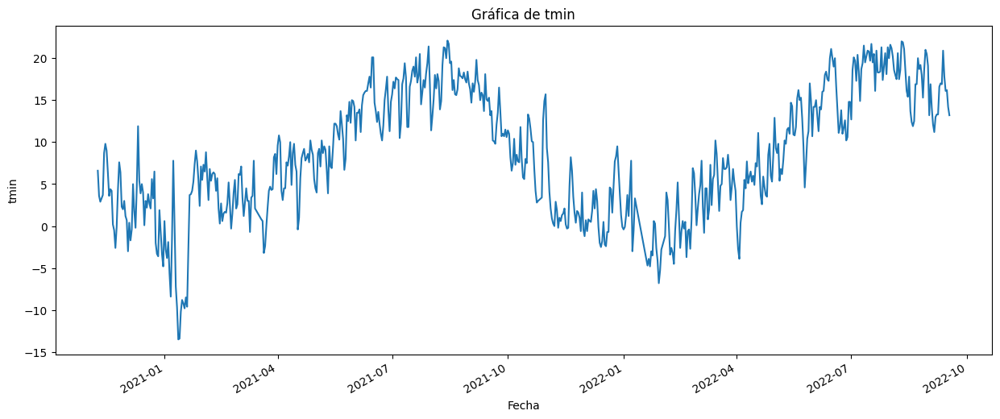

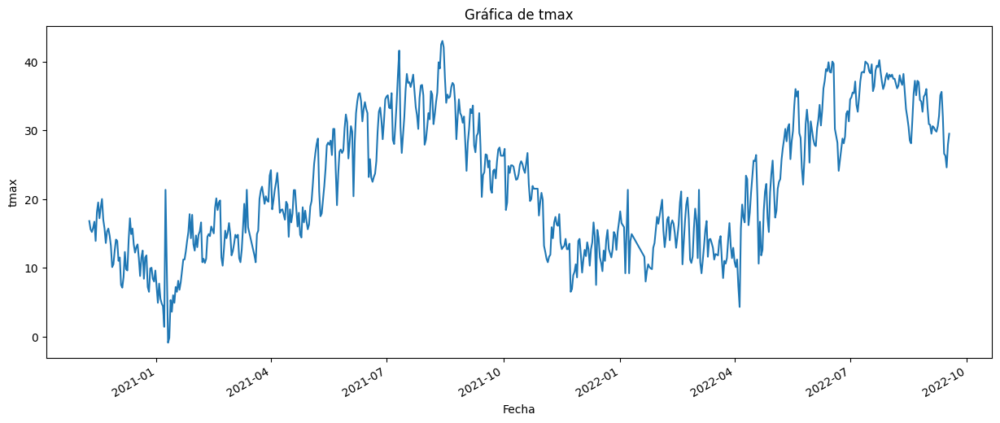

...

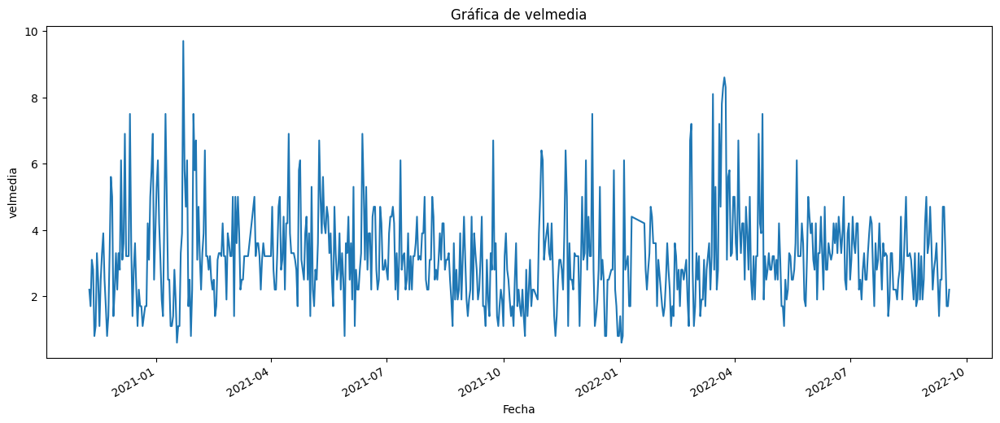

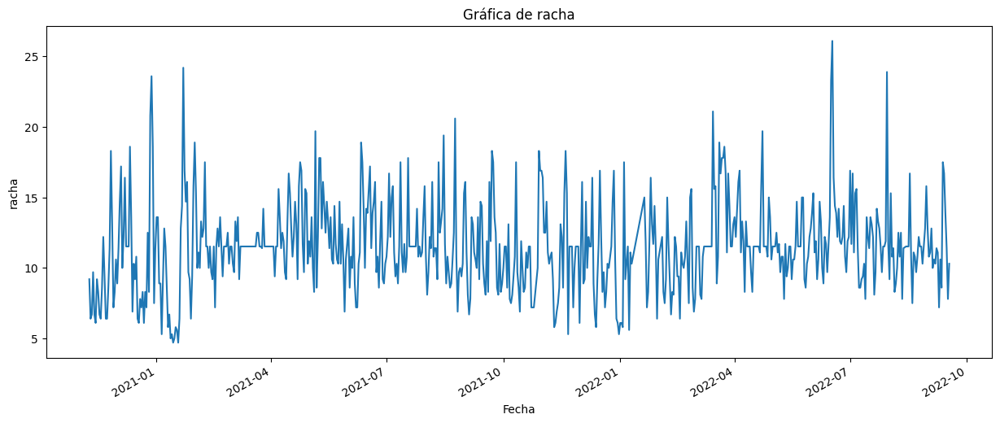

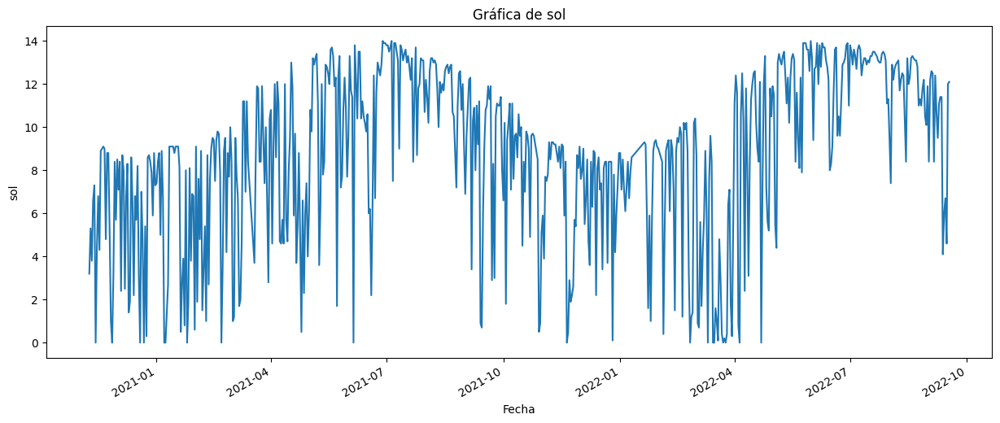

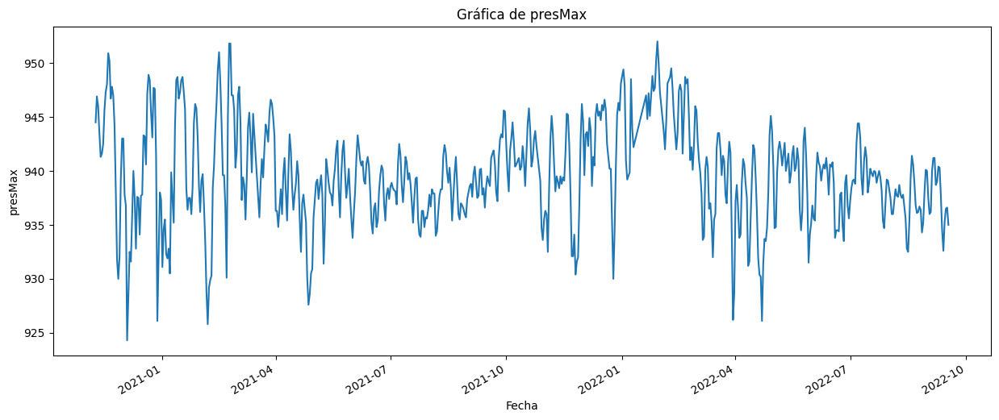

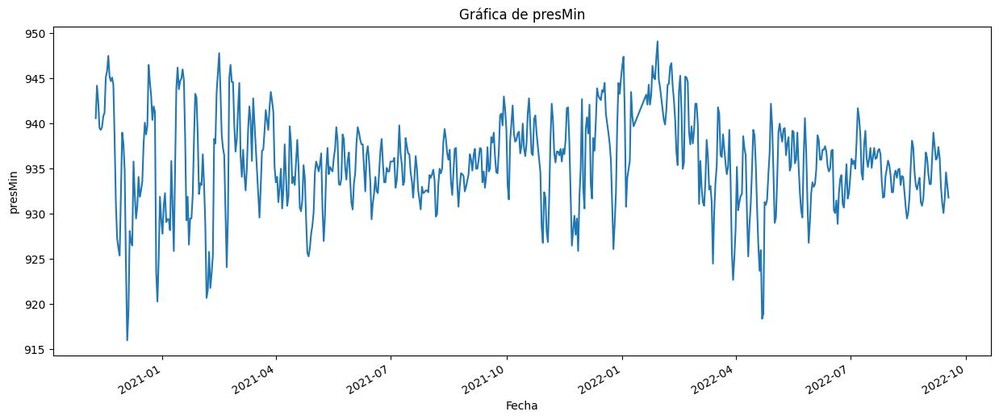

In [16]:
for column in df_centro_total.columns:
  if column != 'fecha':
    fig, ax = plt.subplots(figsize=(15, 6))

    df_centro_total[column].plot(ax=ax)

    ax.set_title(f'Gráfica de {column}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel(column)

    plt.show()

Ponemos como indices del dataframe agrupado las fechas del mismo para poder realizar una visualización de la descompisción de los datos

In [17]:
df_centro_agrupado = df_centro_agrupado.set_index('fecha')
df_centro_agrupado.index

DatetimeIndex(['2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12',
               '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16',
               '2020-11-17', '2020-11-18',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='fecha', length=678, freq=None)

Visualizamos componentes de la prediccón como son la tendencia, la estacionalidad (por algún motivo sale mal) y la aleatoriedad

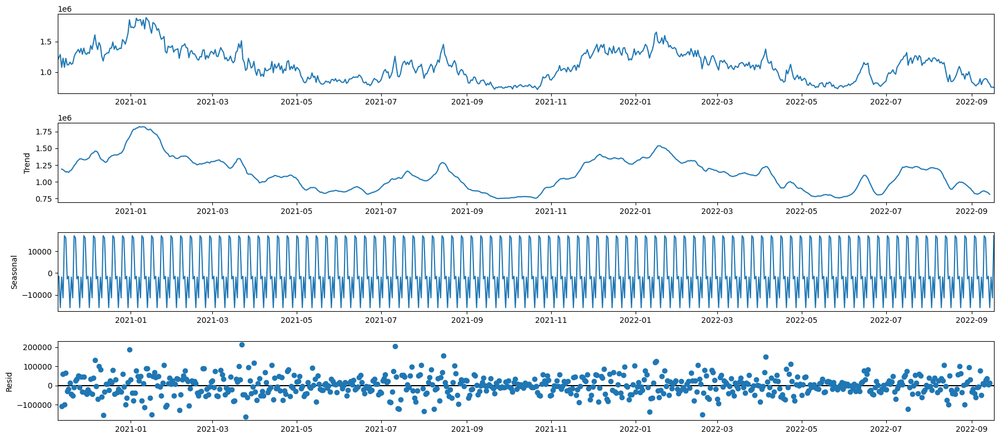

In [18]:
rcParams['figure.figsize'] = 18, 8

#y_log = np.log(y)
decomposition = sm.tsa.seasonal_decompose(df_centro_agrupado, model='additive')
fig = decomposition.plot()
plt.show()

Generamos una lista de combinaciones de parámetros para el modelo SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables), tanto para los componentes no estacionales como para los componentes estacionales.

In [19]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

Ajustamos una serie de modelos SARIMAX a una serie de tiempo utilizando diferentes combinaciones de parámetros no estacionales y estacionales. Luego, mostamos el valor del AIC para cada modelo ajustado.

In [20]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_centro_total['Consumo'], exog=df_centro_total.drop('Consumo', axis=1),
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:21473.978769392153
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:17388.08784008024
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:20815.273786169397
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:16965.458933861453
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:17290.58120350191
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:17265.622336017677
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:16989.551133006033
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:16964.40664596692
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:17475.013840438485
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:17101.060584303734
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:16953.212677574244
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:16596.108754378867
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:17134.62876561779
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:17082.459706833994
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:16644.475161603033
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:16593.862328853305
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:20037.688804138605
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:16122.845821386

De todos los modelos ajustados anteriormente, escogemos el que menor valor AIC tiene para ajustar nuestro modelo y mostarar los coeficientes estimados del modelo

mod_agrupado_centro = sm.tsa.statespace.SARIMAX(df_centro_total['Consumo'], exog=df_centro_total.drop('Consumo', axis=1), order=(0, 1, 0), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False): Creamos una instancia del modelo SARIMAX e indicamos la serie temporal a la que se ajustará el modelo, indicando en exog las variables exógenas que se utilizarán en el modelo. Con order=(0, 1, 0) especificamos los órdenes del componente, diferenciación (I) del modelo SARIMAX. En este caso, utilizamos una componente estacional AR(1), I(1) y MA(1) con una estacionalidad de 12 meses. enforce_stationarity=False y enforce_invertibility=False indican que no se impondrán restricciones de estacionariedad o invertibilidad en el modelo.

results_groresults_grouped_centreuped5 = mod_agrupado_centro.fit(): Ajustamos el modelo SARIMAX a los datos de la serie temporal utilizando el método fit(). Los parámetros del modelo se estiman a partir de los datos.

print(results_grouped_centre.summary().tables[1]): Imprimimos un resumen del ajuste del modelo y devolvemos un objeto que contiene varias tablas con información relevante sobre el ajuste del modelo. En este caso, la tabla del resumen, contiene estadísticas de coeficientes, errores estándar y valores p asociados.

In [21]:
mod_agrupado_centro = sm.tsa.statespace.SARIMAX(df_centro_total['Consumo'], exog=df_centro_total.drop('Consumo', axis=1),
                                order=(0, 1, 0),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_grouped_centre = mod_agrupado_centro.fit()

print(results_grouped_centre.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
tmed       -5.032e+04   6.94e+04     -0.725      0.469   -1.86e+05    8.58e+04
prec          57.6787   1322.599      0.044      0.965   -2534.567    2649.925
tmin        2.369e+04   3.48e+04      0.680      0.496   -4.45e+04    9.19e+04
tmax        2.501e+04   3.47e+04      0.721      0.471    -4.3e+04     9.3e+04
dir          -18.7426    164.537     -0.114      0.909    -341.229     303.744
velmedia    -599.2079   2753.848     -0.218      0.828   -5996.650    4798.234
racha       1241.9410   1361.919      0.912      0.362   -1427.372    3911.254
sol        -3685.2897   1110.527     -3.319      0.001   -5861.883   -1508.696
presMax     1853.6725   1479.675      1.253      0.210   -1046.437    4753.782
presMin     -522.1457   1482.020     -0.352      0.725   -3426.852    2382.561
ar.S.L12       0.0629      0.050      1.247      0.2

Visualizamos los gráficos de diagnostico para evaluar la calidad del modelo



* Standardized Residual Plot: Esta gráfica muestra los residuos estandarizados, que son las diferencias entre los valores observados y los valores predichos de tu modelo, divididos por la desviación estándar de los residuos. Los residuos estandarizados se utilizan para identificar valores atípicos o inusuales en tus datos. En la gráfica, los puntos se dispersan alrededor de cero, y si hay patrones sistemáticos o valores extremos, podría indicar que el modelo no está capturando adecuadamente la estructura de los datos.

* Histogram Plus Estimated Density Plot: Esta gráfica muestra un histograma de los residuos junto con la densidad estimada de los residuos. El histograma muestra la distribución de los residuos, mientras que la densidad estimada proporciona una estimación suave de la distribución subyacente. Esto permite visualizar si los residuos se distribuyen de manera aproximadamente normal y si hay alguna asimetría o sesgo en la distribución.

* Normal Q-Q Plot: El gráfico Q-Q (quantile-quantile) compara la distribución de los residuos con una distribución teórica normal. Los valores observados de los residuos se ordenan y se comparan con los valores esperados de una distribución normal. Si los puntos siguen aproximadamente una línea diagonal, sugiere que los residuos se distribuyen de manera normal. Sin embargo, desviaciones significativas de la línea diagonal pueden indicar una distribución no normal de los residuos.

* Correlogram: Esta gráfica muestra la autocorrelación de los residuos en función del retraso (lag). La autocorrelación es una medida de la similitud entre los valores de una serie de tiempo y los valores retrasados en el tiempo. Si los residuos están descorrelacionados, no debería haber patrones significativos en el correlograma. Sin embargo, si hay correlaciones significativas en ciertos retrasos, puede indicar que el modelo no está capturando completamente la estructura de autocorrelación en los datos.

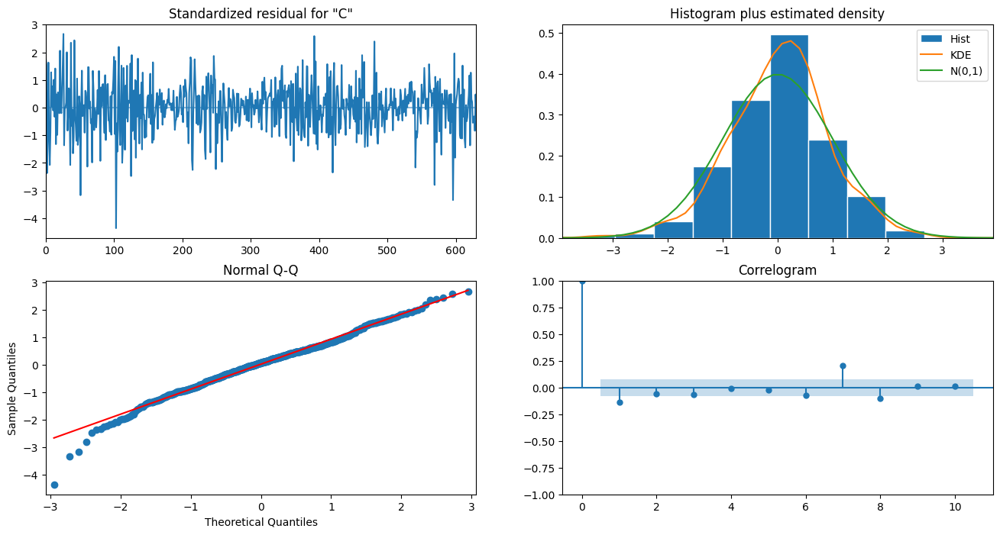

In [22]:
results_grouped_centre.plot_diagnostics(figsize=(16, 8))
plt.show()

Utilizando el modelo ajustado anteriormente visualizamos en un gráfico los datos observados junto con las predicciones

pred_agrupado_centro = results_grouped.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),exog=df_centro_total.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False): Realiza la predicción utilizando el modelo ajustado previamente. Especificamos la fecha a partir de la cual se realizará la predicción, en este caso, es el 9 de noviembre de 2020 hasta el 17 de septiembre de 2022, con exog le especificamos las variables que tendrá en cuenta como externas y le indicamos que la predicción no se realizará de forma dinámica, lo que significa que no se utilizarán las predicciones anteriores como entrada para las predicciones futuras.

pred_agrupado_centro_ci = pred_agrupado_centro.conf_int(): Obtiene los intervalos de confianza para la predicción realizad y devolvemos un DataFrame que contiene los límites inferior y superior del intervalo de confianza para cada punto de tiempo de la predicción.

ax = ax = df_centro_agrupado['2020':].plot(label='observed')
['2020':].plot(label='observed'): Aquí se crea un objeto de ejes (ax) para realizar la visualización y seleccionamos los datos observados a partir del año 2020. Se traza esta serie de tiempo como una línea y se le asigna la etiqueta "observed".

pred_agrupado_centro.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7)): Aquí se traza la serie temporal de la predicción utilizando pred_agrupado4.predicted_mean, que representa la media de las predicciones realizadas. Se agrega esta línea a los ejes ax y se le asigna la etiqueta "One-step ahead Forecast", establecemos la transparencia de la línea a 0.7 para que sea parcialmente transparente y establecemos el tamaño de la figura en pulgadas.

ax.fill_between(pred_agrupado_centro_ci.index, pred_agrupado_centro_ci.iloc[:, 0], pred_agrupado_centro_ci.iloc[:, 1], color='k', alpha=.2): Esto agrega un sombreado en el área entre los límites inferior y superior del intervalo de confianza en los ejes ax. El sombreado se realiza utilizando fill_between. pred_agrupado_centro_ci.index son los índices de tiempo del intervalo de confianza, pred_agrupado_centro_ci.iloc[:, 0] son los límites inferiores y pred_agrupado_centro_ci.iloc[:, 1] son los límites superiores del intervalo de confianza. Establecemos el color del sombreado en negro y establecemos la transparencia del sombreado en 0.2.

ax.set_xlabel('Date') y ax.set_ylabel('Consumo'): Aquí establecemos las etiquetas de los ejes x e y respectivamente.

plt.legend(): Mostramos la leyenda en el gráfico.

plt.show(): Finalmente, mostramos el gráfico

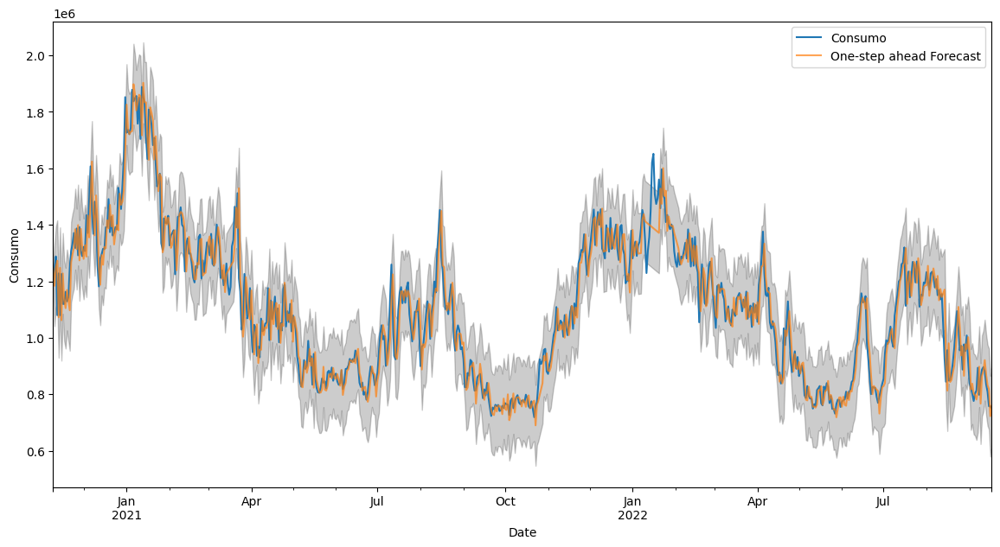

In [25]:
pred_agrupado_centro = results_grouped_centre.get_prediction(start=pd.to_datetime('2020-11-09'), end=pd.to_datetime('2022-09-17'),
                                       exog=df_centro_total.loc['2020-11-09':'2022-09-17'].drop('Consumo', axis=1), dynamic=False)
pred_agrupado_centro_ci = pred_agrupado_centro.conf_int()

ax = df_centro_agrupado['2020':].plot(label='observed')
pred_agrupado_centro.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_agrupado_centro_ci.index,
                pred_agrupado_centro_ci.iloc[:, 0],
                pred_agrupado_centro_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Consumo')
plt.legend()

plt.show()

Cuantificamos el rendimiento predictivo de nuestras previsiones mediante el cálculo de la MSE

In [26]:
y_forecasted_centro_agrupado = pred_agrupado_centro.predicted_mean
y_truth_centro_agrupado = df_centro_total.loc['2020-11-09':'2022-09-17']['Consumo']

mse_centro_agrupado = ((y_forecasted_centro_agrupado - y_truth_centro_agrupado) ** 2).mean()
print('Error cuadrático medio: {}'.format(round(mse_centro_agrupado, 2)))
print('Raiz del error cuadrático medio:{}'.format(round(np.sqrt(mse_centro_agrupado), 2)))

Error cuadrático medio: 4598766708.99
Raiz del error cuadrático medio:67814.21


Una vez que hemos constatado el rendimiento de nuestro modelo, creamos un dataframe con los valores de las predicciones junto con el consumo original para poder comprararlo y guardar todos los datos en un archivo .csv

In [27]:
pred_agrupado_df_centro = pd.DataFrame(index=pred_agrupado_centro.predicted_mean.index)

pred_agrupado_df_centro['Consumo'] = df_centro_agrupado['Consumo']

pred_agrupado_df_centro['Predicted'] = pred_agrupado_centro.predicted_mean

pred_agrupado_df_centro['Lower Bound'] = pred_agrupado_centro_ci.iloc[:, 0]
pred_agrupado_df_centro['Upper Bound'] = pred_agrupado_centro_ci.iloc[:, 1]

In [28]:
pred_agrupado_df_centro.to_csv('predicciones_agrupado_centro.csv', index=True)